Set Colab to GPU Mode if you are training the models!

### Mounting Google Drive

In [62]:
# from google.colab import drive
# drive.mount('/content/drive')

In [63]:
# cd 'drive/MyDrive/IIT J Summer Internship 2022/Code/Neural-Uncertainty-Representation/'

### Importing Necessary Libraries


In [1]:
import numpy as np
import pandas as pd

import tensorflow as tf

from tensorflow.keras.layers import Dense, Dropout, LSTM, TimeDistributed
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
import os

### Importing Data
We import the data of a old subject's 3D-Tensor Data of dimensions (TR, Voxel, Number of Subjects) for the 5 different ROIs as follows:
- **Prefrontal areas:** dlPFC, vlPFC, lOFC, dmPFC, mPFC, mOFC
- **Default-mode areas:** mPFC, ACC, PCC, Precuneus, mOFC
- **Sensory areas:** VC
- **Multisensory area:** pSTS
- **Some other areas:** TP, IPL, mCC, Put, PCG, Nac, INS





In [2]:
# file_names = [name for name in os.listdir('/content/drive/MyDrive/IIT J Summer Internship 2022/Hitchcock/Data/OLD/Voxel_BOLD/Numpy') if name.endswith("npy") and ("(1)" not in name)]
file_names = [name for name in os.listdir('./Data/OLD/Voxel_BOLD/Numpy') if name.endswith("npy") and ("(1)" not in name)]
file_names = [name for name in file_names if ("537" not in name)]

In [3]:
ROI_names = [file_name.replace("data_","").replace(".npy","") for file_name in file_names]

In [9]:
data_ori = list()
for file_name in file_names:
    # data_ori.append(np.load('/content/drive/MyDrive/IIT J Summer Internship 2022/Hitchcock/Data/OLD/Voxel_BOLD/Numpy/'+file_name))
    data_ori.append(np.load('./Data/OLD/Voxel_BOLD/Numpy/'+file_name))

### Data Preparation

Now, here we prepare the data to be fed to the Neural Network Architechtures. We can't predict the time ahead upto which the subjects are predicting correctly so, we will take a bit round about way to predict the BOLD values ahead in time(for several choices of time points e.g. 1 time point ahead, 2 time point ahead, etc) and will compare the results for young and old subjects.

Right from the starting we decide some of the data preparation parameters, so that we can use them as we require.

In [10]:
TRAIN_BATCH_SIZE = 20
TEST_BATCH_SIZE = 10
LOOK_AHEADS = list(range(1, 16)) 
NUM_TEST_SUBS = 10

We will start a basic data preparation where we will average across all the voxels for a ROI and fit the model which predicts this average BOLD value. Later we will avoid doing an average since, all voxels in a ROI is not equally important and hence we will want to predict the BOLD values of several voxels simultaneously.

In [11]:
data = [np.mean(dat, axis=1, keepdims=True) for dat in data_ori]

Let's Start the Data Preparation for lOFC later we will iterate the same procedure for the other ROIs.

In [12]:
print(ROI_names[-1], "Average BOLD Shape:", data[-1].shape)

dlPFC Average BOLD Shape: (189, 1, 98)


Below, we see the average BOLD time series plot for all the ROIs.

We have changed the data in the form (Number of Subjects, TR, Voxels) below.

In [13]:
data = [np.transpose(dat, (2,0,1)) for dat in data]

In [14]:
print(ROI_names[-1], "Average BOLD Shape:", data[-1].shape)

dlPFC Average BOLD Shape: (98, 189, 1)


In [15]:
# for i in range(len(data)):  
#   plt.figure(figsize=(10, 8))
#   plt.plot(data[i][0,:,0])
#   plt.title("Average BOLD of 1st Subject for "+ROI_names[i])
#   plt.xlabel("TRs")
#   plt.ylabel("Average BOLD(over voxels)")
#   plt.savefig("./Plots/OLD/AVG-BOLD/AVG-BOLD-"+ROI_names[i]+".png")

We split the dataset of 98 old subjects into 88 subjects in the training data and 10 subject in the test data.

In [16]:
train_data_unscaled = [dat[:-NUM_TEST_SUBS] for dat in data]
test_data_unscaled = [dat[-NUM_TEST_SUBS:] for dat in data]  

We scaled the BOLD values of each voxel in the train data between 0 and 1 for each voxel. We use the same MinMaxScaler fit on the train data on the test data.

In [17]:
scalers = list()
for i in range(len(ROI_names)):
  scalers.append(MinMaxScaler(feature_range = (0, 1)))
train_data = [sc.fit_transform(dat[:,:,0]) for sc, dat in zip(scalers, train_data_unscaled)] 
test_data = [sc.transform(dat[:,:,0]) for sc, dat in zip(scalers, test_data_unscaled)]

In [18]:
train_data = [np.expand_dims(dat, axis = -1) for dat in train_data]
test_data = [np.expand_dims(dat, axis = -1) for dat in test_data]

In [19]:
print(ROI_names[-1], "Train Data Shape: ", train_data[-1].shape)
print(ROI_names[-1], "Test Data Shape: ", test_data[-1].shape)

dlPFC Train Data Shape:  (88, 189, 1)
dlPFC Test Data Shape:  (10, 189, 1)


In [20]:
# for i in range(len(data)):  
#   plt.figure(figsize=(10, 8))
#   plt.plot(train_data[i][0,:,0])
#   plt.title("Average BOLD of 1st Subject for "+ROI_names[i])
#   plt.xlabel("TRs")
#   plt.ylabel("Average BOLD(over voxels)[Scaled between 0 and 1]")
#   plt.savefig("./Plots/OLD/AVG-BOLD/AVG-BOLD-SCALED-"+ROI_names[i]+".png")

We now build a data generator which would produce mini-batches during the training of the neural network.

In [21]:
class KerasBatchGenerator(object):
    def __init__(self, data, num_TRs, batch_size, look_ahead=1):
        self.data = data
        self.num_TRs = num_TRs
        self.batch_size = batch_size
        self.current_idx = 0
        self.look_ahead = look_ahead

    def generate(self):
        while True:
            if self.current_idx + self.batch_size >= self.data.shape[0]:
              self.current_idx = 0
            x = self.data[self.current_idx:(self.current_idx+self.batch_size),:(-self.look_ahead),:]
            y = self.data[self.current_idx:(self.current_idx+self.batch_size),self.look_ahead:,:]
            self.current_idx = self.current_idx + self.batch_size
            yield x, y 

In [22]:
train_data_generator, test_data_generator = list(), list()
for LOOK_AHEAD in LOOK_AHEADS:
    train_data_generator.append([KerasBatchGenerator(dat, dat.shape[1], TRAIN_BATCH_SIZE, LOOK_AHEAD) for dat in train_data])
    test_data_generator.append([KerasBatchGenerator(dat, dat.shape[1], TEST_BATCH_SIZE, LOOK_AHEAD) for dat in test_data])

In [23]:
batch_xs, batch_ys = list(), list()
for LOOK_AHEAD in LOOK_AHEADS:
    batch = next(train_data_generator[LOOK_AHEAD-1][-1].generate())
    batch_xs.append(batch[0])
    batch_ys.append(batch[1])
    print(f"{ROI_names[-1]} Train Batch X Shape for {LOOK_AHEAD} Ahead: ", batch_xs[LOOK_AHEAD-1].shape)
    print(f"{ROI_names[-1]} Train Batch y Shape for {LOOK_AHEAD} Ahead: ", batch_ys[LOOK_AHEAD-1].shape)

dlPFC Train Batch X Shape for 1 Ahead:  (20, 188, 1)
dlPFC Train Batch y Shape for 1 Ahead:  (20, 188, 1)
dlPFC Train Batch X Shape for 2 Ahead:  (20, 187, 1)
dlPFC Train Batch y Shape for 2 Ahead:  (20, 187, 1)
dlPFC Train Batch X Shape for 3 Ahead:  (20, 186, 1)
dlPFC Train Batch y Shape for 3 Ahead:  (20, 186, 1)
dlPFC Train Batch X Shape for 4 Ahead:  (20, 185, 1)
dlPFC Train Batch y Shape for 4 Ahead:  (20, 185, 1)
dlPFC Train Batch X Shape for 5 Ahead:  (20, 184, 1)
dlPFC Train Batch y Shape for 5 Ahead:  (20, 184, 1)
dlPFC Train Batch X Shape for 6 Ahead:  (20, 183, 1)
dlPFC Train Batch y Shape for 6 Ahead:  (20, 183, 1)
dlPFC Train Batch X Shape for 7 Ahead:  (20, 182, 1)
dlPFC Train Batch y Shape for 7 Ahead:  (20, 182, 1)
dlPFC Train Batch X Shape for 8 Ahead:  (20, 181, 1)
dlPFC Train Batch y Shape for 8 Ahead:  (20, 181, 1)
dlPFC Train Batch X Shape for 9 Ahead:  (20, 180, 1)
dlPFC Train Batch y Shape for 9 Ahead:  (20, 180, 1)
dlPFC Train Batch X Shape for 10 Ahead:  (20, 

In [24]:
batch_xs, batch_ys = list(), list()
for LOOK_AHEAD in LOOK_AHEADS:
    batch = next(test_data_generator[LOOK_AHEAD-1][-1].generate())
    batch_xs.append(batch[0])
    batch_ys.append(batch[1])
    print(f"{ROI_names[-1]} Test Batch X Shape for {LOOK_AHEAD} Ahead: ", batch_xs[LOOK_AHEAD-1].shape)
    print(f"{ROI_names[-1]} Test Batch y Shape for {LOOK_AHEAD} Ahead: ", batch_ys[LOOK_AHEAD-1].shape)

dlPFC Test Batch X Shape for 1 Ahead:  (10, 188, 1)
dlPFC Test Batch y Shape for 1 Ahead:  (10, 188, 1)
dlPFC Test Batch X Shape for 2 Ahead:  (10, 187, 1)
dlPFC Test Batch y Shape for 2 Ahead:  (10, 187, 1)
dlPFC Test Batch X Shape for 3 Ahead:  (10, 186, 1)
dlPFC Test Batch y Shape for 3 Ahead:  (10, 186, 1)
dlPFC Test Batch X Shape for 4 Ahead:  (10, 185, 1)
dlPFC Test Batch y Shape for 4 Ahead:  (10, 185, 1)
dlPFC Test Batch X Shape for 5 Ahead:  (10, 184, 1)
dlPFC Test Batch y Shape for 5 Ahead:  (10, 184, 1)
dlPFC Test Batch X Shape for 6 Ahead:  (10, 183, 1)
dlPFC Test Batch y Shape for 6 Ahead:  (10, 183, 1)
dlPFC Test Batch X Shape for 7 Ahead:  (10, 182, 1)
dlPFC Test Batch y Shape for 7 Ahead:  (10, 182, 1)
dlPFC Test Batch X Shape for 8 Ahead:  (10, 181, 1)
dlPFC Test Batch y Shape for 8 Ahead:  (10, 181, 1)
dlPFC Test Batch X Shape for 9 Ahead:  (10, 180, 1)
dlPFC Test Batch y Shape for 9 Ahead:  (10, 180, 1)
dlPFC Test Batch X Shape for 10 Ahead:  (10, 179, 1)
dlPFC Test 

### Building Model

We will start off by building a LSTM Model:
- `Number of LSTM Layers = 1`
- `Number of Dense Layers = 2`
- `hidden units = 32`
- `dropout = 0.3`

In [25]:
HIDDEN_UNITS = 32
DROPOUT_PROB = 0.3
LSTM_LAYERS = 1
DENSE_LAYERS = 2

In [26]:
def avg_bold_model():
  model = Sequential()
  for _ in range(LSTM_LAYERS):
    model.add(LSTM(HIDDEN_UNITS, return_sequences=True))
  model.add(Dropout(0.3))
  for _ in range(DENSE_LAYERS-1):
    model.add(TimeDistributed(Dense(HIDDEN_UNITS, activation='relu')))
  model.add(TimeDistributed(Dense(1)))
  return model

In [27]:
for LOOK_AHEAD in LOOK_AHEADS:
    print(f"***{LOOK_AHEAD} Look Ahead Model***")
    sample_model = avg_bold_model()
    sample_model.build(input_shape=batch_xs[LOOK_AHEAD-1].shape)
    sample_model.summary()

***1 Look Ahead Model***
Metal device set to: Apple M1 Max


2022-08-29 00:28:26.290379: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-08-29 00:28:26.291312: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (10, 188, 32)             4352      
                                                                 
 dropout (Dropout)           (10, 188, 32)             0         
                                                                 
 time_distributed (TimeDistr  (10, 188, 32)            1056      
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (10, 188, 1)             33        
 tributed)                                                       
                                                                 
Total params: 5,441
Trainable params: 5,441
Non-trainable params: 0
_________________________________________________________________
***2 Look Ahead Model***
Model: "sequential_1"
_______

 time_distributed_14 (TimeDi  (10, 181, 32)            1056      
 stributed)                                                      
                                                                 
 time_distributed_15 (TimeDi  (10, 181, 1)             33        
 stributed)                                                      
                                                                 
Total params: 5,441
Trainable params: 5,441
Non-trainable params: 0
_________________________________________________________________
***9 Look Ahead Model***
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (10, 180, 32)             4352      
                                                                 
 dropout_8 (Dropout)         (10, 180, 32)             0         
                                                                 
 time_distributed_16 (TimeD

Total params: 5,441
Trainable params: 5,441
Non-trainable params: 0
_________________________________________________________________


In [28]:
models = [[avg_bold_model() for _ in ROI_names] for _ in LOOK_AHEADS]

#### Training Model

If you haven't already trained the models then uncomment and train your models which will be saved and will be loaded for inference later.

In [29]:
for i in range(len(LOOK_AHEADS)):
    for j in range(len(ROI_names)):
        models[i][j].compile(optimizer = 'adam', loss = 'mean_squared_error')

In [30]:
EPOCHS = 100
checkpoint_filepaths = [[f"./Models/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{name}/model_weights-best-val-loss-{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-{LOOK_AHEAD}Ahead-{name}" for name in ROI_names] for LOOK_AHEAD in LOOK_AHEADS]
model_checkpoint_callbacks = [[tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepat,
    save_weights_only=True,
    monitor = "val_loss",
    mode='min',
    save_best_only=True) for checkpoint_filepat in checkpoint_filepath] for checkpoint_filepath in checkpoint_filepaths]

In [31]:
def plot_train_test_loss(history, model_name, i):  
  plt.figure(figsize=(10,10))
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title(model_name+' loss')
  plt.ylabel('loss')
  plt.xlabel('epochs')
  plt.legend(['train', 'val'], loc='upper left')
  plt.savefig("./Plots/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/"+ROI_names[i]+"/"+model_name+"-loss.png")

Epoch 1/100


2022-08-29 00:32:10.149596: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-08-29 00:32:11.005232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:11.113887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:11.419796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.0436

2022-08-29 00:32:12.340972: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:12.381268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 195ms/step - loss: 0.0368 - val_loss: 0.0081
Epoch 2/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0134 - val_loss: 0.0020
Epoch 3/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0103 - val_loss: 0.0057
Epoch 4/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0113 - val_loss: 0.0027
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0070 - val_loss: 0.0014
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0064 - val_loss: 0.0019
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0066 - val_loss: 0.0017
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0057 - val_loss: 0.0011
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0048 - val_loss: 0.0010
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0047 - val_loss: 9.7364e-04
Epoch 11/100
4/4 [========

4/4 [==============================] - 0s 53ms/step - loss: 8.0988e-04 - val_loss: 2.3799e-04
Epoch 81/100
4/4 [==============================] - 0s 53ms/step - loss: 8.0414e-04 - val_loss: 2.3636e-04
Epoch 82/100
4/4 [==============================] - 0s 53ms/step - loss: 7.9830e-04 - val_loss: 2.3610e-04
Epoch 83/100
4/4 [==============================] - 0s 52ms/step - loss: 7.9275e-04 - val_loss: 2.3483e-04
Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 7.8730e-04 - val_loss: 2.3382e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 7.8188e-04 - val_loss: 2.3328e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 7.7660e-04 - val_loss: 2.3275e-04
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 7.7146e-04 - val_loss: 2.3167e-04
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 7.6626e-04 - val_loss: 2.3152e-04
Epoch 89/100
4/4 [==============================] 

2022-08-29 00:32:33.572538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:33.677434: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:33.941906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3077

2022-08-29 00:32:34.813409: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:34.854913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 193ms/step - loss: 0.2836 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1723 - val_loss: 0.0741
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0963 - val_loss: 0.0337
Epoch 4/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0474 - val_loss: 0.0101
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0236 - val_loss: 0.0043
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0243 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0276 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0212 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0161 - val_loss: 0.0036
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0153 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 7.8387e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.8234e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.8104e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.7839e-04
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 7.7833e-04
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 7.7650e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.7817e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.7678e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.7923e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 00:32:55.420139: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:55.525515: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:55.790618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.5313

2022-08-29 00:32:56.651937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:32:56.691325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 187ms/step - loss: 0.4920 - val_loss: 0.3630
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.3109 - val_loss: 0.2122
Epoch 3/100
4/4 [==============================] - 0s 53ms/step - loss: 0.1819 - val_loss: 0.1113
Epoch 4/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0943 - val_loss: 0.0440
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0452 - val_loss: 0.0114
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0406 - val_loss: 0.0131
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0493 - val_loss: 0.0118
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0396 - val_loss: 0.0085
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0299 - val_loss: 0.0114
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0278 - val_loss: 0.0151
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 94/1

2022-08-29 00:33:16.500975: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:16.604613: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:16.869094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4261

2022-08-29 00:33:17.733814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:17.772785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 188ms/step - loss: 0.4060 - val_loss: 0.2809
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.2562 - val_loss: 0.1632
Epoch 3/100
4/4 [==============================] - 0s 53ms/step - loss: 0.1501 - val_loss: 0.0850
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0783 - val_loss: 0.0340
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0384 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0338 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0410 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 104ms/step - loss: 0.0339 - val_loss: 0.0076
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0255 - val_loss: 0.0088
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0233 - val_loss: 0.0113
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0026
Epoch 91/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0028 - val_loss: 0.0026
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0028 - val_loss: 0.0026
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0028 - val_loss: 0.0026
Epoch 94/1

2022-08-29 00:33:37.921602: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:38.025186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:38.294257: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3674

2022-08-29 00:33:39.157199: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:39.196667: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 186ms/step - loss: 0.3454 - val_loss: 0.1108
Epoch 2/100
4/4 [==============================] - 0s 53ms/step - loss: 0.2166 - val_loss: 0.0581
Epoch 3/100
4/4 [==============================] - 0s 52ms/step - loss: 0.1261 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0662 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0348 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0325 - val_loss: 0.0138
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0359 - val_loss: 0.0115
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0286 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0227 - val_loss: 0.0043
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0217 - val_loss: 0.0042
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 9.6363e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 9.6246e-04
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0034 - val_loss: 9.6082e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 9.6089e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 9.6005e-04
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0033 - val_loss: 9.5950e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0033 - val_loss: 9.5856e-04
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0033 - val_loss: 9.5788e-04
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0033 - val_loss: 9.5816e-04
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0033 - val_

2022-08-29 00:33:59.608105: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:59.712767: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:33:59.988218: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4033

2022-08-29 00:34:00.852790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:00.891949: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 246ms/step - loss: 0.3537 - val_loss: 0.1915
Epoch 2/100
4/4 [==============================] - 0s 53ms/step - loss: 0.2183 - val_loss: 0.1064
Epoch 3/100
4/4 [==============================] - 0s 53ms/step - loss: 0.1243 - val_loss: 0.0513
Epoch 4/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0621 - val_loss: 0.0176
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0294 - val_loss: 0.0057
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0275 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0320 - val_loss: 0.0083
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0248 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0187 - val_loss: 0.0057
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0177 - val_loss: 0.0072
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 94/1

2022-08-29 00:34:21.854466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:21.961687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:22.247537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2262

2022-08-29 00:34:23.119224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:23.158381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 189ms/step - loss: 0.2087 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1279 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0732 - val_loss: 0.0299
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0386 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0221 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0216 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0193 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0150 - val_loss: 0.0047
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0136 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 0.0014
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 94/1

2022-08-29 00:34:43.546403: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:43.651849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:43.921701: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3439

2022-08-29 00:34:44.807707: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:34:44.847863: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 196ms/step - loss: 0.3041 - val_loss: 0.1447
Epoch 2/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1893 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1099 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0578 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0308 - val_loss: 0.0039
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0286 - val_loss: 0.0084
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0316 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0255 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0203 - val_loss: 0.0031
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0192 - val_loss: 0.0039
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 94/1

2022-08-29 00:35:06.113317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:06.217849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:06.499029: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2995

2022-08-29 00:35:07.386355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:07.425938: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 195ms/step - loss: 0.2837 - val_loss: 0.1710
Epoch 2/100
4/4 [==============================] - 0s 55ms/step - loss: 0.1742 - val_loss: 0.0921
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0989 - val_loss: 0.0423
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0503 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0267 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0269 - val_loss: 0.0063
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0294 - val_loss: 0.0046
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0229 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0182 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0174 - val_loss: 0.0049
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 94/1

2022-08-29 00:35:28.257587: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:28.362188: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:28.637554: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4485

2022-08-29 00:35:29.519166: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:29.559847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 195ms/step - loss: 0.4121 - val_loss: 0.2786
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.2565 - val_loss: 0.1574
Epoch 3/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1471 - val_loss: 0.0782
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0742 - val_loss: 0.0271
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0356 - val_loss: 0.0062
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0343 - val_loss: 0.0099
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0398 - val_loss: 0.0078
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0308 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0238 - val_loss: 0.0075
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0228 - val_loss: 0.0101
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0019
Epoch 94/1

2022-08-29 00:35:50.287233: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:50.399042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:50.700195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2263

2022-08-29 00:35:51.655904: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:35:51.696067: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 203ms/step - loss: 0.2455 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1460 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0794 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0379 - val_loss: 0.0222
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0204 - val_loss: 0.0068
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0237 - val_loss: 0.0069
Epoch 7/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0251 - val_loss: 0.0057
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0192 - val_loss: 0.0067
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0157 - val_loss: 0.0101
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0152 - val_loss: 0.0120
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 94/1

2022-08-29 00:36:12.962510: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:13.077737: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:13.383387: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.6364

2022-08-29 00:36:14.305631: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:14.348713: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 203ms/step - loss: 0.6188 - val_loss: 0.2275
Epoch 2/100
4/4 [==============================] - 0s 61ms/step - loss: 0.3940 - val_loss: 0.1264
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.2322 - val_loss: 0.0620
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1203 - val_loss: 0.0206
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0549 - val_loss: 0.0075
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0455 - val_loss: 0.0188
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0565 - val_loss: 0.0179
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0459 - val_loss: 0.0094
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0346 - val_loss: 0.0063
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0324 - val_loss: 0.0066
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0032 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0032 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0032 - val_loss: 0.0016
Epoch 94/1

2022-08-29 00:36:35.636153: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:35.741514: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:36.018109: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2345

2022-08-29 00:36:36.938061: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:36.982492: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 207ms/step - loss: 0.2424 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1430 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0770 - val_loss: 0.0352
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0360 - val_loss: 0.0105
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0193 - val_loss: 0.0048
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0236 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0247 - val_loss: 0.0051
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0185 - val_loss: 0.0037
Epoch 9/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0150 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0146 - val_loss: 0.0059
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.3423e-04
Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.3285e-04
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.3115e-04
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.3038e-04
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0015 - val_loss: 8.2953e-04
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0015 - val_loss: 8.2950e-04
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 8.3001e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 8.3119e-04
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 8.3301e-04
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_

2022-08-29 00:36:57.048963: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:57.154661: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:57.453678: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4996

2022-08-29 00:36:58.351847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:36:58.392618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 195ms/step - loss: 0.4564 - val_loss: 0.3277
Epoch 2/100
4/4 [==============================] - 0s 56ms/step - loss: 0.2865 - val_loss: 0.1919
Epoch 3/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1669 - val_loss: 0.1009
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0860 - val_loss: 0.0410
Epoch 5/100
4/4 [==============================] - 0s 142ms/step - loss: 0.0413 - val_loss: 0.0123
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0374 - val_loss: 0.0136
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0455 - val_loss: 0.0124
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0366 - val_loss: 0.0096
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0276 - val_loss: 0.0121
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0256 - val_loss: 0.0153
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 94/1

2022-08-29 00:37:19.476369: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:37:19.585641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:37:19.889825: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2736

2022-08-29 00:37:20.824398: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:37:20.867349: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 201ms/step - loss: 0.2736 - val_loss: 0.1467
Epoch 2/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1651 - val_loss: 0.0789
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0912 - val_loss: 0.0364
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0440 - val_loss: 0.0114
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0221 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0238 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0264 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0197 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0151 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0145 - val_loss: 0.0055
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 8.8592e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.8509e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.8295e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.8423e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.8435e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 8.8690e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 8.8790e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 8.9080e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 8.9228e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_

2022-08-29 00:37:41.836043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:37:41.943130: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:37:42.233646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3440

2022-08-29 00:37:43.131049: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:37:43.172070: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 196ms/step - loss: 0.3288 - val_loss: 0.1195
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.2000 - val_loss: 0.0626
Epoch 3/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1113 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0537 - val_loss: 0.0083
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0254 - val_loss: 0.0062
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0267 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0303 - val_loss: 0.0096
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0231 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0181 - val_loss: 0.0040
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0175 - val_loss: 0.0042
Epoch 11/100
4/4 [============

Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.1499e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1777e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.1984e-04
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.2139e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.2207e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.2351e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.2324e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 7.2438e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.2462e-04
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 

2022-08-29 00:38:03.820450: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:03.928156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:04.229106: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4983

2022-08-29 00:38:05.163241: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:05.205829: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 204ms/step - loss: 0.4842 - val_loss: 0.3265
Epoch 2/100
4/4 [==============================] - 0s 55ms/step - loss: 0.3052 - val_loss: 0.1905
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.1777 - val_loss: 0.0998
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0913 - val_loss: 0.0400
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0433 - val_loss: 0.0123
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0390 - val_loss: 0.0144
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0472 - val_loss: 0.0129
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0380 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0293 - val_loss: 0.0122
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0277 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0039 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0039 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0039 - val_loss: 0.0039
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0039 - val_loss: 0.0039
Epoch 94/1

2022-08-29 00:38:26.047156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:26.155497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:26.455089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2469

2022-08-29 00:38:27.369629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:27.410585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 198ms/step - loss: 0.2287 - val_loss: 0.0891
Epoch 2/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1373 - val_loss: 0.0472
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0759 - val_loss: 0.0225
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0376 - val_loss: 0.0094
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0208 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0228 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0190 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0140 - val_loss: 0.0060
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 0.0017
Epoch 94/1

2022-08-29 00:38:48.768132: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:48.876233: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:49.173882: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2336

2022-08-29 00:38:50.078635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:38:50.120081: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 199ms/step - loss: 0.2083 - val_loss: 0.1025
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1279 - val_loss: 0.0536
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0725 - val_loss: 0.0236
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0378 - val_loss: 0.0070
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0220 - val_loss: 0.0035
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0221 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0230 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0179 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0138 - val_loss: 0.0025
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0127 - val_loss: 0.0031
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 7.5629e-04
Epoch 82/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.5986e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.5758e-04
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 7.6168e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.6045e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.6584e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.6546e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 7.7324e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0015 - val_loss: 7.7256e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_

2022-08-29 00:39:10.643108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:10.752697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:11.112600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.1478

2022-08-29 00:39:12.060016: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:12.100566: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 203ms/step - loss: 0.1301 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0754 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0408 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0213 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0149 - val_loss: 0.0046
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0161 - val_loss: 0.0057
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0150 - val_loss: 0.0039
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0091 - val_loss: 0.0022
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0086 - val_loss: 0.0022
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 47ms/step - loss: 0.0010 - val_loss: 6.0727e-04
Epoch 82/100
4/4 [==============================] - 0s 47ms/step - loss: 9.9823e-04 - val_loss: 6.1111e-04
Epoch 83/100
4/4 [==============================] - 0s 47ms/step - loss: 9.8676e-04 - val_loss: 6.1975e-04
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 9.7565e-04 - val_loss: 6.2172e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 9.6468e-04 - val_loss: 6.3047e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 9.5407e-04 - val_loss: 6.3115e-04
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 9.4346e-04 - val_loss: 6.4251e-04
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 9.3329e-04 - val_loss: 6.3984e-04
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 9.2297e-04 - val_loss: 6.5469e-04
Epoch 90/100
4/4 [==============================] - 0s

2022-08-29 00:39:32.454679: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:32.563032: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:32.854450: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3075

2022-08-29 00:39:33.766991: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:33.806840: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 198ms/step - loss: 0.2833 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 61ms/step - loss: 0.1721 - val_loss: 0.0741
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0962 - val_loss: 0.0337
Epoch 4/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0473 - val_loss: 0.0101
Epoch 5/100
4/4 [==============================] - 1s 174ms/step - loss: 0.0235 - val_loss: 0.0043
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0242 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0274 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0211 - val_loss: 0.0037
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0160 - val_loss: 0.0036
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0152 - val_loss: 0.0044
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.1998e-04
Epoch 83/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.1637e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.1549e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 7.1335e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.1365e-04
Epoch 87/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0017 - val_loss: 7.1201e-04
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.1281e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1302e-04
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.1385e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_

/var/folders/mg/l90d6s9536n6mfzjbqgrxffm0000gn/T/ipykernel_1483/966659409.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,10))


Epoch 1/100


2022-08-29 00:39:55.442348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:55.549743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:55.853951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.5305

2022-08-29 00:39:56.762853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:39:56.803641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 204ms/step - loss: 0.4914 - val_loss: 0.3632
Epoch 2/100
4/4 [==============================] - 0s 59ms/step - loss: 0.3107 - val_loss: 0.2123
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1819 - val_loss: 0.1114
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0943 - val_loss: 0.0442
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0452 - val_loss: 0.0115
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0406 - val_loss: 0.0132
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0492 - val_loss: 0.0119
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0395 - val_loss: 0.0087
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0298 - val_loss: 0.0116
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0278 - val_loss: 0.0152
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0039
Epoch 94/1

2022-08-29 00:40:17.979136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:40:18.088348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:40:18.400086: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4062

2022-08-29 00:40:19.345528: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:40:19.387228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 205ms/step - loss: 0.4062 - val_loss: 0.2807
Epoch 2/100
4/4 [==============================] - 0s 62ms/step - loss: 0.2560 - val_loss: 0.1631
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1500 - val_loss: 0.0850
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0783 - val_loss: 0.0339
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0383 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0408 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0338 - val_loss: 0.0076
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0254 - val_loss: 0.0087
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0231 - val_loss: 0.0113
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0027 - val_loss: 0.0027
Epoch 94/1

2022-08-29 00:40:40.383934: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:40:40.495415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:40:40.796885: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3453

2022-08-29 00:40:41.724480: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:40:41.766247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 203ms/step - loss: 0.3453 - val_loss: 0.1107
Epoch 2/100
4/4 [==============================] - 0s 56ms/step - loss: 0.2166 - val_loss: 0.0581
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1262 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0664 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0350 - val_loss: 0.0068
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0326 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0360 - val_loss: 0.0115
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0288 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0228 - val_loss: 0.0043
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0218 - val_loss: 0.0042
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 94/1

2022-08-29 00:41:02.975905: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:03.084054: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:03.380310: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4030

2022-08-29 00:41:04.678427: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:04.719214: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 335ms/step - loss: 0.3535 - val_loss: 0.1915
Epoch 2/100
4/4 [==============================] - 0s 62ms/step - loss: 0.2182 - val_loss: 0.1064
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.1242 - val_loss: 0.0514
Epoch 4/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0621 - val_loss: 0.0176
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0294 - val_loss: 0.0057
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0273 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0318 - val_loss: 0.0084
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0247 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0186 - val_loss: 0.0057
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0176 - val_loss: 0.0072
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0021 - val_loss: 0.0011
Epoch 94/1

2022-08-29 00:41:25.952534: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:26.067064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:26.374965: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2260

2022-08-29 00:41:27.276564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:27.318481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 200ms/step - loss: 0.2084 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1277 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0732 - val_loss: 0.0299
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0386 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0221 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0216 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0235 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0193 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0150 - val_loss: 0.0047
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0136 - val_loss: 0.0050
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 9.6000e-04
Epoch 83/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 9.6223e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.6086e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.6635e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.6620e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.7519e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.7537e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.8952e-04
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 9.8902e-04
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_

2022-08-29 00:41:47.263352: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:47.382042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:47.710327: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3434

2022-08-29 00:41:48.639957: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:41:48.680931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 200ms/step - loss: 0.3037 - val_loss: 0.1447
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1890 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1098 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0577 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0307 - val_loss: 0.0039
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0285 - val_loss: 0.0084
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0315 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0254 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0202 - val_loss: 0.0031
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0191 - val_loss: 0.0040
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 94/1

2022-08-29 00:42:10.187837: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:10.305139: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:10.659756: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3010

2022-08-29 00:42:11.660158: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:11.705739: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 215ms/step - loss: 0.2847 - val_loss: 0.1710
Epoch 2/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1742 - val_loss: 0.0921
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0989 - val_loss: 0.0425
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0503 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0266 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0268 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0293 - val_loss: 0.0046
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0229 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0181 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0173 - val_loss: 0.0049
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0021 - val_loss: 0.0012
Epoch 94/1

2022-08-29 00:42:32.827855: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:32.940017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:33.241314: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4483

2022-08-29 00:42:34.155692: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:34.198550: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 213ms/step - loss: 0.4118 - val_loss: 0.2785
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.2561 - val_loss: 0.1574
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.1468 - val_loss: 0.0782
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0740 - val_loss: 0.0272
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0355 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0342 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0396 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0307 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0237 - val_loss: 0.0076
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0227 - val_loss: 0.0102
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 94/1

2022-08-29 00:42:56.055604: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:56.178578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:56.558284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2263

2022-08-29 00:42:57.510204: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:42:57.554184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 209ms/step - loss: 0.2454 - val_loss: 0.2212
Epoch 2/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1459 - val_loss: 0.1238
Epoch 3/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0795 - val_loss: 0.0609
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0380 - val_loss: 0.0222
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0205 - val_loss: 0.0068
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0238 - val_loss: 0.0069
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0252 - val_loss: 0.0057
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0193 - val_loss: 0.0067
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0158 - val_loss: 0.0101
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0153 - val_loss: 0.0120
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 94/1

2022-08-29 00:43:19.097055: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:43:19.208656: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:43:19.556541: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6171

2022-08-29 00:43:20.582534: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:43:20.631895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 230ms/step - loss: 0.6171 - val_loss: 0.2272
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.3938 - val_loss: 0.1262
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.2323 - val_loss: 0.0618
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.1206 - val_loss: 0.0206
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0553 - val_loss: 0.0076
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0459 - val_loss: 0.0189
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0568 - val_loss: 0.0180
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0462 - val_loss: 0.0095
Epoch 9/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0349 - val_loss: 0.0064
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0328 - val_loss: 0.0067
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0033 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0032 - val_loss: 0.0016
Epoch 94/1

2022-08-29 00:43:42.921276: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:43:43.034158: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:43:43.356637: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2418

2022-08-29 00:43:44.370616: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:43:44.416724: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 229ms/step - loss: 0.2418 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1429 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0770 - val_loss: 0.0352
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0361 - val_loss: 0.0105
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0194 - val_loss: 0.0048
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0236 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0247 - val_loss: 0.0051
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0185 - val_loss: 0.0037
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0151 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0147 - val_loss: 0.0059
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 60ms/step - loss: 0.0016 - val_loss: 8.4817e-04
Epoch 84/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0016 - val_loss: 8.4548e-04
Epoch 85/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0016 - val_loss: 8.4412e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.4327e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.4250e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.4268e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.4268e-04
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.4301e-04
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0015 - val_loss: 8.4361e-04
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_

2022-08-29 00:44:05.407586: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:05.519117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:05.837869: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4559

2022-08-29 00:44:06.803627: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:06.847873: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 223ms/step - loss: 0.4559 - val_loss: 0.3279
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.2864 - val_loss: 0.1920
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1670 - val_loss: 0.1010
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0861 - val_loss: 0.0410
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0414 - val_loss: 0.0124
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0374 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0454 - val_loss: 0.0126
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0365 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0276 - val_loss: 0.0122
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0256 - val_loss: 0.0154
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 94/1

2022-08-29 00:44:27.721772: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:27.831870: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:28.163456: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3071

2022-08-29 00:44:29.108798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:29.150761: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 209ms/step - loss: 0.2740 - val_loss: 0.1467
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1650 - val_loss: 0.0790
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0912 - val_loss: 0.0364
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0440 - val_loss: 0.0114
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0220 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0237 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0263 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0197 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0151 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0145 - val_loss: 0.0055
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.1908e-04
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 9.1827e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.2245e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.2232e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.2567e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 9.2663e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0015 - val_loss: 9.2876e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 9.2939e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 9.3245e-04
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_

2022-08-29 00:44:50.602268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:50.715778: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:51.064872: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3288

2022-08-29 00:44:52.022603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:44:52.065378: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 210ms/step - loss: 0.3288 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1997 - val_loss: 0.0626
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1112 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0536 - val_loss: 0.0083
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0254 - val_loss: 0.0062
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0266 - val_loss: 0.0124
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0303 - val_loss: 0.0096
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0230 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0180 - val_loss: 0.0041
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0175 - val_loss: 0.0042
Epoch 11/100
4/4 [============

Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.0903e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.1040e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1239e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.1506e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1522e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1730e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1734e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1822e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.1932e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 00:45:12.880629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:12.991348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:13.343969: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4990

2022-08-29 00:45:14.284307: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:14.326156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 205ms/step - loss: 0.4848 - val_loss: 0.3268
Epoch 2/100
4/4 [==============================] - 0s 59ms/step - loss: 0.3057 - val_loss: 0.1908
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1783 - val_loss: 0.1001
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0919 - val_loss: 0.0402
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0437 - val_loss: 0.0125
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0392 - val_loss: 0.0146
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0474 - val_loss: 0.0131
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0383 - val_loss: 0.0100
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0296 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0280 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0039
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0039
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0041 - val_loss: 0.0040
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0041 - val_loss: 0.0041
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0041 - val_loss: 0.0041
Epoch 94/1

2022-08-29 00:45:35.225867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:35.336888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:35.675869: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2470

2022-08-29 00:45:36.624148: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:36.668267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 214ms/step - loss: 0.2288 - val_loss: 0.0892
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1373 - val_loss: 0.0473
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0760 - val_loss: 0.0225
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0377 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0208 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0228 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0190 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0140 - val_loss: 0.0060
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 94/1

2022-08-29 00:45:58.042092: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:58.154122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:58.436995: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2095

2022-08-29 00:45:59.356204: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:45:59.400461: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 213ms/step - loss: 0.2095 - val_loss: 0.1026
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1279 - val_loss: 0.0537
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0726 - val_loss: 0.0236
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0379 - val_loss: 0.0071
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0220 - val_loss: 0.0035
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0220 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0230 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0179 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0138 - val_loss: 0.0025
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0127 - val_loss: 0.0031
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.0630e-04
Epoch 82/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 6.9520e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.0991e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 6.9629e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.1633e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 6.9931e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.2759e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.0331e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.3997e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_

2022-08-29 00:46:20.045661: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:46:20.156231: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:46:20.498309: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.1478

2022-08-29 00:46:21.478557: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:46:21.521980: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 216ms/step - loss: 0.1301 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0753 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0408 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0213 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0149 - val_loss: 0.0046
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0161 - val_loss: 0.0056
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0150 - val_loss: 0.0039
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0091 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0086 - val_loss: 0.0022
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.9592e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 9.9129e-04 - val_loss: 7.0156e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 9.7999e-04 - val_loss: 7.0539e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 9.6894e-04 - val_loss: 7.1285e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 9.5806e-04 - val_loss: 7.1861e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 9.4734e-04 - val_loss: 7.2624e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 9.3686e-04 - val_loss: 7.2818e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 9.2657e-04 - val_loss: 7.3369e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 9.1654e-04 - val_loss: 7.3457e-04
Epoch 90/100
4/4 [==============================] - 0s

2022-08-29 00:46:41.727885: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:46:41.838996: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:46:42.179069: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3073

2022-08-29 00:46:43.123867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:46:43.164773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 212ms/step - loss: 0.2831 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1720 - val_loss: 0.0742
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0961 - val_loss: 0.0337
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0472 - val_loss: 0.0101
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0235 - val_loss: 0.0043
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0242 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0273 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0210 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0160 - val_loss: 0.0036
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0152 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.3393e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.3571e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.2924e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.3095e-04
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.2392e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.2703e-04
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 7.2106e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.2555e-04
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 7.1949e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 

2022-08-29 00:47:04.464070: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:04.581627: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:04.918881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4910

2022-08-29 00:47:05.849730: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:05.893526: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 209ms/step - loss: 0.4910 - val_loss: 0.3632
Epoch 2/100
4/4 [==============================] - 0s 58ms/step - loss: 0.3108 - val_loss: 0.2123
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1821 - val_loss: 0.1113
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0945 - val_loss: 0.0441
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0453 - val_loss: 0.0114
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0405 - val_loss: 0.0131
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0491 - val_loss: 0.0119
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0394 - val_loss: 0.0086
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0298 - val_loss: 0.0114
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0278 - val_loss: 0.0150
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 94/1

2022-08-29 00:47:26.338247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:26.447827: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:26.779840: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4050

2022-08-29 00:47:27.741820: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:27.782760: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 219ms/step - loss: 0.4050 - val_loss: 0.2807
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.2558 - val_loss: 0.1631
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1498 - val_loss: 0.0849
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0781 - val_loss: 0.0339
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0382 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0335 - val_loss: 0.0117
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0406 - val_loss: 0.0112
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0336 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0253 - val_loss: 0.0088
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0230 - val_loss: 0.0114
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0028
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 94/1

2022-08-29 00:47:48.193272: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:48.304375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:48.629645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3669

2022-08-29 00:47:49.572588: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:47:49.615644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 213ms/step - loss: 0.3452 - val_loss: 0.1107
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.2166 - val_loss: 0.0581
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1262 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0663 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0349 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0325 - val_loss: 0.0138
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0358 - val_loss: 0.0116
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0286 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0227 - val_loss: 0.0044
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0218 - val_loss: 0.0043
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 94/1

2022-08-29 00:48:10.264223: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:10.375273: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:10.718274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3534

2022-08-29 00:48:11.694843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:11.738017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 215ms/step - loss: 0.3534 - val_loss: 0.1913
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.2180 - val_loss: 0.1063
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1242 - val_loss: 0.0513
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0620 - val_loss: 0.0176
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0293 - val_loss: 0.0056
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0272 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0317 - val_loss: 0.0084
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0246 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0185 - val_loss: 0.0057
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0175 - val_loss: 0.0072
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0021 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0021 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0021 - val_loss: 0.0010
Epoch 94/1

2022-08-29 00:48:32.753463: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:32.864116: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:33.187875: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2082

2022-08-29 00:48:34.153189: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:34.196352: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 213ms/step - loss: 0.2082 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1276 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0731 - val_loss: 0.0299
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0386 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0221 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0215 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0234 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0192 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0150 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0135 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 94/1

2022-08-29 00:48:54.346169: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:54.454951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:54.796951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3035

2022-08-29 00:48:55.723402: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:48:55.766943: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 220ms/step - loss: 0.3035 - val_loss: 0.1446
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.1889 - val_loss: 0.0776
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1096 - val_loss: 0.0359
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0575 - val_loss: 0.0109
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0305 - val_loss: 0.0039
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0284 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0313 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0253 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0201 - val_loss: 0.0031
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0191 - val_loss: 0.0040
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 94/1

2022-08-29 00:49:16.354129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:49:16.469937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:49:16.845811: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2838

2022-08-29 00:49:18.493802: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:49:18.537060: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 449ms/step - loss: 0.2838 - val_loss: 0.1711
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1743 - val_loss: 0.0922
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0990 - val_loss: 0.0424
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0503 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0267 - val_loss: 0.0028
Epoch 6/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0269 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0293 - val_loss: 0.0047
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0229 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0182 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0174 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 94/1

2022-08-29 00:49:39.288635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:49:39.400729: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:49:39.712315: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4467

2022-08-29 00:49:40.636527: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:49:40.678665: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 213ms/step - loss: 0.4107 - val_loss: 0.2784
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.2562 - val_loss: 0.1572
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1468 - val_loss: 0.0780
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0740 - val_loss: 0.0270
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0355 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0342 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0396 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0306 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0237 - val_loss: 0.0076
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0228 - val_loss: 0.0102
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 94/1

2022-08-29 00:50:01.391525: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:01.503656: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:01.847000: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2455

2022-08-29 00:50:02.808829: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:02.852381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 219ms/step - loss: 0.2455 - val_loss: 0.2212
Epoch 2/100
4/4 [==============================] - 0s 61ms/step - loss: 0.1459 - val_loss: 0.1238
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0794 - val_loss: 0.0609
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0380 - val_loss: 0.0221
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0204 - val_loss: 0.0068
Epoch 6/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0237 - val_loss: 0.0070
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0251 - val_loss: 0.0057
Epoch 8/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0192 - val_loss: 0.0068
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0157 - val_loss: 0.0101
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0152 - val_loss: 0.0121
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 94/1

2022-08-29 00:50:23.391614: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:23.499223: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:23.899205: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.6362

2022-08-29 00:50:24.880934: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:24.923352: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 208ms/step - loss: 0.6188 - val_loss: 0.2270
Epoch 2/100
4/4 [==============================] - 0s 62ms/step - loss: 0.3937 - val_loss: 0.1260
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.2324 - val_loss: 0.0617
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1207 - val_loss: 0.0206
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0554 - val_loss: 0.0077
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0457 - val_loss: 0.0191
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0565 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0460 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0348 - val_loss: 0.0065
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0327 - val_loss: 0.0067
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0014
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0014
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0034 - val_loss: 0.0014
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0014
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0033 - val_loss: 0.0014
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0033 - val_loss: 0.0014
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0033 - val_loss: 0.0014
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0032 - val_loss: 0.0014
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0032 - val_loss: 0.0014
Epoch 94/1

2022-08-29 00:50:45.517171: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:45.624270: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:45.972226: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2419

2022-08-29 00:50:46.908139: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:50:46.949014: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 206ms/step - loss: 0.2419 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1429 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0770 - val_loss: 0.0352
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0361 - val_loss: 0.0105
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0194 - val_loss: 0.0048
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0235 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0246 - val_loss: 0.0051
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0184 - val_loss: 0.0037
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0151 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0146 - val_loss: 0.0059
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.4362e-04
Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.4207e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.3910e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.3775e-04
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.3537e-04
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.3315e-04
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.3152e-04
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.3027e-04
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0015 - val_loss: 8.2964e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_

2022-08-29 00:51:07.363254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:07.469884: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:07.781285: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4979

2022-08-29 00:51:08.705796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:08.748795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 215ms/step - loss: 0.4551 - val_loss: 0.3278
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.2866 - val_loss: 0.1920
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.1672 - val_loss: 0.1009
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0864 - val_loss: 0.0409
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0415 - val_loss: 0.0123
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0375 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0454 - val_loss: 0.0125
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0365 - val_loss: 0.0096
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0275 - val_loss: 0.0121
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0256 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0037
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0037
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 94/1

2022-08-29 00:51:29.135332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:29.245196: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:29.567942: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3068

2022-08-29 00:51:30.519330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:30.562257: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 214ms/step - loss: 0.2737 - val_loss: 0.1468
Epoch 2/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1649 - val_loss: 0.0790
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0912 - val_loss: 0.0365
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0441 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0220 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0236 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0262 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0197 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0151 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0145 - val_loss: 0.0055
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.4128e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.4024e-04
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.3621e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.3640e-04
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.3189e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.3250e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.2881e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 8.2961e-04
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0015 - val_loss: 8.2667e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 00:51:51.609408: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:51.719191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:52.040120: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3444

2022-08-29 00:51:52.978709: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:51:53.022092: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 221ms/step - loss: 0.3290 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1999 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1113 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0537 - val_loss: 0.0083
Epoch 5/100
4/4 [==============================] - 1s 320ms/step - loss: 0.0254 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0266 - val_loss: 0.0124
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0302 - val_loss: 0.0096
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0230 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0180 - val_loss: 0.0041
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0175 - val_loss: 0.0043
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 6.9947e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.0010e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.0129e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.0194e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.0417e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.0591e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.0826e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1074e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.1270e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_

2022-08-29 00:52:14.736559: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:14.844926: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:15.174473: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4837

2022-08-29 00:52:16.106105: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:16.146911: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 210ms/step - loss: 0.4837 - val_loss: 0.3266
Epoch 2/100
4/4 [==============================] - 0s 62ms/step - loss: 0.3056 - val_loss: 0.1906
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1783 - val_loss: 0.0997
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0919 - val_loss: 0.0399
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0437 - val_loss: 0.0123
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0390 - val_loss: 0.0144
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0471 - val_loss: 0.0130
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0380 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0294 - val_loss: 0.0121
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0278 - val_loss: 0.0152
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0041 - val_loss: 0.0038
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0041 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0040 - val_loss: 0.0040
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0040 - val_loss: 0.0040
Epoch 94/1

2022-08-29 00:52:36.758165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:36.865025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:37.194743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2288

2022-08-29 00:52:38.145625: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:38.187655: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 218ms/step - loss: 0.2288 - val_loss: 0.0892
Epoch 2/100
4/4 [==============================] - 0s 62ms/step - loss: 0.1373 - val_loss: 0.0473
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0760 - val_loss: 0.0225
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0377 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0208 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0228 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0246 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0190 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0140 - val_loss: 0.0060
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 94/1

2022-08-29 00:52:59.253405: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:59.374418: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:52:59.757795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2087

2022-08-29 00:53:00.765364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:00.809224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 213ms/step - loss: 0.2087 - val_loss: 0.1025
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1277 - val_loss: 0.0536
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0725 - val_loss: 0.0235
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0377 - val_loss: 0.0070
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0220 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0229 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0178 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0137 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0127 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.4537e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.5386e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.4700e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.5757e-04
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 7.4823e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.6242e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.5020e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.7019e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.5513e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_

2022-08-29 00:53:21.346861: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:21.465156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:21.804030: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1300

2022-08-29 00:53:22.783956: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:22.828176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 232ms/step - loss: 0.1300 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0753 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0408 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0213 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0149 - val_loss: 0.0046
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0161 - val_loss: 0.0056
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0150 - val_loss: 0.0039
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0087 - val_loss: 0.0022
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.4073e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.4421e-04
Epoch 83/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0010 - val_loss: 6.5434e-04
Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0010 - val_loss: 6.5285e-04
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 9.9937e-04 - val_loss: 6.6672e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 9.8846e-04 - val_loss: 6.6175e-04
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 9.7747e-04 - val_loss: 6.8251e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 9.6701e-04 - val_loss: 6.6976e-04
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 9.5637e-04 - val_loss: 7.0389e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step -

2022-08-29 00:53:42.886734: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:43.003406: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:43.331844: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2836

2022-08-29 00:53:44.278024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:53:44.325285: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 229ms/step - loss: 0.2836 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.1722 - val_loss: 0.0742
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0963 - val_loss: 0.0337
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0474 - val_loss: 0.0102
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0237 - val_loss: 0.0043
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0243 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0275 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0211 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0162 - val_loss: 0.0036
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0153 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0019 - val_loss: 7.4048e-04
Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0019 - val_loss: 7.3677e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.3682e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.3325e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.3352e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.2996e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.3059e-04
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.2656e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2741e-04
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 

2022-08-29 00:54:05.190363: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:05.308766: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:05.663160: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4918

2022-08-29 00:54:06.595060: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:06.638452: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 2s 213ms/step - loss: 0.4918 - val_loss: 0.3635
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.3113 - val_loss: 0.2126
Epoch 3/100
4/4 [==============================] - 0s 70ms/step - loss: 0.1826 - val_loss: 0.1117
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0950 - val_loss: 0.0444
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0458 - val_loss: 0.0117
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0410 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0495 - val_loss: 0.0121
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0398 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0302 - val_loss: 0.0117
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0282 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0038
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0039
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0039
Epoch 94/1

2022-08-29 00:54:26.974094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:27.092729: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:27.423064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4056

2022-08-29 00:54:28.385133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:28.431765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 491ms/step - loss: 0.4056 - val_loss: 0.2806
Epoch 2/100
4/4 [==============================] - 0s 66ms/step - loss: 0.2559 - val_loss: 0.1631
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1499 - val_loss: 0.0848
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0783 - val_loss: 0.0339
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0383 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0407 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0337 - val_loss: 0.0076
Epoch 9/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0254 - val_loss: 0.0088
Epoch 10/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0232 - val_loss: 0.0113
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 85/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 86/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 87/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 88/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 89/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 90/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 91/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 92/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 94/1

2022-08-29 00:54:49.759224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:49.881232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:50.234601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3451

2022-08-29 00:54:51.188005: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:54:51.234844: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 218ms/step - loss: 0.3451 - val_loss: 0.1107
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.2165 - val_loss: 0.0581
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1261 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0663 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0350 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0326 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0359 - val_loss: 0.0115
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0287 - val_loss: 0.0064
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0229 - val_loss: 0.0044
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0219 - val_loss: 0.0043
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0037 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0037 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0037 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0037 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0037 - val_loss: 0.0013
Epoch 94/1

2022-08-29 00:55:11.226548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:55:11.344228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:55:11.744816: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3531

2022-08-29 00:55:12.753210: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 00:55:12.797037: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 217ms/step - loss: 0.3531 - val_loss: 0.1913
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.2180 - val_loss: 0.1063
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1241 - val_loss: 0.0514
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0620 - val_loss: 0.0176
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0293 - val_loss: 0.0057
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0272 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0316 - val_loss: 0.0083
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0245 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0185 - val_loss: 0.0058
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0176 - val_loss: 0.0072
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 94/1

2022-08-29 01:10:38.603668: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:10:38.722481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:10:39.110488: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2257

2022-08-29 01:10:40.107995: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:10:40.152077: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 220ms/step - loss: 0.2083 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1278 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0733 - val_loss: 0.0300
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0388 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0223 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0218 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0237 - val_loss: 0.0078
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0194 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0152 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0138 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 0.0017
Epoch 94/1

2022-08-29 01:10:59.842613: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:10:59.963800: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:11:00.325262: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3039

2022-08-29 01:11:01.292848: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:11:01.340536: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 225ms/step - loss: 0.3039 - val_loss: 0.1447
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1893 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1100 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0579 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0308 - val_loss: 0.0039
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0286 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0316 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0255 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0204 - val_loss: 0.0031
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0193 - val_loss: 0.0040
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 94/1

2022-08-29 01:15:21.129177: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:15:21.248410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:15:21.639057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2846

2022-08-29 01:15:22.650834: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:15:22.695039: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 231ms/step - loss: 0.2846 - val_loss: 0.1712
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1747 - val_loss: 0.0923
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0993 - val_loss: 0.0425
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0506 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0269 - val_loss: 0.0028
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0270 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0295 - val_loss: 0.0047
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0231 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0183 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0176 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 94/1

2022-08-29 01:15:42.783108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:15:42.902150: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:15:43.310246: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4116

2022-08-29 01:15:44.326219: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:15:44.370585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 232ms/step - loss: 0.4116 - val_loss: 0.2784
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.2561 - val_loss: 0.1573
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1467 - val_loss: 0.0780
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0740 - val_loss: 0.0271
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0355 - val_loss: 0.0064
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0341 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0395 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0306 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0237 - val_loss: 0.0076
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0228 - val_loss: 0.0102
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 94/1

2022-08-29 01:17:22.501796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:17:22.621228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:17:22.989095: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2458

2022-08-29 01:17:23.972644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:17:24.020168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 238ms/step - loss: 0.2458 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1461 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0796 - val_loss: 0.0609
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0382 - val_loss: 0.0222
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0206 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0238 - val_loss: 0.0070
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0252 - val_loss: 0.0058
Epoch 8/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0194 - val_loss: 0.0068
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0159 - val_loss: 0.0102
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0154 - val_loss: 0.0121
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 94/1

2022-08-29 01:17:44.052768: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:17:44.172731: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:17:44.562022: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6176

2022-08-29 01:17:45.587551: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:17:45.631530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 231ms/step - loss: 0.6176 - val_loss: 0.2267
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.3934 - val_loss: 0.1259
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.2321 - val_loss: 0.0617
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.1206 - val_loss: 0.0207
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0554 - val_loss: 0.0078
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0456 - val_loss: 0.0192
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0565 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0461 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0349 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0328 - val_loss: 0.0068
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 94/1

2022-08-29 01:33:56.388572: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:33:56.511246: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:33:56.914521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2422

2022-08-29 01:33:57.947712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:33:57.992337: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 236ms/step - loss: 0.2422 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 72ms/step - loss: 0.1431 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0773 - val_loss: 0.0353
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0363 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0195 - val_loss: 0.0048
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0236 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0247 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0186 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0152 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0147 - val_loss: 0.0059
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.2419e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.2273e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.2068e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.2067e-04
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.2016e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.2035e-04
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.2026e-04
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.2065e-04
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.2159e-04
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_

2022-08-29 01:34:19.366702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:34:19.494327: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:34:19.903322: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4984

2022-08-29 01:34:20.919164: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:34:20.963824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 232ms/step - loss: 0.4555 - val_loss: 0.3281
Epoch 2/100
4/4 [==============================] - 0s 61ms/step - loss: 0.2869 - val_loss: 0.1922
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1674 - val_loss: 0.1011
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0866 - val_loss: 0.0412
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0418 - val_loss: 0.0125
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0377 - val_loss: 0.0139
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0457 - val_loss: 0.0127
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0367 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0278 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0259 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0037
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0037
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0037
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0038
Epoch 94/1

2022-08-29 01:34:41.153892: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:34:41.273295: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:34:41.686291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3070

2022-08-29 01:34:42.693639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:34:42.738076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 229ms/step - loss: 0.2739 - val_loss: 0.1468
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1650 - val_loss: 0.0791
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0913 - val_loss: 0.0365
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0441 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0221 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0237 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0263 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0197 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0151 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0145 - val_loss: 0.0055
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 8.4617e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 8.4630e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.4411e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.4491e-04
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.4313e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.4494e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.4499e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.4749e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.4693e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_

2022-08-29 01:52:47.532147: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:52:47.651964: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:52:48.053546: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3290

2022-08-29 01:52:49.085235: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:52:49.129349: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 238ms/step - loss: 0.3290 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 61ms/step - loss: 0.2001 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1115 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0539 - val_loss: 0.0083
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0256 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0268 - val_loss: 0.0124
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0304 - val_loss: 0.0097
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0232 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0183 - val_loss: 0.0041
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0178 - val_loss: 0.0043
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 48ms/step - loss: 0.0019 - val_loss: 7.4316e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4418e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4573e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4722e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4884e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.5162e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 7.5239e-04
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 7.5375e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.5321e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_

2022-08-29 01:53:09.635707: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:53:09.753244: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:53:10.155232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4989

2022-08-29 01:53:11.170552: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 01:53:11.218574: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 232ms/step - loss: 0.4850 - val_loss: 0.3270
Epoch 2/100
4/4 [==============================] - 0s 76ms/step - loss: 0.3059 - val_loss: 0.1910
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1786 - val_loss: 0.1002
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0923 - val_loss: 0.0403
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0440 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0392 - val_loss: 0.0146
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0473 - val_loss: 0.0132
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0383 - val_loss: 0.0100
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0297 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0282 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0044 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0044 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0044 - val_loss: 0.0035
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0044 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0037
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 94/1

2022-08-29 02:09:43.873413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:09:43.991150: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:09:44.396953: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2284

2022-08-29 02:09:45.429462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:09:45.476359: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 233ms/step - loss: 0.2284 - val_loss: 0.0893
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1374 - val_loss: 0.0473
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0761 - val_loss: 0.0225
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0378 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0209 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0229 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0191 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0150 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0142 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 94/1

2022-08-29 02:10:06.439937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:10:06.559632: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:10:06.945025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2098

2022-08-29 02:10:07.999570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:10:08.047639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 245ms/step - loss: 0.2098 - val_loss: 0.1027
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1280 - val_loss: 0.0538
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0728 - val_loss: 0.0237
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0380 - val_loss: 0.0071
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0221 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0221 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0230 - val_loss: 0.0051
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0180 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0139 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0129 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 7.9937e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 8.0257e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 8.0307e-04
Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 8.0684e-04
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 8.0874e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.1512e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.1937e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.2854e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.3463e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_

2022-08-29 02:26:25.036359: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:26:25.155229: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:26:25.592074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1297

2022-08-29 02:26:26.591935: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:26:26.639753: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 257ms/step - loss: 0.1297 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0752 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0407 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0148 - val_loss: 0.0046
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0161 - val_loss: 0.0056
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0149 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0086 - val_loss: 0.0023
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 48ms/step - loss: 0.0011 - val_loss: 5.9973e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0011 - val_loss: 6.1814e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0011 - val_loss: 6.1674e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.3876e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.3211e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.5709e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.3841e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 9.9820e-04 - val_loss: 6.7384e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 9.8824e-04 - val_loss: 6.3958e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 9.782

2022-08-29 02:26:46.872065: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:26:46.990191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:26:47.394614: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3074

2022-08-29 02:26:48.412081: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:26:48.456553: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 229ms/step - loss: 0.2831 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 72ms/step - loss: 0.1720 - val_loss: 0.0742
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0960 - val_loss: 0.0338
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0471 - val_loss: 0.0102
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0235 - val_loss: 0.0044
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0242 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0273 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0210 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0161 - val_loss: 0.0037
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0153 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0019 - val_loss: 7.0437e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0019 - val_loss: 7.0465e-04
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 6.9861e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 6.9912e-04
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 6.9340e-04
Epoch 88/100
4/4 [==============================] - 1005s 335s/step - loss: 0.0018 - val_loss: 6.9612e-04
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 6.9006e-04
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 6.9465e-04
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 6.8804e-04
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - los

2022-08-29 02:43:54.776998: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:43:54.896736: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:43:55.305136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.5306

2022-08-29 02:43:56.328164: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:43:56.373350: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 235ms/step - loss: 0.4915 - val_loss: 0.3635
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.3112 - val_loss: 0.2125
Epoch 3/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1826 - val_loss: 0.1116
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0950 - val_loss: 0.0443
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0459 - val_loss: 0.0116
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0411 - val_loss: 0.0133
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0495 - val_loss: 0.0120
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0398 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0302 - val_loss: 0.0117
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0283 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0039
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0039
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0040
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0040
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0040
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0040
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0041
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0041
Epoch 94/1

2022-08-29 02:44:16.497826: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:44:16.616055: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:44:17.023889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4051

2022-08-29 02:44:18.043717: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 02:44:18.091638: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 230ms/step - loss: 0.4051 - val_loss: 0.2805
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.2555 - val_loss: 0.1630
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1496 - val_loss: 0.0849
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0780 - val_loss: 0.0340
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0382 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0335 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0406 - val_loss: 0.0112
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0336 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0253 - val_loss: 0.0089
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0232 - val_loss: 0.0115
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0031 - val_loss: 0.0025
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 94/1

2022-08-29 03:00:32.699003: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:00:32.823364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:00:33.232816: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3453 

2022-08-29 03:00:34.264749: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:00:34.308385: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 957s 228ms/step - loss: 0.3453 - val_loss: 0.1106
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.2164 - val_loss: 0.0580
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1260 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0662 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0351 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0329 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0360 - val_loss: 0.0114
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0288 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0231 - val_loss: 0.0044
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0222 - val_loss: 0.0043
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0040 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 94/1

2022-08-29 03:00:54.931014: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:00:55.049519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:00:55.455875: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4013

2022-08-29 03:00:56.457916: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:00:56.506390: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 229ms/step - loss: 0.3522 - val_loss: 0.1912
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.2179 - val_loss: 0.1063
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.1241 - val_loss: 0.0513
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0620 - val_loss: 0.0176
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0293 - val_loss: 0.0057
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0272 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0316 - val_loss: 0.0083
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0246 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0185 - val_loss: 0.0058
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0176 - val_loss: 0.0072
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 94/1

2022-08-29 03:01:17.411538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:01:17.533572: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:01:17.922430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2081 

2022-08-29 03:18:15.114193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:15.159602: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 1019s 231ms/step - loss: 0.2081 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1277 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0732 - val_loss: 0.0300
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0387 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0223 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0218 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0194 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0152 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0138 - val_loss: 0.0051
Epoch 11/100
4/4 [=========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 94/1

2022-08-29 03:18:35.060124: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:35.181484: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:35.585675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3031

2022-08-29 03:18:36.602967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:36.647670: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 234ms/step - loss: 0.3031 - val_loss: 0.1447
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1888 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.1095 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0575 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0305 - val_loss: 0.0040
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0285 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0314 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0253 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0202 - val_loss: 0.0032
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0192 - val_loss: 0.0041
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 94/1

2022-08-29 03:18:57.088651: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:57.209744: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:57.615010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2843

2022-08-29 03:18:58.636332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:18:58.680486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 236ms/step - loss: 0.2843 - val_loss: 0.1712
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1745 - val_loss: 0.0922
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0991 - val_loss: 0.0425
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0505 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0269 - val_loss: 0.0028
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0271 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0295 - val_loss: 0.0046
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0231 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0184 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0177 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 94/1

2022-08-29 03:37:02.280597: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:02.399682: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:02.806195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4115

2022-08-29 03:37:03.838340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:03.884266: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 232ms/step - loss: 0.4115 - val_loss: 0.2784
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.2558 - val_loss: 0.1573
Epoch 3/100
4/4 [==============================] - 0s 57ms/step - loss: 0.1466 - val_loss: 0.0781
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0739 - val_loss: 0.0272
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0355 - val_loss: 0.0065
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0342 - val_loss: 0.0101
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0395 - val_loss: 0.0080
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0306 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0238 - val_loss: 0.0077
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0229 - val_loss: 0.0103
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0021
Epoch 94/1

2022-08-29 03:37:24.053954: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:24.171952: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:24.576355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2263

2022-08-29 03:37:25.578903: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:25.623312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 224ms/step - loss: 0.2453 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1459 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0795 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0381 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0206 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0239 - val_loss: 0.0070
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0252 - val_loss: 0.0058
Epoch 8/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0194 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0159 - val_loss: 0.0103
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0154 - val_loss: 0.0122
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 94/1

2022-08-29 03:37:45.889052: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:37:46.008096: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:55:35.454773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6170 

2022-08-29 03:55:36.527664: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:55:36.575378: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 1072s 244ms/step - loss: 0.6170 - val_loss: 0.2264
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.3931 - val_loss: 0.1256
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.2319 - val_loss: 0.0614
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1205 - val_loss: 0.0205
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0555 - val_loss: 0.0078
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0460 - val_loss: 0.0191
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0567 - val_loss: 0.0182
Epoch 8/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0462 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0351 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0330 - val_loss: 0.0068
Epoch 11/100
4/4 [=========

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 94/1

2022-08-29 03:55:56.991944: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:55:57.112486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:55:57.491247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2420

2022-08-29 03:55:58.531095: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:55:58.578393: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 241ms/step - loss: 0.2420 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 101ms/step - loss: 0.1431 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0772 - val_loss: 0.0353
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0363 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0196 - val_loss: 0.0048
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0237 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0247 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0186 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0152 - val_loss: 0.0050
Epoch 10/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0148 - val_loss: 0.0059
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.4477e-04
Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.4478e-04
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.4570e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.4716e-04
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.4871e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.5061e-04
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.5288e-04
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.5514e-04
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.5877e-04
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_

2022-08-29 03:56:18.934656: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:56:19.053295: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:56:19.456324: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4551

2022-08-29 03:56:20.476967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 03:56:20.521144: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 233ms/step - loss: 0.4551 - val_loss: 0.3281
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.2870 - val_loss: 0.1922
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.1677 - val_loss: 0.1011
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0869 - val_loss: 0.0411
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0421 - val_loss: 0.0125
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0381 - val_loss: 0.0139
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0459 - val_loss: 0.0126
Epoch 8/100
4/4 [==============================] - 947s 62ms/step - loss: 0.0369 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0281 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0262 - val_loss: 0.0155
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0039
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0035 - val_loss: 0.0039
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0039
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0040
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0040
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0034 - val_loss: 0.0040
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0033 - val_loss: 0.0041
Epoch 94/1

2022-08-29 04:12:27.834825: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:12:27.953426: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:12:28.326926: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3074

2022-08-29 04:12:29.347740: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:12:29.396178: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 239ms/step - loss: 0.2742 - val_loss: 0.1469
Epoch 2/100
4/4 [==============================] - 0s 76ms/step - loss: 0.1649 - val_loss: 0.0791
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0912 - val_loss: 0.0365
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0440 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0220 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0237 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0262 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0197 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0151 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0145 - val_loss: 0.0056
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.9469e-04
Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 8.9952e-04
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 9.0049e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 9.0578e-04
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 9.0569e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 9.1218e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.1182e-04
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 9.1833e-04
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_loss: 9.1816e-04
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0015 - val_

2022-08-29 04:12:51.103444: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:12:51.227066: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:12:51.634827: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3281

2022-08-29 04:12:52.651964: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:12:52.695544: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 232ms/step - loss: 0.3281 - val_loss: 0.1197
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1997 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.1112 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0536 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0255 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0267 - val_loss: 0.0124
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0302 - val_loss: 0.0096
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0231 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0182 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0177 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 47ms/step - loss: 0.0019 - val_loss: 7.0863e-04
Epoch 83/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.0832e-04
Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.0998e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.0982e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.1147e-04
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.1073e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.1128e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.1068e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.1160e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_

2022-08-29 04:30:09.531898: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:30:09.654858: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:30:10.059910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4980

2022-08-29 04:30:11.047381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:30:11.094636: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 224ms/step - loss: 0.4841 - val_loss: 0.3270
Epoch 2/100
4/4 [==============================] - 0s 56ms/step - loss: 0.3059 - val_loss: 0.1909
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1786 - val_loss: 0.1000
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0921 - val_loss: 0.0401
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0439 - val_loss: 0.0124
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0391 - val_loss: 0.0143
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0471 - val_loss: 0.0129
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0381 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0295 - val_loss: 0.0121
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0280 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0043 - val_loss: 0.0033
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0034
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0034
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0035
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0035
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0035
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0037
Epoch 94/1

2022-08-29 04:30:31.310158: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:30:31.428964: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:30:31.826013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2283

2022-08-29 04:30:32.871266: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:30:32.915548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 246ms/step - loss: 0.2283 - val_loss: 0.0893
Epoch 2/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1373 - val_loss: 0.0474
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0760 - val_loss: 0.0225
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0378 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0209 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0230 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0191 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0150 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0142 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 94/1

2022-08-29 04:46:07.017706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:46:07.135601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:46:07.541435: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2341

2022-08-29 04:46:08.555601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:46:08.603232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 234ms/step - loss: 0.2088 - val_loss: 0.1027
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.1277 - val_loss: 0.0537
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0725 - val_loss: 0.0236
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0377 - val_loss: 0.0071
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0219 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0178 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0138 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0128 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 7.5546e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.5788e-04
Epoch 83/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 7.6736e-04
Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 7.6776e-04
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 7.7654e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.7691e-04
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 7.8713e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.8742e-04
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 7.9935e-04
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_

2022-08-29 04:46:28.974699: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:46:29.093532: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:46:29.505095: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1300

2022-08-29 04:46:30.666984: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 04:46:30.710996: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 249ms/step - loss: 0.1300 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0752 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0407 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0148 - val_loss: 0.0046
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0160 - val_loss: 0.0056
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0149 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0091 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0086 - val_loss: 0.0022
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 48ms/step - loss: 0.0011 - val_loss: 6.3506e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0011 - val_loss: 6.4528e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.4879e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.6399e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.6021e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.7876e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 9.9767e-04 - val_loss: 6.6603e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 9.8727e-04 - val_loss: 6.9482e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 9.7707e-04 - val_loss: 6.6961e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 9

2022-08-29 05:02:40.338595: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:02:40.455337: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:02:40.857539: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2830

2022-08-29 05:02:41.931499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:02:41.975839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 245ms/step - loss: 0.2830 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1720 - val_loss: 0.0742
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0961 - val_loss: 0.0338
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0472 - val_loss: 0.0102
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0235 - val_loss: 0.0044
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0242 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0273 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0210 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0161 - val_loss: 0.0037
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0152 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.4292e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4406e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.4133e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4249e-04
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.4036e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4443e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.4200e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.4615e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.4228e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 

2022-08-29 05:03:02.655089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:03:02.772222: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:03:03.185161: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4918

2022-08-29 05:03:04.210400: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:03:04.254293: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 224ms/step - loss: 0.4918 - val_loss: 0.3635
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.3114 - val_loss: 0.2126
Epoch 3/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1827 - val_loss: 0.1118
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0951 - val_loss: 0.0445
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0457 - val_loss: 0.0117
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0408 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0493 - val_loss: 0.0122
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0396 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0301 - val_loss: 0.0117
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0282 - val_loss: 0.0154
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0035
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0036
Epoch 94/1

2022-08-29 05:20:14.572994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:20:14.689592: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:20:15.091264: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4050

2022-08-29 05:20:16.159603: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:20:16.207167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 241ms/step - loss: 0.4050 - val_loss: 0.2803
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.2555 - val_loss: 0.1628
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1496 - val_loss: 0.0848
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0780 - val_loss: 0.0338
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0382 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0406 - val_loss: 0.0110
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0335 - val_loss: 0.0076
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0253 - val_loss: 0.0088
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0232 - val_loss: 0.0114
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 94/1

2022-08-29 05:20:36.810584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:20:36.926075: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:20:37.352092: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3666

2022-08-29 05:20:38.400863: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:20:38.447788: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 236ms/step - loss: 0.3448 - val_loss: 0.1105
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.2166 - val_loss: 0.0580
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1262 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0664 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0352 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0328 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0360 - val_loss: 0.0114
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0288 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0230 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0222 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0039 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0039 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0039 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0039 - val_loss: 0.0013
Epoch 94/1

2022-08-29 05:37:39.399921: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:37:39.516357: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:37:39.920129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4026

2022-08-29 05:37:41.027528: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:37:41.071859: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 252ms/step - loss: 0.3532 - val_loss: 0.1911
Epoch 2/100
4/4 [==============================] - 0s 60ms/step - loss: 0.2181 - val_loss: 0.1063
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1243 - val_loss: 0.0514
Epoch 4/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0622 - val_loss: 0.0176
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0295 - val_loss: 0.0057
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0273 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0317 - val_loss: 0.0083
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0246 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0186 - val_loss: 0.0058
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0177 - val_loss: 0.0073
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 94/1

2022-08-29 05:38:02.152758: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:38:02.273561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:38:02.668735: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2079

2022-08-29 05:38:03.724416: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:38:03.768503: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 236ms/step - loss: 0.2079 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1276 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0731 - val_loss: 0.0299
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0386 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0222 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0217 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0235 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0193 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0151 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0137 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 94/1

2022-08-29 05:38:24.007355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:38:24.123574: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:38:24.530426: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3423

2022-08-29 05:38:25.600438: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:38:25.648328: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 237ms/step - loss: 0.3029 - val_loss: 0.1447
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1886 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1092 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0572 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0302 - val_loss: 0.0040
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0281 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0311 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0250 - val_loss: 0.0035
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0189 - val_loss: 0.0041
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 94/1

2022-08-29 05:55:03.451392: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:55:03.574833: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:55:03.988493: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3009

2022-08-29 05:55:05.010100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:55:05.054089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 234ms/step - loss: 0.2846 - val_loss: 0.1713
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1746 - val_loss: 0.0923
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0991 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0504 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0267 - val_loss: 0.0028
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0269 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0293 - val_loss: 0.0046
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0229 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0182 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0175 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 94/1

2022-08-29 05:55:25.676294: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:55:25.798008: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:55:26.196459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4105

2022-08-29 05:55:27.263911: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 05:55:27.311523: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 241ms/step - loss: 0.4105 - val_loss: 0.2783
Epoch 2/100
4/4 [==============================] - 0s 72ms/step - loss: 0.2556 - val_loss: 0.1572
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1463 - val_loss: 0.0781
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0736 - val_loss: 0.0272
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0352 - val_loss: 0.0065
Epoch 6/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0339 - val_loss: 0.0101
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0392 - val_loss: 0.0080
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0303 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0235 - val_loss: 0.0078
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0226 - val_loss: 0.0104
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0021
Epoch 94/1

2022-08-29 06:11:10.307669: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:11:10.428274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:11:10.844819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2453

2022-08-29 06:11:11.904307: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:11:11.955416: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 243ms/step - loss: 0.2453 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.1460 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0796 - val_loss: 0.0611
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0382 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0206 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0239 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0252 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0193 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0155 - val_loss: 0.0123
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:11:32.434713: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:11:32.554110: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:11:32.973586: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6150

2022-08-29 06:11:34.006905: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:11:34.050751: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 227ms/step - loss: 0.6150 - val_loss: 0.2260
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.3929 - val_loss: 0.1253
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.2318 - val_loss: 0.0613
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.1203 - val_loss: 0.0204
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0552 - val_loss: 0.0078
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0455 - val_loss: 0.0192
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0563 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0458 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0347 - val_loss: 0.0065
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0327 - val_loss: 0.0067
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0036 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0033 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0033 - val_loss: 0.0017
Epoch 94/1

2022-08-29 06:28:27.618273: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:28:27.740425: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:28:28.206446: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2420

2022-08-29 06:28:29.333459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:28:29.381986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 258ms/step - loss: 0.2420 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1431 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0773 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0363 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0195 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0246 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0185 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0152 - val_loss: 0.0050
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0147 - val_loss: 0.0060
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.5436e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.5423e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.5299e-04
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.5268e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.5237e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.5248e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.5286e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 8.5403e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 8.5461e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_

2022-08-29 06:28:51.457616: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:28:51.578393: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:28:51.977967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4992

2022-08-29 06:28:53.024308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:28:53.071876: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 232ms/step - loss: 0.4562 - val_loss: 0.3282
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.2873 - val_loss: 0.1923
Epoch 3/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1679 - val_loss: 0.1014
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0870 - val_loss: 0.0413
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0420 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0378 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0457 - val_loss: 0.0128
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0368 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0279 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0261 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0034 - val_loss: 0.0035
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0035
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0035
Epoch 94/1

2022-08-29 06:29:14.341917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:29:14.463404: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:29:14.905901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3063

2022-08-29 06:29:15.954240: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:29:15.997732: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 227ms/step - loss: 0.2733 - val_loss: 0.1469
Epoch 2/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1650 - val_loss: 0.0791
Epoch 3/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0912 - val_loss: 0.0366
Epoch 4/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0440 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0220 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0236 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0261 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0195 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0150 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0145 - val_loss: 0.0055
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 9.1600e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.2315e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.2120e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.2626e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.2422e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.3013e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.2971e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 9.3707e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 9.3672e-04
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_

2022-08-29 06:29:36.994147: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:29:37.110830: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:29:37.526427: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3434

2022-08-29 06:29:38.606537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:29:38.651876: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 251ms/step - loss: 0.3282 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 95ms/step - loss: 0.1996 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.1110 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0534 - val_loss: 0.0083
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0252 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0265 - val_loss: 0.0124
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0300 - val_loss: 0.0096
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0228 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0180 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0175 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.8443e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.8530e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.8677e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.8792e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.8971e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.9142e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.9322e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.9474e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.9740e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_

2022-08-29 06:30:00.182634: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:00.300480: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:00.753142: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.5002

2022-08-29 06:30:01.790274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:01.833986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 234ms/step - loss: 0.4859 - val_loss: 0.3274
Epoch 2/100
4/4 [==============================] - 0s 66ms/step - loss: 0.3065 - val_loss: 0.1912
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1790 - val_loss: 0.1005
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0924 - val_loss: 0.0405
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0440 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0391 - val_loss: 0.0146
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0470 - val_loss: 0.0131
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0380 - val_loss: 0.0100
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0295 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0280 - val_loss: 0.0154
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0036
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0039
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0041 - val_loss: 0.0039
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0041 - val_loss: 0.0040
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0041 - val_loss: 0.0040
Epoch 94/1

2022-08-29 06:30:22.848400: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:22.968012: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:23.359001: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2284

2022-08-29 06:30:24.437340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:24.480055: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 254ms/step - loss: 0.2284 - val_loss: 0.0893
Epoch 2/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1375 - val_loss: 0.0474
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0762 - val_loss: 0.0226
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0379 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0209 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0229 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0190 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0150 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0142 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:30:45.874790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:45.987785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:46.452103: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2348

2022-08-29 06:30:47.562705: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:30:47.611173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 245ms/step - loss: 0.2093 - val_loss: 0.1027
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.1278 - val_loss: 0.0538
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0726 - val_loss: 0.0237
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0379 - val_loss: 0.0071
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0220 - val_loss: 0.0035
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0220 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0229 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0179 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0138 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0128 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.6394e-04
Epoch 82/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.6157e-04
Epoch 83/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 7.6290e-04
Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 7.6179e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.6397e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.6581e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.6982e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.7390e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.7901e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_

2022-08-29 06:31:08.689559: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:08.804312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:09.264380: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1296

2022-08-29 06:31:10.389785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:10.435162: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 273ms/step - loss: 0.1296 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0752 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0407 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0160 - val_loss: 0.0056
Epoch 7/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0149 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0092 - val_loss: 0.0022
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0087 - val_loss: 0.0022
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0011 - val_loss: 6.8713e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.9000e-04
Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.9746e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.9639e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 7.0610e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 9.9052e-04 - val_loss: 7.0194e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 9.7937e-04 - val_loss: 7.1699e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 9.6840e-04 - val_loss: 7.0526e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 9.5782e-04 - val_loss: 7.2912e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - los

2022-08-29 06:31:31.149859: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:31.271033: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:31.691948: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2829

2022-08-29 06:31:32.814674: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:32.859117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 269ms/step - loss: 0.2829 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1720 - val_loss: 0.0742
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0961 - val_loss: 0.0338
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0472 - val_loss: 0.0102
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0235 - val_loss: 0.0043
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0242 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0272 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0210 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0161 - val_loss: 0.0037
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0153 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 7.1638e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.1405e-04
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.1237e-04
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.1021e-04
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.0838e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.0762e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.0593e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.0606e-04
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.0464e-04
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 

2022-08-29 06:31:54.120732: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:54.239878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:54.736846: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4919

2022-08-29 06:31:55.818525: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:31:55.866354: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 239ms/step - loss: 0.4919 - val_loss: 0.3635
Epoch 2/100
4/4 [==============================] - 0s 87ms/step - loss: 0.3112 - val_loss: 0.2126
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1825 - val_loss: 0.1118
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0950 - val_loss: 0.0444
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0458 - val_loss: 0.0116
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0409 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0492 - val_loss: 0.0121
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0396 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0301 - val_loss: 0.0117
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0282 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0037
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0037
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0037
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0038
Epoch 94/1

2022-08-29 06:32:18.556205: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:32:18.683714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:32:19.098521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4051

2022-08-29 06:32:20.184826: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:32:20.236067: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 265ms/step - loss: 0.4051 - val_loss: 0.2803
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.2557 - val_loss: 0.1629
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1498 - val_loss: 0.0849
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0783 - val_loss: 0.0339
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0384 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0406 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0336 - val_loss: 0.0076
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0254 - val_loss: 0.0088
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0232 - val_loss: 0.0114
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 94/1

2022-08-29 06:32:40.961879: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:32:41.096057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:32:41.522666: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3450

2022-08-29 06:32:42.546247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:32:42.593726: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 246ms/step - loss: 0.3450 - val_loss: 0.1105
Epoch 2/100
4/4 [==============================] - 0s 71ms/step - loss: 0.2164 - val_loss: 0.0580
Epoch 3/100
4/4 [==============================] - 0s 72ms/step - loss: 0.1261 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0665 - val_loss: 0.0086
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0353 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0328 - val_loss: 0.0137
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0360 - val_loss: 0.0115
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0289 - val_loss: 0.0064
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0231 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0222 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0042 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 94/1

2022-08-29 06:33:03.850100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:03.978628: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:04.371339: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4026

2022-08-29 06:33:05.385450: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:05.435950: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 239ms/step - loss: 0.3533 - val_loss: 0.1912
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.2183 - val_loss: 0.1064
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1246 - val_loss: 0.0516
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0625 - val_loss: 0.0178
Epoch 5/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0297 - val_loss: 0.0058
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0273 - val_loss: 0.0099
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0317 - val_loss: 0.0085
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0247 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0187 - val_loss: 0.0059
Epoch 10/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0178 - val_loss: 0.0073
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 94/1

2022-08-29 06:33:27.049687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:27.185772: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:27.704849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2078

2022-08-29 06:33:28.859639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:28.911847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 260ms/step - loss: 0.2078 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1274 - val_loss: 0.0605
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0730 - val_loss: 0.0299
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0386 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0222 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0217 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0235 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0193 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0151 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0138 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 94/1

2022-08-29 06:33:49.402711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:49.530046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:49.958674: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3022

2022-08-29 06:33:51.062211: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:33:51.111083: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 270ms/step - loss: 0.3022 - val_loss: 0.1446
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1883 - val_loss: 0.0776
Epoch 3/100
4/4 [==============================] - 0s 72ms/step - loss: 0.1090 - val_loss: 0.0360
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0570 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0301 - val_loss: 0.0040
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0281 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0310 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0250 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0190 - val_loss: 0.0041
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 94/1

2022-08-29 06:34:13.487534: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:13.632062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:14.075190: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2839

2022-08-29 06:34:15.231066: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:15.283170: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 289ms/step - loss: 0.2839 - val_loss: 0.1712
Epoch 2/100
4/4 [==============================] - 0s 107ms/step - loss: 0.1746 - val_loss: 0.0923
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0992 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0505 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0268 - val_loss: 0.0028
Epoch 6/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0269 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0293 - val_loss: 0.0046
Epoch 8/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0230 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0183 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0176 - val_loss: 0.0050
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 94/1

2022-08-29 06:34:37.121839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:37.255416: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:37.649480: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4475

2022-08-29 06:34:38.671520: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:38.722752: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 241ms/step - loss: 0.4112 - val_loss: 0.2781
Epoch 2/100
4/4 [==============================] - 0s 81ms/step - loss: 0.2555 - val_loss: 0.1571
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1463 - val_loss: 0.0780
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0737 - val_loss: 0.0272
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0352 - val_loss: 0.0064
Epoch 6/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0338 - val_loss: 0.0101
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0391 - val_loss: 0.0080
Epoch 8/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0303 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0235 - val_loss: 0.0077
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0226 - val_loss: 0.0103
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0026 - val_loss: 0.0020
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0020
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0020
Epoch 94/1

2022-08-29 06:34:59.644180: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:34:59.783601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:00.287219: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2455

2022-08-29 06:35:01.425377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:01.473163: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 268ms/step - loss: 0.2455 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.1460 - val_loss: 0.1240
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0796 - val_loss: 0.0611
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0383 - val_loss: 0.0224
Epoch 5/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0207 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0239 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0252 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0194 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0160 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0156 - val_loss: 0.0123
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 94/1

2022-08-29 06:35:22.734999: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:22.872753: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:23.370857: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6154

2022-08-29 06:35:24.514455: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:24.563783: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 265ms/step - loss: 0.6154 - val_loss: 0.2256
Epoch 2/100
4/4 [==============================] - 0s 84ms/step - loss: 0.3924 - val_loss: 0.1250
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.2314 - val_loss: 0.0612
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.1202 - val_loss: 0.0204
Epoch 5/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0552 - val_loss: 0.0078
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0454 - val_loss: 0.0192
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0561 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0457 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0347 - val_loss: 0.0065
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0327 - val_loss: 0.0067
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 94/1

2022-08-29 06:35:45.716734: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:45.848373: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:46.344852: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2425

2022-08-29 06:35:47.403068: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:35:47.455081: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 241ms/step - loss: 0.2425 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 89ms/step - loss: 0.1432 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0775 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0365 - val_loss: 0.0107
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0196 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0247 - val_loss: 0.0053
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0186 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0153 - val_loss: 0.0050
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0148 - val_loss: 0.0060
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 8.3143e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.3074e-04
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.2937e-04
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.2851e-04
Epoch 87/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0016 - val_loss: 8.2807e-04
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0016 - val_loss: 8.2777e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.2836e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.2915e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.3063e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_

2022-08-29 06:36:08.955751: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:09.085635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:09.588881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4560

2022-08-29 06:36:10.808997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:10.860575: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 282ms/step - loss: 0.4560 - val_loss: 0.3282
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.2873 - val_loss: 0.1922
Epoch 3/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1679 - val_loss: 0.1013
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0871 - val_loss: 0.0413
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0422 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0379 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0456 - val_loss: 0.0128
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0368 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0280 - val_loss: 0.0123
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0262 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0039
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0039
Epoch 93/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0034 - val_loss: 0.0040
Epoch 94/1

2022-08-29 06:36:32.126310: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:32.266888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:32.789239: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2736

2022-08-29 06:36:34.018634: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:34.066515: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 288ms/step - loss: 0.2736 - val_loss: 0.1469
Epoch 2/100
4/4 [==============================] - 0s 94ms/step - loss: 0.1649 - val_loss: 0.0792
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0912 - val_loss: 0.0366
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0440 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0220 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0236 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0260 - val_loss: 0.0065
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0195 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0151 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0145 - val_loss: 0.0055
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.0568e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.0420e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.0823e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.0547e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.1091e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.0904e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.1570e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.1513e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_loss: 9.2152e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0015 - val_

2022-08-29 06:36:55.274209: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:55.406467: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:55.917689: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3279

2022-08-29 06:36:57.062026: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:36:57.109684: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 271ms/step - loss: 0.3279 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.1996 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1110 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0535 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0253 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0265 - val_loss: 0.0124
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0300 - val_loss: 0.0096
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0229 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0181 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0176 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 52ms/step - loss: 0.0019 - val_loss: 7.3753e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.3926e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.4078e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.4219e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.4348e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.4480e-04
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.4649e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.4762e-04
Epoch 90/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0018 - val_loss: 7.4985e-04
Epoch 91/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0017 - val_

2022-08-29 06:37:18.132332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:37:18.267182: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:37:18.727778: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4992

2022-08-29 06:37:19.869045: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:37:19.922405: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 257ms/step - loss: 0.4852 - val_loss: 0.3278
Epoch 2/100
4/4 [==============================] - 0s 85ms/step - loss: 0.3068 - val_loss: 0.1916
Epoch 3/100
4/4 [==============================] - 0s 70ms/step - loss: 0.1792 - val_loss: 0.1007
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0926 - val_loss: 0.0407
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0441 - val_loss: 0.0128
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0390 - val_loss: 0.0148
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0470 - val_loss: 0.0134
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0381 - val_loss: 0.0102
Epoch 9/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0295 - val_loss: 0.0124
Epoch 10/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0280 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0033
Epoch 85/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0044 - val_loss: 0.0033
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0044 - val_loss: 0.0034
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0034
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0034
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0035
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0035
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0036
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0036
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 94/1

2022-08-29 06:37:40.792497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:37:40.930773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:37:41.403968: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2286

2022-08-29 06:37:42.596087: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:37:42.645878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 293ms/step - loss: 0.2286 - val_loss: 0.0894
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.1376 - val_loss: 0.0475
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0763 - val_loss: 0.0227
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0380 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0210 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0229 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0191 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0151 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0143 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:38:06.982340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:07.115465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:07.618815: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2094

2022-08-29 06:38:08.749440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:08.798039: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 5s 261ms/step - loss: 0.2094 - val_loss: 0.1028
Epoch 2/100
4/4 [==============================] - 0s 91ms/step - loss: 0.1278 - val_loss: 0.0538
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0725 - val_loss: 0.0237
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0378 - val_loss: 0.0071
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0220 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0178 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0138 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0128 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 6.7088e-04
Epoch 82/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 6.6902e-04
Epoch 83/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0017 - val_loss: 6.6535e-04
Epoch 84/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0017 - val_loss: 6.6520e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 6.6195e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 6.6327e-04
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 6.5937e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 6.6159e-04
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 6.5734e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_

2022-08-29 06:38:29.968467: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:30.109745: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:30.653725: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1297

2022-08-29 06:38:31.807191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:31.855968: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 257ms/step - loss: 0.1297 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 86ms/step - loss: 0.0750 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0405 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0211 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0160 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0148 - val_loss: 0.0037
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0091 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0086 - val_loss: 0.0023
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.7369e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0010 - val_loss: 6.7548e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 9.9624e-04 - val_loss: 6.8168e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 9.8546e-04 - val_loss: 6.8072e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 9.7495e-04 - val_loss: 6.8760e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 9.6463e-04 - val_loss: 6.8608e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 9.5456e-04 - val_loss: 6.9610e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 9.4481e-04 - val_loss: 6.9075e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 9.3535e-04 - val_loss: 7.0486e-04
Epoch 90/100
4/4 [==============================] - 0s 48m

2022-08-29 06:38:52.345793: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:52.483903: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:52.916010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3073

2022-08-29 06:38:53.914593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:38:53.967592: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 269ms/step - loss: 0.2829 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 96ms/step - loss: 0.1717 - val_loss: 0.0743
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0958 - val_loss: 0.0339
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0470 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0234 - val_loss: 0.0044
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0241 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0272 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0209 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0160 - val_loss: 0.0037
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0152 - val_loss: 0.0046
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0019 - val_loss: 7.7412e-04
Epoch 84/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0018 - val_loss: 7.7323e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 7.7163e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.7084e-04
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.7059e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.6970e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.7100e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.7025e-04
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.7303e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 06:39:15.682629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:39:15.818970: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:39:16.325613: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4915

2022-08-29 06:39:17.454979: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:39:17.502519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 266ms/step - loss: 0.4915 - val_loss: 0.3634
Epoch 2/100
4/4 [==============================] - 0s 94ms/step - loss: 0.3107 - val_loss: 0.2124
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.1821 - val_loss: 0.1116
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0948 - val_loss: 0.0443
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0457 - val_loss: 0.0115
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0409 - val_loss: 0.0131
Epoch 7/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0492 - val_loss: 0.0119
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0395 - val_loss: 0.0087
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0301 - val_loss: 0.0117
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0282 - val_loss: 0.0153
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0031
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0032
Epoch 94/1

2022-08-29 06:39:38.477645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:39:38.615163: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:39:39.121875: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4059

2022-08-29 06:39:40.253811: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:39:40.300688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 265ms/step - loss: 0.4059 - val_loss: 0.2803
Epoch 2/100
4/4 [==============================] - 0s 93ms/step - loss: 0.2554 - val_loss: 0.1629
Epoch 3/100
4/4 [==============================] - 0s 72ms/step - loss: 0.1495 - val_loss: 0.0849
Epoch 4/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0780 - val_loss: 0.0340
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0382 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0335 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0404 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0334 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0253 - val_loss: 0.0089
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0232 - val_loss: 0.0115
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 94/1

2022-08-29 06:40:01.303802: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:01.439448: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:01.972965: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3444

2022-08-29 06:40:03.136598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:03.186610: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 270ms/step - loss: 0.3444 - val_loss: 0.1104
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.2160 - val_loss: 0.0580
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1257 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0662 - val_loss: 0.0086
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0351 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0327 - val_loss: 0.0136
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0359 - val_loss: 0.0114
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0288 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0231 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0222 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0043 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0043 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0043 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0043 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0042 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0042 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0042 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0042 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0042 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 94/1

2022-08-29 06:40:24.586080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:24.718284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:25.227671: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3523

2022-08-29 06:40:26.371669: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:26.426119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 273ms/step - loss: 0.3523 - val_loss: 0.1911
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.2180 - val_loss: 0.1063
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.1242 - val_loss: 0.0515
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0622 - val_loss: 0.0178
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0296 - val_loss: 0.0058
Epoch 6/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0274 - val_loss: 0.0099
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0318 - val_loss: 0.0084
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0247 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0187 - val_loss: 0.0059
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0178 - val_loss: 0.0074
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 94/1

2022-08-29 06:40:48.131655: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:48.265767: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:48.786737: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2079

2022-08-29 06:40:49.869621: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:40:49.918360: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 235ms/step - loss: 0.2079 - val_loss: 0.1098
Epoch 2/100
4/4 [==============================] - 0s 86ms/step - loss: 0.1273 - val_loss: 0.0605
Epoch 3/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0729 - val_loss: 0.0300
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0385 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0221 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0216 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0235 - val_loss: 0.0076
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0192 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0151 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0137 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 94/1

2022-08-29 06:41:11.407435: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:11.552585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:12.097432: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3025

2022-08-29 06:41:13.191563: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:13.245057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 257ms/step - loss: 0.3025 - val_loss: 0.1446
Epoch 2/100
4/4 [==============================] - 0s 96ms/step - loss: 0.1881 - val_loss: 0.0776
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.1089 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0570 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0302 - val_loss: 0.0040
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0282 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0311 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0250 - val_loss: 0.0035
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0200 - val_loss: 0.0032
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0190 - val_loss: 0.0041
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 52ms/step - loss: 0.0025 - val_loss: 9.6026e-04
Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 9.5549e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 9.5621e-04
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 9.5122e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0024 - val_loss: 9.5205e-04
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 9.4537e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 9.4861e-04
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 9.3911e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 9.4313e-04
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_

2022-08-29 06:41:34.798673: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:34.944484: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:35.464266: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2844

2022-08-29 06:41:36.597334: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:36.650971: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 258ms/step - loss: 0.2844 - val_loss: 0.1712
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1743 - val_loss: 0.0923
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0990 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0504 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0268 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0269 - val_loss: 0.0063
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0293 - val_loss: 0.0045
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0230 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0184 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0176 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0023 - val_loss: 0.0014
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 94/1

2022-08-29 06:41:58.285615: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:58.429748: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:41:58.963410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4107

2022-08-29 06:42:00.102298: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:00.153420: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 256ms/step - loss: 0.4107 - val_loss: 0.2780
Epoch 2/100
4/4 [==============================] - 0s 77ms/step - loss: 0.2550 - val_loss: 0.1570
Epoch 3/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1459 - val_loss: 0.0780
Epoch 4/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0734 - val_loss: 0.0272
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0351 - val_loss: 0.0064
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0338 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0390 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0302 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0234 - val_loss: 0.0077
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0225 - val_loss: 0.0103
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:42:21.866125: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:22.008716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:22.556542: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2454

2022-08-29 06:42:23.735538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:23.788588: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 252ms/step - loss: 0.2454 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 100ms/step - loss: 0.1458 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0795 - val_loss: 0.0611
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0382 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0207 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0239 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0252 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0194 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0160 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0156 - val_loss: 0.0123
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 94/1

2022-08-29 06:42:45.541207: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:45.677184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:46.068955: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6164

2022-08-29 06:42:47.139773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:42:47.193384: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 269ms/step - loss: 0.6164 - val_loss: 0.2254
Epoch 2/100
4/4 [==============================] - 0s 87ms/step - loss: 0.3919 - val_loss: 0.1248
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.2308 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1197 - val_loss: 0.0203
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0549 - val_loss: 0.0079
Epoch 6/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0454 - val_loss: 0.0193
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0560 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0455 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0346 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0326 - val_loss: 0.0068
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 94/1

2022-08-29 06:43:08.590486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:08.730283: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:09.180718: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2341

2022-08-29 06:43:10.293600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:10.342331: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 251ms/step - loss: 0.2420 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 80ms/step - loss: 0.1430 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0772 - val_loss: 0.0355
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0363 - val_loss: 0.0107
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0195 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0247 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0186 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0153 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 8.2063e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 8.1852e-04
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 8.1566e-04
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 8.1472e-04
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.1248e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.1122e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.1026e-04
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.0979e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.0999e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_

2022-08-29 06:43:31.719124: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:31.857530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:32.355495: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4547

2022-08-29 06:43:33.492308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:33.545446: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 263ms/step - loss: 0.4547 - val_loss: 0.3282
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.2869 - val_loss: 0.1921
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1675 - val_loss: 0.1012
Epoch 4/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0869 - val_loss: 0.0411
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0421 - val_loss: 0.0125
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0380 - val_loss: 0.0139
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0457 - val_loss: 0.0126
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0367 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0280 - val_loss: 0.0124
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0262 - val_loss: 0.0156
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 94/1

2022-08-29 06:43:54.780910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:54.914760: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:55.427279: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2735

2022-08-29 06:43:56.546456: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:43:56.595851: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 265ms/step - loss: 0.2735 - val_loss: 0.1470
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1647 - val_loss: 0.0792
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0910 - val_loss: 0.0367
Epoch 4/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0439 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0219 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0235 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0260 - val_loss: 0.0065
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0195 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0150 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0145 - val_loss: 0.0056
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.2794e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.2926e-04
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.2458e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.2678e-04
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.2218e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.2449e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.2026e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 8.2300e-04
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0015 - val_loss: 8.1956e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 

2022-08-29 06:44:18.041612: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:44:18.173320: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:44:18.678045: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3282

2022-08-29 06:44:19.818465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:44:19.867133: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 269ms/step - loss: 0.3282 - val_loss: 0.1197
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1993 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1108 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0534 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0253 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0266 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0301 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0229 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0181 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0177 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.3252e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.3274e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3350e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3447e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3555e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3731e-04
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.3830e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3995e-04
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 7.4096e-04
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_

2022-08-29 06:44:43.764432: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:44:43.900072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:44:44.416365: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4999

2022-08-29 06:44:45.573883: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:44:45.622919: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 269ms/step - loss: 0.4859 - val_loss: 0.3280
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.3068 - val_loss: 0.1918
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.1791 - val_loss: 0.1010
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0925 - val_loss: 0.0408
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0439 - val_loss: 0.0129
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0389 - val_loss: 0.0147
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0468 - val_loss: 0.0133
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0379 - val_loss: 0.0102
Epoch 9/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0294 - val_loss: 0.0124
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0279 - val_loss: 0.0156
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0029
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0042 - val_loss: 0.0029
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0042 - val_loss: 0.0029
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0042 - val_loss: 0.0029
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0042 - val_loss: 0.0030
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0042 - val_loss: 0.0030
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0041 - val_loss: 0.0030
Epoch 94/1

2022-08-29 06:45:06.942608: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:07.076419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:07.573105: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2285

2022-08-29 06:45:08.672913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:08.730258: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 264ms/step - loss: 0.2285 - val_loss: 0.0894
Epoch 2/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1374 - val_loss: 0.0475
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0761 - val_loss: 0.0227
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0378 - val_loss: 0.0095
Epoch 5/100
4/4 [==============================] - 0s 94ms/step - loss: 0.0209 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0229 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0246 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0190 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0150 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0142 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:45:30.499052: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:30.632331: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:31.136747: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2089

2022-08-29 06:45:32.302851: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:32.359129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 279ms/step - loss: 0.2089 - val_loss: 0.1030
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.1279 - val_loss: 0.0541
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0727 - val_loss: 0.0239
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0380 - val_loss: 0.0072
Epoch 5/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0220 - val_loss: 0.0035
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0219 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0179 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0139 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0129 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 6.6551e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 6.6751e-04
Epoch 83/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 6.6220e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 6.6653e-04
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 6.6178e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 6.6857e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 6.6385e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 6.7119e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 6.6432e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_

2022-08-29 06:45:53.692283: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:53.826115: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:54.379300: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1294

2022-08-29 06:45:55.540323: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:45:55.588659: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 274ms/step - loss: 0.1294 - val_loss: 0.0545
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.0749 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0405 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 81ms/step - loss: 0.0211 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0161 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0149 - val_loss: 0.0037
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.4868e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.5086e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.5106e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 9.9446e-04 - val_loss: 6.5296e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 9.8391e-04 - val_loss: 6.5066e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 9.7356e-04 - val_loss: 6.5452e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 9.6340e-04 - val_loss: 6.5020e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 9.5349e-04 - val_loss: 6.5493e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 9.4391e-04 - val_loss: 6.5025e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/st

2022-08-29 06:46:16.445917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:46:16.582166: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:46:16.973025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2826

2022-08-29 06:46:18.016396: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:46:18.065775: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 283ms/step - loss: 0.2826 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 80ms/step - loss: 0.1715 - val_loss: 0.0743
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0957 - val_loss: 0.0339
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0470 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0234 - val_loss: 0.0044
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0242 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0272 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0209 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0161 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0153 - val_loss: 0.0046
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 7.5849e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.5775e-04
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.5645e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.5701e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.5693e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.5728e-04
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.5626e-04
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.5539e-04
Epoch 91/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.5342e-04
Epoch 92/100
4/4 [==============================] - 0s 55ms/step - loss: 

2022-08-29 06:46:39.954449: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:46:40.099161: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:46:40.641104: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4921

2022-08-29 06:46:41.810340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:46:41.867258: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 276ms/step - loss: 0.4921 - val_loss: 0.3636
Epoch 2/100
4/4 [==============================] - 0s 81ms/step - loss: 0.3106 - val_loss: 0.2126
Epoch 3/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1821 - val_loss: 0.1117
Epoch 4/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0948 - val_loss: 0.0444
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0457 - val_loss: 0.0117
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0409 - val_loss: 0.0133
Epoch 7/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0492 - val_loss: 0.0120
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0395 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0301 - val_loss: 0.0118
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0282 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 94/1

2022-08-29 06:47:04.741650: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:04.881583: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:05.933430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4249

2022-08-29 06:47:07.402885: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:07.453172: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 347ms/step - loss: 0.4047 - val_loss: 0.2802
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.2550 - val_loss: 0.1628
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1493 - val_loss: 0.0848
Epoch 4/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0779 - val_loss: 0.0339
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0382 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0405 - val_loss: 0.0110
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0334 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0253 - val_loss: 0.0090
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0233 - val_loss: 0.0116
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0025
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 94/1

2022-08-29 06:47:30.213775: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:30.356069: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:30.894899: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3447

2022-08-29 06:47:32.025312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:32.073806: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 246ms/step - loss: 0.3447 - val_loss: 0.1103
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.2157 - val_loss: 0.0579
Epoch 3/100
4/4 [==============================] - 0s 74ms/step - loss: 0.1255 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0660 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0351 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0329 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0359 - val_loss: 0.0112
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0288 - val_loss: 0.0062
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0231 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0223 - val_loss: 0.0044
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0042 - val_loss: 0.0014
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0014
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0014
Epoch 94/1

2022-08-29 06:47:53.867679: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:54.005495: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:54.550605: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3524

2022-08-29 06:47:55.668762: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:47:55.723746: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 261ms/step - loss: 0.3524 - val_loss: 0.1910
Epoch 2/100
4/4 [==============================] - 0s 91ms/step - loss: 0.2176 - val_loss: 0.1062
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1240 - val_loss: 0.0515
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0621 - val_loss: 0.0178
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0296 - val_loss: 0.0058
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0275 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0318 - val_loss: 0.0083
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0247 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0188 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0179 - val_loss: 0.0075
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 94/1

2022-08-29 06:48:17.843488: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:48:17.980263: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:48:18.537431: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2075

2022-08-29 06:48:19.733075: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:48:19.788235: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 255ms/step - loss: 0.2075 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1271 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0728 - val_loss: 0.0300
Epoch 4/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0385 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0221 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0217 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0235 - val_loss: 0.0076
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0192 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0151 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0137 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 94/1

2022-08-29 06:48:40.880381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:48:41.023425: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:48:41.503757: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3030

2022-08-29 06:48:42.670625: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:48:42.718415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 274ms/step - loss: 0.3030 - val_loss: 0.1448
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1883 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 98ms/step - loss: 0.1091 - val_loss: 0.0362
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0573 - val_loss: 0.0112
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0305 - val_loss: 0.0042
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0286 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0314 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0254 - val_loss: 0.0036
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0204 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0194 - val_loss: 0.0043
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 9.9703e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 9.8723e-04
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0024 - val_loss: 0.0010
Ep

2022-08-29 06:49:04.615456: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:04.748299: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:05.232778: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2842

2022-08-29 06:49:06.399137: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:06.447796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 279ms/step - loss: 0.2842 - val_loss: 0.1713
Epoch 2/100
4/4 [==============================] - 0s 77ms/step - loss: 0.1742 - val_loss: 0.0924
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0988 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0501 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0266 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0268 - val_loss: 0.0062
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0292 - val_loss: 0.0045
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0228 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0182 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0175 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 94/1

2022-08-29 06:49:27.763472: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:27.905265: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:28.426237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4102

2022-08-29 06:49:29.646341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:29.695777: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 289ms/step - loss: 0.4102 - val_loss: 0.2779
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.2549 - val_loss: 0.1569
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1459 - val_loss: 0.0779
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0734 - val_loss: 0.0271
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0352 - val_loss: 0.0064
Epoch 6/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0340 - val_loss: 0.0099
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0391 - val_loss: 0.0078
Epoch 8/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0302 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0235 - val_loss: 0.0078
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0227 - val_loss: 0.0104
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 94/1

2022-08-29 06:49:51.311310: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:51.443462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:51.967569: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2452

2022-08-29 06:49:53.171972: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:49:53.226313: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 276ms/step - loss: 0.2452 - val_loss: 0.2213
Epoch 2/100
4/4 [==============================] - 0s 86ms/step - loss: 0.1458 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0796 - val_loss: 0.0611
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0382 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0208 - val_loss: 0.0071
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0241 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0253 - val_loss: 0.0060
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0195 - val_loss: 0.0071
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0161 - val_loss: 0.0106
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0157 - val_loss: 0.0124
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 94/1

2022-08-29 06:50:14.803462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:50:14.934342: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:50:15.412535: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6145

2022-08-29 06:50:16.598584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:50:16.651149: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 280ms/step - loss: 0.6145 - val_loss: 0.2250
Epoch 2/100
4/4 [==============================] - 0s 93ms/step - loss: 0.3908 - val_loss: 0.1245
Epoch 3/100
4/4 [==============================] - 0s 72ms/step - loss: 0.2301 - val_loss: 0.0608
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1192 - val_loss: 0.0202
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0546 - val_loss: 0.0078
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0454 - val_loss: 0.0191
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0559 - val_loss: 0.0180
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0453 - val_loss: 0.0095
Epoch 9/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0345 - val_loss: 0.0065
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0326 - val_loss: 0.0068
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0033 - val_loss: 0.0016
Epoch 94/1

2022-08-29 06:50:38.510714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:50:38.643636: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:50:39.169688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2420

2022-08-29 06:50:40.364200: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:50:40.416103: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 289ms/step - loss: 0.2420 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1429 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0772 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0363 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0196 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0237 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0247 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0186 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0153 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0149 - val_loss: 0.0061
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 8.2499e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 8.2427e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.2193e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.2252e-04
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 8.2115e-04
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.2170e-04
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.2194e-04
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.2274e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.2450e-04
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_

2022-08-29 06:51:02.093113: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:02.225413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:02.773753: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4557

2022-08-29 06:51:03.914423: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:03.962931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 273ms/step - loss: 0.4557 - val_loss: 0.3284
Epoch 2/100
4/4 [==============================] - 0s 92ms/step - loss: 0.2869 - val_loss: 0.1923
Epoch 3/100
4/4 [==============================] - 0s 84ms/step - loss: 0.1676 - val_loss: 0.1013
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0869 - val_loss: 0.0413
Epoch 5/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0421 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0380 - val_loss: 0.0139
Epoch 7/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0456 - val_loss: 0.0127
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0367 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0280 - val_loss: 0.0125
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0262 - val_loss: 0.0157
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 94/1

2022-08-29 06:51:25.322939: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:25.457136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:25.988098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2731

2022-08-29 06:51:27.116120: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:27.170234: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 264ms/step - loss: 0.2731 - val_loss: 0.1471
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1646 - val_loss: 0.0793
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0909 - val_loss: 0.0367
Epoch 4/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0439 - val_loss: 0.0115
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0219 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0236 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0260 - val_loss: 0.0064
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0194 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0150 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0145 - val_loss: 0.0056
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.3459e-04
Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.2866e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.3038e-04
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 8.2522e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.2847e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.2318e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.2732e-04
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.2176e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 8.2723e-04
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0015 - val_

2022-08-29 06:51:48.818494: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:48.954703: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:49.485005: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3282

2022-08-29 06:51:53.497403: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:51:53.551815: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 6s 1s/step - loss: 0.3282 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 86ms/step - loss: 0.1992 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1108 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0534 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0253 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0266 - val_loss: 0.0122
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0301 - val_loss: 0.0094
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0229 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0181 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0177 - val_loss: 0.0044
Epoch 11/100
4/4 [===============

4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.2432e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2459e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2666e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2710e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.2894e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.2972e-04
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.3095e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.3203e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.3266e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_

2022-08-29 06:52:15.265754: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:52:15.398430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:52:15.924181: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4859

2022-08-29 06:52:17.112639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:52:17.161167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 284ms/step - loss: 0.4859 - val_loss: 0.3285
Epoch 2/100
4/4 [==============================] - 0s 92ms/step - loss: 0.3070 - val_loss: 0.1922
Epoch 3/100
4/4 [==============================] - 0s 84ms/step - loss: 0.1795 - val_loss: 0.1012
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0930 - val_loss: 0.0411
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0446 - val_loss: 0.0132
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0397 - val_loss: 0.0149
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0475 - val_loss: 0.0135
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0385 - val_loss: 0.0105
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0300 - val_loss: 0.0128
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0285 - val_loss: 0.0159
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0044 - val_loss: 0.0030
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0043 - val_loss: 0.0030
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0030
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0031
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0031
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0031
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0032
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0042 - val_loss: 0.0032
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0042 - val_loss: 0.0032
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0033
Epoch 94/1

2022-08-29 06:52:38.510292: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:52:38.643787: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:52:39.168780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2464

2022-08-29 06:52:40.336006: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:52:40.396253: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 281ms/step - loss: 0.2283 - val_loss: 0.0895
Epoch 2/100
4/4 [==============================] - 0s 98ms/step - loss: 0.1374 - val_loss: 0.0476
Epoch 3/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0761 - val_loss: 0.0227
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0379 - val_loss: 0.0096
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0210 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0229 - val_loss: 0.0126
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0246 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0190 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0151 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0143 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:53:02.528264: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:02.678092: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:03.177486: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2090

2022-08-29 06:53:04.371521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:04.423295: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 281ms/step - loss: 0.2090 - val_loss: 0.1030
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1276 - val_loss: 0.0541
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0725 - val_loss: 0.0239
Epoch 4/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0378 - val_loss: 0.0072
Epoch 5/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0219 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0178 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0138 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0128 - val_loss: 0.0033
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.6291e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.6461e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.6859e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.7103e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.7613e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.8230e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.9072e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.9710e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.0750e-04
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_

2022-08-29 06:53:26.096337: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:26.237652: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:26.804101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.1477

2022-08-29 06:53:27.973541: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:28.024069: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 265ms/step - loss: 0.1299 - val_loss: 0.0546
Epoch 2/100
4/4 [==============================] - 0s 101ms/step - loss: 0.0751 - val_loss: 0.0265
Epoch 3/100
4/4 [==============================] - 0s 82ms/step - loss: 0.0406 - val_loss: 0.0108
Epoch 4/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0211 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0160 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0148 - val_loss: 0.0037
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.4588e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.4806e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.5324e-04
Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0010 - val_loss: 6.5124e-04
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 9.9197e-04 - val_loss: 6.5727e-04
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 9.8116e-04 - val_loss: 6.5408e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 9.7067e-04 - val_loss: 6.6386e-04
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 9.6039e-04 - val_loss: 6.5922e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 9.5036e-04 - val_loss: 6.7470e-04
Epoch 90/100
4/4 [==============================] - 0s 52ms/step -

2022-08-29 06:53:49.090512: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:49.229976: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:49.801835: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2827

2022-08-29 06:53:50.929649: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:53:50.978391: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 266ms/step - loss: 0.2827 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 88ms/step - loss: 0.1718 - val_loss: 0.0743
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0960 - val_loss: 0.0339
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0472 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 81ms/step - loss: 0.0235 - val_loss: 0.0044
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0242 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0273 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0210 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0162 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0154 - val_loss: 0.0046
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 7.4864e-04
Epoch 84/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0019 - val_loss: 7.4501e-04
Epoch 85/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0018 - val_loss: 7.4382e-04
Epoch 86/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0018 - val_loss: 7.4060e-04
Epoch 87/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0018 - val_loss: 7.4046e-04
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0018 - val_loss: 7.3667e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3794e-04
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.3465e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3595e-04
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 

2022-08-29 06:54:12.903417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:54:13.041357: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:54:13.494035: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.5308

2022-08-29 06:54:14.562511: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:54:14.614817: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 280ms/step - loss: 0.4916 - val_loss: 0.3636
Epoch 2/100
4/4 [==============================] - 0s 93ms/step - loss: 0.3110 - val_loss: 0.2126
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.1823 - val_loss: 0.1116
Epoch 4/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0948 - val_loss: 0.0443
Epoch 5/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0455 - val_loss: 0.0117
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0405 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0488 - val_loss: 0.0121
Epoch 8/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0392 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0298 - val_loss: 0.0118
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0280 - val_loss: 0.0154
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0038 - val_loss: 0.0032
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0032
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0032
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0033
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0034
Epoch 94/1

2022-08-29 06:54:36.357042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:54:36.493184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:54:36.931090: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4251

2022-08-29 06:54:38.027646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:54:38.077764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 285ms/step - loss: 0.4050 - val_loss: 0.2801
Epoch 2/100
4/4 [==============================] - 0s 86ms/step - loss: 0.2554 - val_loss: 0.1627
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1495 - val_loss: 0.0847
Epoch 4/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0780 - val_loss: 0.0338
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0382 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0336 - val_loss: 0.0117
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0405 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0334 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0254 - val_loss: 0.0090
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0233 - val_loss: 0.0116
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 94/1

2022-08-29 06:54:59.937706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:00.069631: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:00.616701: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3451

2022-08-29 06:55:01.812710: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:01.869715: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 275ms/step - loss: 0.3451 - val_loss: 0.1103
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.2158 - val_loss: 0.0578
Epoch 3/100
4/4 [==============================] - 0s 82ms/step - loss: 0.1256 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0662 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0353 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0330 - val_loss: 0.0135
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0360 - val_loss: 0.0112
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0289 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0233 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0225 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0046 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0045 - val_loss: 0.0014
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0045 - val_loss: 0.0014
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0045 - val_loss: 0.0014
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0045 - val_loss: 0.0014
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0014
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 94/1

2022-08-29 06:55:23.865507: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:23.999814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:24.524536: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3529

2022-08-29 06:55:25.691986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:25.746482: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 284ms/step - loss: 0.3529 - val_loss: 0.1909
Epoch 2/100
4/4 [==============================] - 0s 104ms/step - loss: 0.2180 - val_loss: 0.1062
Epoch 3/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1244 - val_loss: 0.0515
Epoch 4/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0624 - val_loss: 0.0178
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0298 - val_loss: 0.0058
Epoch 6/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0277 - val_loss: 0.0099
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0319 - val_loss: 0.0084
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0248 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0189 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0181 - val_loss: 0.0075
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 94/1

2022-08-29 06:55:48.006224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:48.192822: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:48.817998: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2079

2022-08-29 06:55:50.050584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:55:50.101201: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 289ms/step - loss: 0.2079 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 92ms/step - loss: 0.1275 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 94ms/step - loss: 0.0731 - val_loss: 0.0300
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0386 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0221 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0216 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0234 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0191 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0150 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0137 - val_loss: 0.0051
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 93/100
4/4 [=====

2022-08-29 06:56:11.444190: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:11.579223: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:12.107906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3033

2022-08-29 06:56:13.292127: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:13.345990: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 267ms/step - loss: 0.3033 - val_loss: 0.1446
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1887 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1094 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0574 - val_loss: 0.0112
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0305 - val_loss: 0.0042
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0284 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0313 - val_loss: 0.0071
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0253 - val_loss: 0.0036
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0203 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0194 - val_loss: 0.0043
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 94/1

2022-08-29 06:56:35.353093: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:35.484785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:36.021706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2843

2022-08-29 06:56:37.192767: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:37.241913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 306ms/step - loss: 0.2843 - val_loss: 0.1712
Epoch 2/100
4/4 [==============================] - 0s 98ms/step - loss: 0.1744 - val_loss: 0.0923
Epoch 3/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0990 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0503 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0266 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0267 - val_loss: 0.0062
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0291 - val_loss: 0.0044
Epoch 8/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0228 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0182 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0175 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 94/1

2022-08-29 06:56:58.814014: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:58.951292: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:56:59.519996: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4112

2022-08-29 06:57:00.719764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:00.772103: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 272ms/step - loss: 0.4112 - val_loss: 0.2778
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.2553 - val_loss: 0.1569
Epoch 3/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1463 - val_loss: 0.0778
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0738 - val_loss: 0.0271
Epoch 5/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0355 - val_loss: 0.0064
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0340 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0392 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0304 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0237 - val_loss: 0.0077
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0228 - val_loss: 0.0103
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0018
Epoch 94/1

2022-08-29 06:57:22.701433: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:22.833425: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:23.371308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2456

2022-08-29 06:57:24.548927: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:24.604629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 280ms/step - loss: 0.2456 - val_loss: 0.2212
Epoch 2/100
4/4 [==============================] - 0s 84ms/step - loss: 0.1460 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0797 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0383 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0207 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0238 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0252 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0194 - val_loss: 0.0071
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0160 - val_loss: 0.0105
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0156 - val_loss: 0.0124
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 94/1

2022-08-29 06:57:46.240432: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:46.380369: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:46.884687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6160

2022-08-29 06:57:48.115566: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:57:48.164242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 281ms/step - loss: 0.6160 - val_loss: 0.2248
Epoch 2/100
4/4 [==============================] - 0s 77ms/step - loss: 0.3916 - val_loss: 0.1244
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.2309 - val_loss: 0.0607
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.1199 - val_loss: 0.0202
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0552 - val_loss: 0.0079
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0456 - val_loss: 0.0193
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0561 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0457 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0348 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0329 - val_loss: 0.0068
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0038 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 94/1

2022-08-29 06:58:10.097989: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:10.230855: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:10.769623: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2423

2022-08-29 06:58:11.992034: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:12.041035: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 290ms/step - loss: 0.2423 - val_loss: 0.1463
Epoch 2/100
4/4 [==============================] - 0s 100ms/step - loss: 0.1433 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0775 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0364 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0196 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0247 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0186 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0153 - val_loss: 0.0050
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 7.6743e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.6575e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.6376e-04
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 7.6128e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.6008e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.5869e-04
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 7.5868e-04
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 7.5800e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.5930e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 06:58:33.715019: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:33.845944: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:34.379193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4553

2022-08-29 06:58:35.546641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:35.601317: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 268ms/step - loss: 0.4553 - val_loss: 0.3284
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.2872 - val_loss: 0.1923
Epoch 3/100
4/4 [==============================] - 0s 74ms/step - loss: 0.1677 - val_loss: 0.1012
Epoch 4/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0869 - val_loss: 0.0412
Epoch 5/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0418 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0376 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0453 - val_loss: 0.0127
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0364 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0277 - val_loss: 0.0124
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0259 - val_loss: 0.0156
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 94/1

2022-08-29 06:58:57.006481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:57.136805: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:57.674207: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2739

2022-08-29 06:58:58.863369: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:58:58.914890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 288ms/step - loss: 0.2739 - val_loss: 0.1471
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1650 - val_loss: 0.0793
Epoch 3/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0912 - val_loss: 0.0367
Epoch 4/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0440 - val_loss: 0.0116
Epoch 5/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0219 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0234 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0259 - val_loss: 0.0065
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0194 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0150 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0145 - val_loss: 0.0056
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.4689e-04
Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 8.4647e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 8.4375e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.4470e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.4325e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.4536e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.4412e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.4556e-04
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0015 - val_loss: 8.4530e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_

2022-08-29 06:59:20.443260: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:59:20.589018: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:59:21.152962: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3282

2022-08-29 06:59:22.387366: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:59:22.443816: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 297ms/step - loss: 0.3282 - val_loss: 0.1197
Epoch 2/100
4/4 [==============================] - 0s 92ms/step - loss: 0.1997 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1111 - val_loss: 0.0278
Epoch 4/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0535 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0253 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0265 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0300 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0228 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0180 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0176 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 7.0416e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.0517e-04
Epoch 84/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0018 - val_loss: 7.0340e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.0489e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.0395e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.0477e-04
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.0321e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.0412e-04
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.0325e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_

2022-08-29 06:59:44.776341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:59:44.907526: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:59:45.442556: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4870

2022-08-29 06:59:46.515993: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 06:59:46.565385: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 243ms/step - loss: 0.4870 - val_loss: 0.3288
Epoch 2/100
4/4 [==============================] - 0s 104ms/step - loss: 0.3078 - val_loss: 0.1925
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.1802 - val_loss: 0.1015
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0935 - val_loss: 0.0414
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0449 - val_loss: 0.0134
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0397 - val_loss: 0.0151
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0475 - val_loss: 0.0137
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0386 - val_loss: 0.0106
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0301 - val_loss: 0.0129
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0286 - val_loss: 0.0160
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0043 - val_loss: 0.0028
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0029
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0042 - val_loss: 0.0029
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0042 - val_loss: 0.0029
Epoch 94/1

2022-08-29 07:00:11.233610: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:11.368249: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:11.863469: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2289

2022-08-29 07:00:12.983114: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:13.039680: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 6s 268ms/step - loss: 0.2289 - val_loss: 0.0895
Epoch 2/100
4/4 [==============================] - 0s 84ms/step - loss: 0.1375 - val_loss: 0.0476
Epoch 3/100
4/4 [==============================] - 0s 92ms/step - loss: 0.0762 - val_loss: 0.0227
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0378 - val_loss: 0.0096
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0208 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0227 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0245 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0189 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0141 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 94/1

2022-08-29 07:00:35.600339: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:35.749227: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:36.300665: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2093

2022-08-29 07:00:37.515101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:37.565046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 286ms/step - loss: 0.2093 - val_loss: 0.1030
Epoch 2/100
4/4 [==============================] - 0s 89ms/step - loss: 0.1280 - val_loss: 0.0540
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0727 - val_loss: 0.0239
Epoch 4/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0379 - val_loss: 0.0072
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0219 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0178 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0138 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0128 - val_loss: 0.0032
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1677e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1614e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.2363e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.2309e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 7.3146e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 7.3078e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 7.4239e-04
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 7.4334e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.6051e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_

2022-08-29 07:00:59.724064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:00:59.865966: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:00.423749: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1298

2022-08-29 07:01:01.769506: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:01.826641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 315ms/step - loss: 0.1298 - val_loss: 0.0546
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0752 - val_loss: 0.0266
Epoch 3/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0407 - val_loss: 0.0109
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0149 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0161 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0149 - val_loss: 0.0037
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.3995e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.4535e-04
Epoch 83/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0010 - val_loss: 6.4677e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 9.8976e-04 - val_loss: 6.5396e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 9.7881e-04 - val_loss: 6.5464e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 9.6816e-04 - val_loss: 6.6103e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 9.5777e-04 - val_loss: 6.5869e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 9.4753e-04 - val_loss: 6.6600e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 9.3737e-04 - val_loss: 6.6515e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/st

2022-08-29 07:01:22.758163: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:22.888009: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:23.424843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3068

2022-08-29 07:01:24.579785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:24.631727: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 276ms/step - loss: 0.2826 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 87ms/step - loss: 0.1719 - val_loss: 0.0743
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0960 - val_loss: 0.0339
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0471 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0235 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0243 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0273 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0210 - val_loss: 0.0038
Epoch 9/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0162 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0154 - val_loss: 0.0046
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.5033e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.4853e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.4701e-04
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.4574e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.4493e-04
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 7.4241e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.4245e-04
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 7.4096e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.4226e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 07:01:46.530930: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:46.661978: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:47.248550: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4922

2022-08-29 07:01:48.501595: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:01:48.550743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 304ms/step - loss: 0.4922 - val_loss: 0.3639
Epoch 2/100
4/4 [==============================] - 0s 87ms/step - loss: 0.3113 - val_loss: 0.2129
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.1828 - val_loss: 0.1120
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0953 - val_loss: 0.0447
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0460 - val_loss: 0.0119
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0410 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0494 - val_loss: 0.0121
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0397 - val_loss: 0.0090
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0303 - val_loss: 0.0119
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0284 - val_loss: 0.0156
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0033
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0034
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 94/1

2022-08-29 07:02:10.157687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:10.303246: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:10.866196: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4047

2022-08-29 07:02:12.078997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:12.128364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 294ms/step - loss: 0.4047 - val_loss: 0.2800
Epoch 2/100
4/4 [==============================] - 0s 81ms/step - loss: 0.2555 - val_loss: 0.1627
Epoch 3/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1496 - val_loss: 0.0848
Epoch 4/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0781 - val_loss: 0.0340
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0383 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0405 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0335 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0254 - val_loss: 0.0090
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0233 - val_loss: 0.0116
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0030 - val_loss: 0.0023
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0030 - val_loss: 0.0023
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0030 - val_loss: 0.0023
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0023
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0028 - val_loss: 0.0023
Epoch 94/1

2022-08-29 07:02:33.980583: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:34.114658: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:34.616277: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3437

2022-08-29 07:02:35.856653: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:35.912295: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 308ms/step - loss: 0.3437 - val_loss: 0.1102
Epoch 2/100
4/4 [==============================] - 0s 72ms/step - loss: 0.2158 - val_loss: 0.0578
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.1258 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0665 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0358 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0335 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0365 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0293 - val_loss: 0.0062
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0237 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0229 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0046 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0046 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0046 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0045 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0045 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0045 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0044 - val_loss: 0.0015
Epoch 94/1

2022-08-29 07:02:58.011450: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:58.145337: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:02:58.733281: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3521

2022-08-29 07:02:59.946184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:00.005441: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 288ms/step - loss: 0.3521 - val_loss: 0.1909
Epoch 2/100
4/4 [==============================] - 0s 104ms/step - loss: 0.2180 - val_loss: 0.1062
Epoch 3/100
4/4 [==============================] - 0s 80ms/step - loss: 0.1245 - val_loss: 0.0515
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0626 - val_loss: 0.0178
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0301 - val_loss: 0.0058
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0279 - val_loss: 0.0098
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0321 - val_loss: 0.0083
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0250 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0191 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0183 - val_loss: 0.0075
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 94/1

2022-08-29 07:03:22.183325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:22.319731: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:22.849616: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2079

2022-08-29 07:03:24.090767: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:24.146675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 303ms/step - loss: 0.2079 - val_loss: 0.1099
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1275 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0731 - val_loss: 0.0299
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0387 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0222 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0217 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0193 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0152 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0138 - val_loss: 0.0051
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 94/1

2022-08-29 07:03:46.768929: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:46.925872: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:47.581101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3029

2022-08-29 07:03:48.857087: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:03:48.908077: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 298ms/step - loss: 0.3029 - val_loss: 0.1446
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1886 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.1092 - val_loss: 0.0361
Epoch 4/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0571 - val_loss: 0.0111
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0303 - val_loss: 0.0042
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0283 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0311 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0251 - val_loss: 0.0036
Epoch 9/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0201 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0192 - val_loss: 0.0043
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0026 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0026 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 94/1

2022-08-29 07:04:11.066095: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:11.206504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:11.800742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2839

2022-08-29 07:04:13.081919: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:13.139618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 295ms/step - loss: 0.2839 - val_loss: 0.1713
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.1741 - val_loss: 0.0924
Epoch 3/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0986 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 85ms/step - loss: 0.0498 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0263 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0265 - val_loss: 0.0061
Epoch 7/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0289 - val_loss: 0.0044
Epoch 8/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0226 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0180 - val_loss: 0.0035
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0173 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 94/1

2022-08-29 07:04:34.788439: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:34.927578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:35.481560: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4099

2022-08-29 07:04:36.635443: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:36.695983: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 268ms/step - loss: 0.4099 - val_loss: 0.2778
Epoch 2/100
4/4 [==============================] - 0s 84ms/step - loss: 0.2553 - val_loss: 0.1569
Epoch 3/100
4/4 [==============================] - 0s 81ms/step - loss: 0.1462 - val_loss: 0.0779
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0737 - val_loss: 0.0271
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0355 - val_loss: 0.0065
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0342 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0393 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0304 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0237 - val_loss: 0.0078
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0229 - val_loss: 0.0104
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:04:58.610111: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:58.746204: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:04:59.317994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2451

2022-08-29 07:05:00.523687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:00.574460: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 285ms/step - loss: 0.2451 - val_loss: 0.2212
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.1460 - val_loss: 0.1238
Epoch 3/100
4/4 [==============================] - 0s 91ms/step - loss: 0.0796 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0382 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0208 - val_loss: 0.0071
Epoch 6/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0239 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0252 - val_loss: 0.0060
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0194 - val_loss: 0.0071
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0161 - val_loss: 0.0105
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0157 - val_loss: 0.0124
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0015
Epoch 94/1

2022-08-29 07:05:22.736517: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:22.900380: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:23.504530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6140

2022-08-29 07:05:24.877819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:24.927626: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 301ms/step - loss: 0.6140 - val_loss: 0.2245
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.3917 - val_loss: 0.1242
Epoch 3/100
4/4 [==============================] - 0s 85ms/step - loss: 0.2310 - val_loss: 0.0606
Epoch 4/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1202 - val_loss: 0.0202
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0556 - val_loss: 0.0079
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0461 - val_loss: 0.0194
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0565 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0460 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0352 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0333 - val_loss: 0.0068
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0015
Epoch 94/1

2022-08-29 07:05:46.912415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:47.043771: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:47.647491: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2420

2022-08-29 07:05:48.898629: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:05:48.956536: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 304ms/step - loss: 0.2420 - val_loss: 0.1462
Epoch 2/100
4/4 [==============================] - 0s 114ms/step - loss: 0.1433 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0775 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0365 - val_loss: 0.0107
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0197 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0238 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0248 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0187 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0154 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0150 - val_loss: 0.0060
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.3281e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.2992e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 7.2777e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.2479e-04
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.2260e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.2024e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 7.1816e-04
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 7.1674e-04
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 7.1573e-04
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 

2022-08-29 07:06:11.091473: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:11.244748: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:11.805562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4557

2022-08-29 07:06:13.011013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:13.065193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 294ms/step - loss: 0.4557 - val_loss: 0.3286
Epoch 2/100
4/4 [==============================] - 0s 94ms/step - loss: 0.2875 - val_loss: 0.1925
Epoch 3/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1681 - val_loss: 0.1015
Epoch 4/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0873 - val_loss: 0.0415
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0423 - val_loss: 0.0127
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0381 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0457 - val_loss: 0.0128
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0368 - val_loss: 0.0100
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0281 - val_loss: 0.0126
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0263 - val_loss: 0.0158
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0037
Epoch 94/1

2022-08-29 07:06:34.622576: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:34.769860: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:35.361938: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2744

2022-08-29 07:06:36.465665: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:36.513531: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 286ms/step - loss: 0.2744 - val_loss: 0.1473
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1651 - val_loss: 0.0795
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0914 - val_loss: 0.0369
Epoch 4/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0442 - val_loss: 0.0117
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0221 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0237 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0261 - val_loss: 0.0065
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0196 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0152 - val_loss: 0.0047
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0146 - val_loss: 0.0057
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 8.2367e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.1774e-04
Epoch 85/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.1638e-04
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 8.1127e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.1165e-04
Epoch 88/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 8.0686e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.0862e-04
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 8.0332e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0015 - val_loss: 8.0627e-04
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 

2022-08-29 07:06:58.223577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:58.357518: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:58.776765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3285

2022-08-29 07:06:59.908188: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:06:59.956884: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 298ms/step - loss: 0.3285 - val_loss: 0.1197
Epoch 2/100
4/4 [==============================] - 0s 73ms/step - loss: 0.1996 - val_loss: 0.0628
Epoch 3/100
4/4 [==============================] - 0s 62ms/step - loss: 0.1109 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0533 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0252 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0264 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0299 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0228 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0180 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0176 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 7.2191e-04
Epoch 83/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 7.2132e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.1967e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.1959e-04
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.1832e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.1848e-04
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.1730e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.1713e-04
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.1697e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_

2022-08-29 07:07:21.865467: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:07:22.000635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:07:22.537908: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4876

2022-08-29 07:07:23.759434: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:07:23.808193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 306ms/step - loss: 0.4876 - val_loss: 0.3295
Epoch 2/100
4/4 [==============================] - 0s 107ms/step - loss: 0.3088 - val_loss: 0.1931
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1811 - val_loss: 0.1022
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0945 - val_loss: 0.0420
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0460 - val_loss: 0.0139
Epoch 6/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0408 - val_loss: 0.0156
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0485 - val_loss: 0.0141
Epoch 8/100
4/4 [==============================] - 0s 81ms/step - loss: 0.0395 - val_loss: 0.0111
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0310 - val_loss: 0.0134
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0295 - val_loss: 0.0165
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0025
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0044 - val_loss: 0.0025
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0044 - val_loss: 0.0025
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0044 - val_loss: 0.0025
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0043 - val_loss: 0.0025
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0043 - val_loss: 0.0026
Epoch 94/1

2022-08-29 07:07:45.357300: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:07:45.495868: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:07:46.040824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2287

2022-08-29 07:07:47.214348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:07:47.264645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 277ms/step - loss: 0.2287 - val_loss: 0.0895
Epoch 2/100
4/4 [==============================] - 0s 94ms/step - loss: 0.1377 - val_loss: 0.0476
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0764 - val_loss: 0.0228
Epoch 4/100
4/4 [==============================] - 0s 81ms/step - loss: 0.0380 - val_loss: 0.0096
Epoch 5/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0211 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0230 - val_loss: 0.0126
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0247 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0191 - val_loss: 0.0069
Epoch 9/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0151 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0143 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 93/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 0.0018
Epoch 94/1

2022-08-29 07:08:09.342442: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:09.472578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:09.983093: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2101

2022-08-29 07:08:11.204684: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:11.261234: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 306ms/step - loss: 0.2101 - val_loss: 0.1031
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1282 - val_loss: 0.0541
Epoch 3/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0729 - val_loss: 0.0239
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0381 - val_loss: 0.0072
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0221 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0220 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0229 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0179 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0139 - val_loss: 0.0027
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0130 - val_loss: 0.0033
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1075e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.1095e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1538e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1627e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.2312e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.2616e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.3804e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.4441e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.6056e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_

2022-08-29 07:08:32.970530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:33.110375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:33.587521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1299

2022-08-29 07:08:34.829010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:34.880803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 319ms/step - loss: 0.1299 - val_loss: 0.0546
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0751 - val_loss: 0.0266
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0407 - val_loss: 0.0109
Epoch 4/100
4/4 [==============================] - 0s 86ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0160 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0149 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 51ms/step - loss: 0.0010 - val_loss: 6.6220e-04
Epoch 82/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.7137e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.7624e-04
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0010 - val_loss: 6.8439e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 9.9113e-04 - val_loss: 6.8627e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 9.7979e-04 - val_loss: 6.9225e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 9.6863e-04 - val_loss: 6.9582e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 9.5773e-04 - val_loss: 7.0291e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 9.4701e-04 - val_loss: 7.0740e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step -

2022-08-29 07:08:56.182193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:56.344930: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:56.788743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2837

2022-08-29 07:08:57.873616: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:08:57.922523: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 285ms/step - loss: 0.2837 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 81ms/step - loss: 0.1720 - val_loss: 0.0744
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0961 - val_loss: 0.0339
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0472 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0235 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0242 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0272 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0209 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0161 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0153 - val_loss: 0.0046
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 7.1706e-04
Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 7.1403e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 7.1173e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.0924e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.0699e-04
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 7.0554e-04
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.0340e-04
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.0219e-04
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.0113e-04
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 

2022-08-29 07:09:24.375980: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:09:24.526114: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:09:25.219994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4906

2022-08-29 07:09:26.499491: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:09:26.559890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 7s 291ms/step - loss: 0.4906 - val_loss: 0.3638
Epoch 2/100
4/4 [==============================] - 0s 103ms/step - loss: 0.3106 - val_loss: 0.2127
Epoch 3/100
4/4 [==============================] - 0s 71ms/step - loss: 0.1821 - val_loss: 0.1117
Epoch 4/100
4/4 [==============================] - 0s 100ms/step - loss: 0.0945 - val_loss: 0.0444
Epoch 5/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0452 - val_loss: 0.0117
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0402 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0486 - val_loss: 0.0121
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0390 - val_loss: 0.0089
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0296 - val_loss: 0.0118
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0278 - val_loss: 0.0155
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 93/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 94/1

2022-08-29 07:09:48.786391: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:09:48.920587: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:09:49.523080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4046

2022-08-29 07:09:50.836441: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:09:50.886765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 299ms/step - loss: 0.4046 - val_loss: 0.2799
Epoch 2/100
4/4 [==============================] - 0s 88ms/step - loss: 0.2556 - val_loss: 0.1626
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1496 - val_loss: 0.0847
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0781 - val_loss: 0.0338
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0382 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0336 - val_loss: 0.0117
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0405 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0333 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0253 - val_loss: 0.0089
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0232 - val_loss: 0.0115
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0032 - val_loss: 0.0024
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0031 - val_loss: 0.0024
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 90/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 94/1

2022-08-29 07:10:13.033264: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:10:13.185002: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:10:13.811250: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3431

2022-08-29 07:10:15.023031: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:10:15.080716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 282ms/step - loss: 0.3431 - val_loss: 0.1103
Epoch 2/100
4/4 [==============================] - 0s 88ms/step - loss: 0.2156 - val_loss: 0.0579
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.1255 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0662 - val_loss: 0.0086
Epoch 5/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0354 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0332 - val_loss: 0.0135
Epoch 7/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0362 - val_loss: 0.0112
Epoch 8/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0290 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0234 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0226 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0047 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0047 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0047 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0047 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0046 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0046 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0046 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0046 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0046 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:10:37.235713: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:10:37.419168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:10:37.996039: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3530

2022-08-29 07:10:39.216056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:10:39.267950: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 276ms/step - loss: 0.3530 - val_loss: 0.1909
Epoch 2/100
4/4 [==============================] - 0s 98ms/step - loss: 0.2180 - val_loss: 0.1062
Epoch 3/100
4/4 [==============================] - 0s 85ms/step - loss: 0.1244 - val_loss: 0.0515
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0626 - val_loss: 0.0178
Epoch 5/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0300 - val_loss: 0.0059
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0277 - val_loss: 0.0099
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0320 - val_loss: 0.0084
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0249 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0190 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0181 - val_loss: 0.0075
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 94/1

2022-08-29 07:11:01.700398: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:01.834259: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:02.362531: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2077

2022-08-29 07:11:03.574936: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:03.622646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 291ms/step - loss: 0.2077 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 0s 79ms/step - loss: 0.1276 - val_loss: 0.0606
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0732 - val_loss: 0.0300
Epoch 4/100
4/4 [==============================] - 0s 103ms/step - loss: 0.0387 - val_loss: 0.0122
Epoch 5/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0222 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0217 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0193 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0151 - val_loss: 0.0048
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0138 - val_loss: 0.0051
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 93/100
4/4 [=====

2022-08-29 07:11:25.369710: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:25.500377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:26.084959: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3032

2022-08-29 07:11:27.312973: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:27.372499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 288ms/step - loss: 0.3032 - val_loss: 0.1443
Epoch 2/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1885 - val_loss: 0.0773
Epoch 3/100
4/4 [==============================] - 0s 91ms/step - loss: 0.1091 - val_loss: 0.0358
Epoch 4/100
4/4 [==============================] - 0s 85ms/step - loss: 0.0570 - val_loss: 0.0108
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0300 - val_loss: 0.0040
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0280 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0309 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0249 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0199 - val_loss: 0.0032
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0190 - val_loss: 0.0040
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 94/1

2022-08-29 07:11:49.676019: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:49.806472: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:50.377894: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2845

2022-08-29 07:11:51.645624: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:11:51.694008: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 300ms/step - loss: 0.2845 - val_loss: 0.1714
Epoch 2/100
4/4 [==============================] - 0s 91ms/step - loss: 0.1744 - val_loss: 0.0924
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0988 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0500 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0264 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0266 - val_loss: 0.0062
Epoch 7/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0290 - val_loss: 0.0044
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0226 - val_loss: 0.0023
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0180 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0173 - val_loss: 0.0050
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 94/1

2022-08-29 07:12:13.642395: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:12:13.771639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:12:14.319372: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4103

2022-08-29 07:12:15.601483: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:12:15.658181: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 312ms/step - loss: 0.4103 - val_loss: 0.2777
Epoch 2/100
4/4 [==============================] - 0s 69ms/step - loss: 0.2552 - val_loss: 0.1568
Epoch 3/100
4/4 [==============================] - 0s 60ms/step - loss: 0.1462 - val_loss: 0.0778
Epoch 4/100
4/4 [==============================] - 0s 96ms/step - loss: 0.0737 - val_loss: 0.0271
Epoch 5/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0354 - val_loss: 0.0065
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0340 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0391 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0303 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0236 - val_loss: 0.0078
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0227 - val_loss: 0.0104
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0026 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0024 - val_loss: 0.0019
Epoch 94/1

2022-08-29 07:12:37.531055: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:12:37.672165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:12:38.237706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2450

2022-08-29 07:12:39.449037: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:12:39.496485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 285ms/step - loss: 0.2450 - val_loss: 0.2211
Epoch 2/100
4/4 [==============================] - 0s 99ms/step - loss: 0.1460 - val_loss: 0.1238
Epoch 3/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0796 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0382 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0206 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0238 - val_loss: 0.0072
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0251 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0193 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0155 - val_loss: 0.0122
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:13:01.112116: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:01.246896: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:01.827485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6144

2022-08-29 07:13:03.100328: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:03.155293: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 303ms/step - loss: 0.6144 - val_loss: 0.2241
Epoch 2/100
4/4 [==============================] - 0s 63ms/step - loss: 0.3911 - val_loss: 0.1239
Epoch 3/100
4/4 [==============================] - 0s 113ms/step - loss: 0.2305 - val_loss: 0.0604
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1197 - val_loss: 0.0200
Epoch 5/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0551 - val_loss: 0.0078
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0456 - val_loss: 0.0194
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0560 - val_loss: 0.0183
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0455 - val_loss: 0.0097
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0347 - val_loss: 0.0065
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0328 - val_loss: 0.0067
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:13:25.311551: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:25.440579: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:26.005010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2420

2022-08-29 07:13:27.281567: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:27.336576: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 301ms/step - loss: 0.2420 - val_loss: 0.1462
Epoch 2/100
4/4 [==============================] - 0s 82ms/step - loss: 0.1431 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0773 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0363 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0194 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0235 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0246 - val_loss: 0.0053
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0185 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0152 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0148 - val_loss: 0.0060
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.4079e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.3924e-04
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.3656e-04
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.3572e-04
Epoch 87/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 7.3372e-04
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 7.3351e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0016 - val_loss: 7.3271e-04
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0016 - val_loss: 7.3253e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.3258e-04
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 

2022-08-29 07:13:49.009108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:49.144848: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:49.701285: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4555

2022-08-29 07:13:50.974190: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:13:51.021037: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 289ms/step - loss: 0.4555 - val_loss: 0.3286
Epoch 2/100
4/4 [==============================] - 0s 99ms/step - loss: 0.2870 - val_loss: 0.1925
Epoch 3/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1676 - val_loss: 0.1014
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0867 - val_loss: 0.0413
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0416 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0374 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0451 - val_loss: 0.0128
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0362 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0275 - val_loss: 0.0125
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0258 - val_loss: 0.0157
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 94/1

2022-08-29 07:14:12.464168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:14:12.605757: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:14:13.228702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3070

2022-08-29 07:14:14.503045: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:14:14.550899: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 293ms/step - loss: 0.2740 - val_loss: 0.1473
Epoch 2/100
4/4 [==============================] - 0s 101ms/step - loss: 0.1653 - val_loss: 0.0795
Epoch 3/100
4/4 [==============================] - 0s 82ms/step - loss: 0.0915 - val_loss: 0.0369
Epoch 4/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0442 - val_loss: 0.0117
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0220 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0236 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0260 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0195 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0151 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0145 - val_loss: 0.0056
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 8.7821e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.8263e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.8464e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.8999e-04
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.9211e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.9925e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.0036e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.0646e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.0697e-04
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 

2022-08-29 07:14:36.246818: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:14:36.385276: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:14:36.953278: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3282

2022-08-29 07:14:38.181687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:14:38.237207: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 294ms/step - loss: 0.3282 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1997 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 82ms/step - loss: 0.1109 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0532 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0250 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0263 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0298 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0226 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0178 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0174 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.4678e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.4810e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.5008e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.5108e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.5280e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.5396e-04
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.5556e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.5732e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.5821e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_

2022-08-29 07:15:00.256585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:00.385312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:00.918010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4884

2022-08-29 07:15:02.151776: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:02.208792: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 309ms/step - loss: 0.4884 - val_loss: 0.3300
Epoch 2/100
4/4 [==============================] - 0s 93ms/step - loss: 0.3090 - val_loss: 0.1935
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1813 - val_loss: 0.1026
Epoch 4/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0945 - val_loss: 0.0423
Epoch 5/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0459 - val_loss: 0.0143
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0407 - val_loss: 0.0160
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0484 - val_loss: 0.0146
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0395 - val_loss: 0.0114
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0310 - val_loss: 0.0137
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0294 - val_loss: 0.0167
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0046 - val_loss: 0.0026
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0026
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0045 - val_loss: 0.0026
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0026
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0045 - val_loss: 0.0026
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0027
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 94/1

2022-08-29 07:15:24.232080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:24.387759: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:24.989286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2286

2022-08-29 07:15:26.226254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:26.281131: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 305ms/step - loss: 0.2286 - val_loss: 0.0896
Epoch 2/100
4/4 [==============================] - 0s 93ms/step - loss: 0.1375 - val_loss: 0.0476
Epoch 3/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0762 - val_loss: 0.0228
Epoch 4/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0378 - val_loss: 0.0096
Epoch 5/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0208 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0227 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0244 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0189 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0149 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0141 - val_loss: 0.0061
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 94/1

2022-08-29 07:15:48.895100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:49.030853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:49.741214: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2104

2022-08-29 07:15:51.090651: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:15:51.138380: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 352ms/step - loss: 0.2104 - val_loss: 0.1031
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.1283 - val_loss: 0.0541
Epoch 3/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0729 - val_loss: 0.0239
Epoch 4/100
4/4 [==============================] - 0s 97ms/step - loss: 0.0380 - val_loss: 0.0072
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0220 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0219 - val_loss: 0.0065
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0179 - val_loss: 0.0028
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0138 - val_loss: 0.0026
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0129 - val_loss: 0.0033
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.9749e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 8.0187e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 8.0680e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 8.1010e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 8.1599e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 8.2090e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.2748e-04
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0016 - val_loss: 8.3349e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 8.4234e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_

2022-08-29 07:16:13.101012: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:16:13.246875: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:16:14.085606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1296

2022-08-29 07:16:15.534231: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:16:15.589769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 302ms/step - loss: 0.1296 - val_loss: 0.0546
Epoch 2/100
4/4 [==============================] - 0s 103ms/step - loss: 0.0751 - val_loss: 0.0266
Epoch 3/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0406 - val_loss: 0.0109
Epoch 4/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0160 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0149 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.8093e-04
Epoch 82/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.8679e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.9341e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 9.9004e-04 - val_loss: 7.0004e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 9.7859e-04 - val_loss: 7.0312e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 9.6737e-04 - val_loss: 7.0725e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 9.5632e-04 - val_loss: 7.0808e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 9.4565e-04 - val_loss: 7.1529e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 9.3515e-04 - val_loss: 7.1496e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/st

2022-08-29 07:16:36.594593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:16:36.725585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:16:37.297519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2828

2022-08-29 07:16:38.505355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:16:38.553439: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 302ms/step - loss: 0.2828 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 106ms/step - loss: 0.1722 - val_loss: 0.0744
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0963 - val_loss: 0.0340
Epoch 4/100
4/4 [==============================] - 0s 93ms/step - loss: 0.0474 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0237 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0243 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0274 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0210 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0162 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0154 - val_loss: 0.0046
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 8.1358e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 8.1400e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 8.1446e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 8.1412e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 8.1672e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 8.1450e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 8.1785e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 8.1488e-04
Epoch 91/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0017 - val_loss: 8.1830e-04
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 

2022-08-29 07:17:00.605780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:00.762325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:01.395932: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4901

2022-08-29 07:17:02.682922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:02.730050: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 313ms/step - loss: 0.4901 - val_loss: 0.3637
Epoch 2/100
4/4 [==============================] - 0s 87ms/step - loss: 0.3103 - val_loss: 0.2128
Epoch 3/100
4/4 [==============================] - 0s 82ms/step - loss: 0.1817 - val_loss: 0.1119
Epoch 4/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0942 - val_loss: 0.0444
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0449 - val_loss: 0.0117
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0400 - val_loss: 0.0133
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0484 - val_loss: 0.0120
Epoch 8/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0388 - val_loss: 0.0088
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0295 - val_loss: 0.0118
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0277 - val_loss: 0.0155
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0035
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0038
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0039
Epoch 94/1

2022-08-29 07:17:24.397626: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:24.527319: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:25.111662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4055

2022-08-29 07:17:26.376653: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:26.425552: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 302ms/step - loss: 0.4055 - val_loss: 0.2798
Epoch 2/100
4/4 [==============================] - 0s 70ms/step - loss: 0.2558 - val_loss: 0.1626
Epoch 3/100
4/4 [==============================] - 0s 95ms/step - loss: 0.1499 - val_loss: 0.0848
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0784 - val_loss: 0.0339
Epoch 5/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0384 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 96ms/step - loss: 0.0336 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0405 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0335 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0254 - val_loss: 0.0089
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0233 - val_loss: 0.0114
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0026
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0026
Epoch 94/1

2022-08-29 07:17:48.362268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:48.493414: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:49.183301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3443

2022-08-29 07:17:50.436135: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:17:50.490504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 306ms/step - loss: 0.3443 - val_loss: 0.1102
Epoch 2/100
4/4 [==============================] - 0s 82ms/step - loss: 0.2159 - val_loss: 0.0579
Epoch 3/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1258 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0666 - val_loss: 0.0086
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0358 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0335 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0366 - val_loss: 0.0112
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0295 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0238 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0230 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0047 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0047 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0047 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0047 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0047 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:18:12.412379: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:18:12.544824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:18:13.309854: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3529

2022-08-29 07:18:14.736080: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:18:14.784174: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 317ms/step - loss: 0.3529 - val_loss: 0.1909
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.2182 - val_loss: 0.1062
Epoch 3/100
4/4 [==============================] - 0s 101ms/step - loss: 0.1246 - val_loss: 0.0517
Epoch 4/100
4/4 [==============================] - 0s 91ms/step - loss: 0.0627 - val_loss: 0.0179
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0300 - val_loss: 0.0059
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0277 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0320 - val_loss: 0.0085
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0250 - val_loss: 0.0055
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0191 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0182 - val_loss: 0.0075
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 86/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0024 - val_loss: 0.0012
Epoch 94/1

2022-08-29 07:18:37.291967: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:18:37.434487: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:18:37.965406: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2253

2022-08-29 07:18:39.131974: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:18:39.179997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 296ms/step - loss: 0.2079 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 0s 111ms/step - loss: 0.1276 - val_loss: 0.0607
Epoch 3/100
4/4 [==============================] - 0s 92ms/step - loss: 0.0732 - val_loss: 0.0301
Epoch 4/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0387 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0222 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0217 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0235 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0193 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0152 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0139 - val_loss: 0.0052
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 93/100
4/4 [=====

2022-08-29 07:19:01.009858: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:01.147449: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:01.770610: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3028

2022-08-29 07:19:03.032290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:03.086565: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 323ms/step - loss: 0.3028 - val_loss: 0.1443
Epoch 2/100
4/4 [==============================] - 0s 87ms/step - loss: 0.1887 - val_loss: 0.0774
Epoch 3/100
4/4 [==============================] - 0s 69ms/step - loss: 0.1092 - val_loss: 0.0359
Epoch 4/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0572 - val_loss: 0.0109
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0302 - val_loss: 0.0040
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0282 - val_loss: 0.0085
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0311 - val_loss: 0.0069
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0250 - val_loss: 0.0034
Epoch 9/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0200 - val_loss: 0.0032
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0191 - val_loss: 0.0041
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 94/1

2022-08-29 07:19:25.574186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:25.711185: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:26.363831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2847

2022-08-29 07:19:27.646692: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:27.702634: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 315ms/step - loss: 0.2847 - val_loss: 0.1714
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.1747 - val_loss: 0.0925
Epoch 3/100
4/4 [==============================] - 0s 91ms/step - loss: 0.0991 - val_loss: 0.0427
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0503 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0265 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0267 - val_loss: 0.0062
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0290 - val_loss: 0.0044
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0226 - val_loss: 0.0022
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0180 - val_loss: 0.0034
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0173 - val_loss: 0.0049
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0011
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 94/1

2022-08-29 07:19:54.128173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:54.282228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:54.991461: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4105

2022-08-29 07:19:56.337660: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:19:56.392793: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 8s 361ms/step - loss: 0.4105 - val_loss: 0.2776
Epoch 2/100
4/4 [==============================] - 0s 106ms/step - loss: 0.2553 - val_loss: 0.1568
Epoch 3/100
4/4 [==============================] - 0s 90ms/step - loss: 0.1462 - val_loss: 0.0778
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0737 - val_loss: 0.0272
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0355 - val_loss: 0.0065
Epoch 6/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0340 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0392 - val_loss: 0.0079
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0304 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0237 - val_loss: 0.0078
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0228 - val_loss: 0.0104
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0026 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0019
Epoch 94/1

2022-08-29 07:20:18.578831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:20:18.707544: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:20:19.384901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2260

2022-08-29 07:20:20.635212: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:20:20.689779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 324ms/step - loss: 0.2453 - val_loss: 0.2210
Epoch 2/100
4/4 [==============================] - 0s 106ms/step - loss: 0.1461 - val_loss: 0.1237
Epoch 3/100
4/4 [==============================] - 0s 94ms/step - loss: 0.0797 - val_loss: 0.0610
Epoch 4/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0383 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 97ms/step - loss: 0.0206 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0238 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0251 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0193 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0159 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0155 - val_loss: 0.0122
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:20:42.737873: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:20:42.867787: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:20:43.453819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6139

2022-08-29 07:20:44.805383: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:20:44.855310: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 365ms/step - loss: 0.6139 - val_loss: 0.2239
Epoch 2/100
4/4 [==============================] - 0s 104ms/step - loss: 0.3914 - val_loss: 0.1238
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.2307 - val_loss: 0.0603
Epoch 4/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1201 - val_loss: 0.0200
Epoch 5/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0556 - val_loss: 0.0079
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0461 - val_loss: 0.0195
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0564 - val_loss: 0.0184
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0459 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0351 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0332 - val_loss: 0.0068
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0039 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:21:07.353067: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:07.493913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:08.196578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2340

2022-08-29 07:21:09.546834: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:09.607706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 319ms/step - loss: 0.2419 - val_loss: 0.1462
Epoch 2/100
4/4 [==============================] - 0s 126ms/step - loss: 0.1431 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0773 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0363 - val_loss: 0.0107
Epoch 5/100
4/4 [==============================] - 0s 82ms/step - loss: 0.0195 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0236 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0246 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0185 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0152 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0149 - val_loss: 0.0060
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 7.0028e-04
Epoch 83/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 6.9702e-04
Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 6.9419e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0017 - val_loss: 6.9103e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 6.8888e-04
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 6.8620e-04
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 6.8392e-04
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 6.8176e-04
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_loss: 6.7955e-04
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0016 - val_

2022-08-29 07:21:32.212034: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:32.374853: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:33.071645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4980

2022-08-29 07:21:34.348649: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:34.402405: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 318ms/step - loss: 0.4553 - val_loss: 0.3286
Epoch 2/100
4/4 [==============================] - 0s 115ms/step - loss: 0.2869 - val_loss: 0.1925
Epoch 3/100
4/4 [==============================] - 0s 89ms/step - loss: 0.1674 - val_loss: 0.1015
Epoch 4/100
4/4 [==============================] - 0s 92ms/step - loss: 0.0866 - val_loss: 0.0414
Epoch 5/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0415 - val_loss: 0.0126
Epoch 6/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0373 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0451 - val_loss: 0.0127
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0362 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0275 - val_loss: 0.0125
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0258 - val_loss: 0.0157
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0039
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0039
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0039
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0040
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0040
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0041
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0042
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0035 - val_loss: 0.0042
Epoch 94/1

2022-08-29 07:21:56.412316: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:56.566724: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:57.257543: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2743

2022-08-29 07:21:58.675038: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:21:58.728858: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 358ms/step - loss: 0.2743 - val_loss: 0.1474
Epoch 2/100
4/4 [==============================] - 0s 99ms/step - loss: 0.1655 - val_loss: 0.0796
Epoch 3/100
4/4 [==============================] - 0s 89ms/step - loss: 0.0916 - val_loss: 0.0370
Epoch 4/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0443 - val_loss: 0.0117
Epoch 5/100
4/4 [==============================] - 0s 90ms/step - loss: 0.0221 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0236 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0261 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0196 - val_loss: 0.0041
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0151 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0146 - val_loss: 0.0057
Epoch 11/100
4/4 [============

Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 9.1604e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.1641e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.2312e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.2417e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.3211e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.3205e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.4003e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.3991e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_loss: 9.4851e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 07:22:20.748592: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:22:20.898936: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:22:21.582675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3280

2022-08-29 07:22:22.958188: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:22:23.020568: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 367ms/step - loss: 0.3280 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 84ms/step - loss: 0.1998 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1110 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0533 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0250 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0263 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0298 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0226 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0178 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0174 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.5950e-04
Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.6106e-04
Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.6315e-04
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.6577e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.6765e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.7040e-04
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.7163e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.7338e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.7525e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_

2022-08-29 07:22:45.125466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:22:45.277453: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:22:45.877022: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4883

2022-08-29 07:22:47.227002: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:22:47.283410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 332ms/step - loss: 0.4883 - val_loss: 0.3302
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.3096 - val_loss: 0.1938
Epoch 3/100
4/4 [==============================] - 0s 98ms/step - loss: 0.1818 - val_loss: 0.1029
Epoch 4/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0950 - val_loss: 0.0427
Epoch 5/100
4/4 [==============================] - 0s 109ms/step - loss: 0.0463 - val_loss: 0.0146
Epoch 6/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0409 - val_loss: 0.0163
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0486 - val_loss: 0.0149
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0397 - val_loss: 0.0117
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0312 - val_loss: 0.0139
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0297 - val_loss: 0.0169
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0046 - val_loss: 0.0026
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0046 - val_loss: 0.0026
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0046 - val_loss: 0.0027
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0046 - val_loss: 0.0027
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0027
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0027
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0027
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0027
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0045 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0044 - val_loss: 0.0027
Epoch 94/1

2022-08-29 07:23:09.838273: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:10.003054: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:10.691335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2289

2022-08-29 07:23:12.084274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:12.153099: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 321ms/step - loss: 0.2289 - val_loss: 0.0896
Epoch 2/100
4/4 [==============================] - 1s 129ms/step - loss: 0.1375 - val_loss: 0.0477
Epoch 3/100
4/4 [==============================] - 0s 93ms/step - loss: 0.0762 - val_loss: 0.0228
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0378 - val_loss: 0.0096
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0208 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0226 - val_loss: 0.0127
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0245 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0189 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0149 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0141 - val_loss: 0.0062
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 94/1

2022-08-29 07:23:34.888188: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:35.035076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:35.757248: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2096

2022-08-29 07:23:37.235441: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:37.289357: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 369ms/step - loss: 0.2096 - val_loss: 0.1032
Epoch 2/100
4/4 [==============================] - 0s 128ms/step - loss: 0.1284 - val_loss: 0.0542
Epoch 3/100
4/4 [==============================] - 0s 106ms/step - loss: 0.0730 - val_loss: 0.0241
Epoch 4/100
4/4 [==============================] - 0s 74ms/step - loss: 0.0381 - val_loss: 0.0073
Epoch 5/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0220 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0219 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0179 - val_loss: 0.0028
Epoch 9/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0139 - val_loss: 0.0027
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0129 - val_loss: 0.0033
Epoch 11/100
4/4 [==========

4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.8533e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.8506e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.8874e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.8858e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.9388e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.9471e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.0197e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.0443e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 8.1447e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_

2022-08-29 07:23:59.560185: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:23:59.705661: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:00.321184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1300

2022-08-29 07:24:01.691662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:01.744307: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 358ms/step - loss: 0.1300 - val_loss: 0.0546
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0752 - val_loss: 0.0266
Epoch 3/100
4/4 [==============================] - 0s 114ms/step - loss: 0.0407 - val_loss: 0.0109
Epoch 4/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0160 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0149 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0113 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 49ms/step - loss: 0.0011 - val_loss: 6.2467e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0011 - val_loss: 6.2915e-04
Epoch 83/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0010 - val_loss: 6.3868e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.4574e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.5578e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.6098e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 9.9141e-04 - val_loss: 6.6847e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 9.8008e-04 - val_loss: 6.6944e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 9.6909e-04 - val_loss: 6.7616e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 9

2022-08-29 07:24:23.293428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:23.443973: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:24.271376: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2829

2022-08-29 07:24:25.684128: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:25.737913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 299ms/step - loss: 0.2829 - val_loss: 0.1391
Epoch 2/100
4/4 [==============================] - 0s 106ms/step - loss: 0.1722 - val_loss: 0.0744
Epoch 3/100
4/4 [==============================] - 0s 98ms/step - loss: 0.0964 - val_loss: 0.0340
Epoch 4/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0475 - val_loss: 0.0104
Epoch 5/100
4/4 [==============================] - 0s 99ms/step - loss: 0.0237 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0243 - val_loss: 0.0088
Epoch 7/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0273 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0210 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0162 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0154 - val_loss: 0.0046
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.3676e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.3648e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.3694e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 7.3571e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.3646e-04
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.3469e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3569e-04
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 7.3460e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.3709e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 07:24:48.090230: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:48.250462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:48.926804: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4914

2022-08-29 07:24:50.127163: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:24:50.188222: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 331ms/step - loss: 0.4914 - val_loss: 0.3640
Epoch 2/100
4/4 [==============================] - 0s 72ms/step - loss: 0.3106 - val_loss: 0.2130
Epoch 3/100
4/4 [==============================] - 0s 102ms/step - loss: 0.1821 - val_loss: 0.1121
Epoch 4/100
4/4 [==============================] - 0s 105ms/step - loss: 0.0947 - val_loss: 0.0447
Epoch 5/100
4/4 [==============================] - 0s 89ms/step - loss: 0.0454 - val_loss: 0.0119
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0405 - val_loss: 0.0133
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0487 - val_loss: 0.0120
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0391 - val_loss: 0.0090
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0298 - val_loss: 0.0120
Epoch 10/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0280 - val_loss: 0.0157
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 94/1

2022-08-29 07:25:12.393015: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:25:12.541992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:25:13.155717: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4053

2022-08-29 07:25:14.499172: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:25:14.563675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 346ms/step - loss: 0.4053 - val_loss: 0.2798
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.2558 - val_loss: 0.1625
Epoch 3/100
4/4 [==============================] - 0s 105ms/step - loss: 0.1499 - val_loss: 0.0846
Epoch 4/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0784 - val_loss: 0.0338
Epoch 5/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0385 - val_loss: 0.0099
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0337 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0405 - val_loss: 0.0110
Epoch 8/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0335 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0255 - val_loss: 0.0089
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0234 - val_loss: 0.0114
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0031 - val_loss: 0.0023
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0023
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0031 - val_loss: 0.0023
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0024
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 93/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 94/1

2022-08-29 07:25:36.810330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:25:36.958131: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:25:37.547617: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3437

2022-08-29 07:25:38.894742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:25:38.959351: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 352ms/step - loss: 0.3437 - val_loss: 0.1102
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.2156 - val_loss: 0.0578
Epoch 3/100
4/4 [==============================] - 0s 99ms/step - loss: 0.1257 - val_loss: 0.0261
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0664 - val_loss: 0.0085
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0357 - val_loss: 0.0069
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0334 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0363 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0292 - val_loss: 0.0062
Epoch 9/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0237 - val_loss: 0.0045
Epoch 10/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0228 - val_loss: 0.0045
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0047 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:26:01.645832: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:01.803623: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:02.627593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3529

2022-08-29 07:26:04.193276: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:04.259638: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 397ms/step - loss: 0.3529 - val_loss: 0.1908
Epoch 2/100
4/4 [==============================] - 0s 68ms/step - loss: 0.2181 - val_loss: 0.1062
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1245 - val_loss: 0.0516
Epoch 4/100
4/4 [==============================] - 0s 89ms/step - loss: 0.0626 - val_loss: 0.0179
Epoch 5/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0300 - val_loss: 0.0059
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0276 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0318 - val_loss: 0.0085
Epoch 8/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0248 - val_loss: 0.0055
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0190 - val_loss: 0.0060
Epoch 10/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0181 - val_loss: 0.0075
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0027 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 93/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0011
Epoch 94/1

2022-08-29 07:26:27.969739: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:28.136625: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:28.824480: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2079

2022-08-29 07:26:30.060565: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:30.114417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 358ms/step - loss: 0.2079 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 0s 106ms/step - loss: 0.1275 - val_loss: 0.0607
Epoch 3/100
4/4 [==============================] - 0s 116ms/step - loss: 0.0731 - val_loss: 0.0301
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0386 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0221 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0215 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0234 - val_loss: 0.0077
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0192 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0151 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0138 - val_loss: 0.0052
Epoch 11/100
4/4 [==========

4/4 [==============================] - 0s 49ms/step - loss: 0.0019 - val_loss: 9.3744e-04
Epoch 83/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0018 - val_loss: 9.4212e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.4425e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 9.5205e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.5404e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.6328e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.6567e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 9.7648e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 9.7934e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_

2022-08-29 07:26:52.356764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:52.508344: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:53.093832: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3420

2022-08-29 07:26:54.385718: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:26:54.440637: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 362ms/step - loss: 0.3028 - val_loss: 0.1444
Epoch 2/100
4/4 [==============================] - 0s 138ms/step - loss: 0.1887 - val_loss: 0.0774
Epoch 3/100
4/4 [==============================] - 0s 75ms/step - loss: 0.1093 - val_loss: 0.0359
Epoch 4/100
4/4 [==============================] - 0s 102ms/step - loss: 0.0573 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0303 - val_loss: 0.0041
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0283 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0312 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0252 - val_loss: 0.0035
Epoch 9/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0202 - val_loss: 0.0033
Epoch 10/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0193 - val_loss: 0.0042
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0025 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0024 - val_loss: 0.0010
Epoch 94/1

2022-08-29 07:27:17.192397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:27:17.343236: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:27:17.959593: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2844

2022-08-29 07:27:19.410318: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:27:19.475988: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 407ms/step - loss: 0.2844 - val_loss: 0.1714
Epoch 2/100
4/4 [==============================] - 0s 64ms/step - loss: 0.1746 - val_loss: 0.0925
Epoch 3/100
4/4 [==============================] - 0s 108ms/step - loss: 0.0990 - val_loss: 0.0426
Epoch 4/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0502 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 86ms/step - loss: 0.0263 - val_loss: 0.0026
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0264 - val_loss: 0.0062
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0288 - val_loss: 0.0044
Epoch 8/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0224 - val_loss: 0.0022
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0178 - val_loss: 0.0033
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0171 - val_loss: 0.0048
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 85/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 86/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 87/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 89/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 90/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0022 - val_loss: 0.0010
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0022 - val_loss: 0.0010
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0022 - val_loss: 0.0010
Epoch 94/1

2022-08-29 07:27:42.102167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:27:42.259162: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:27:43.089325: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4110

2022-08-29 07:27:44.567516: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:27:44.625556: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 367ms/step - loss: 0.4110 - val_loss: 0.2777
Epoch 2/100
4/4 [==============================] - 0s 144ms/step - loss: 0.2552 - val_loss: 0.1569
Epoch 3/100
4/4 [==============================] - 0s 110ms/step - loss: 0.1463 - val_loss: 0.0780
Epoch 4/100
4/4 [==============================] - 0s 90ms/step - loss: 0.0739 - val_loss: 0.0273
Epoch 5/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0357 - val_loss: 0.0067
Epoch 6/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0342 - val_loss: 0.0102
Epoch 7/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0393 - val_loss: 0.0081
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0306 - val_loss: 0.0056
Epoch 9/100
4/4 [==============================] - 0s 83ms/step - loss: 0.0239 - val_loss: 0.0080
Epoch 10/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0231 - val_loss: 0.0106
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0028 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 88/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 89/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 90/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:28:07.542145: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:28:07.690998: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:28:08.453458: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2453

2022-08-29 07:28:09.890291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:28:09.944277: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 323ms/step - loss: 0.2453 - val_loss: 0.2210
Epoch 2/100
4/4 [==============================] - 1s 133ms/step - loss: 0.1461 - val_loss: 0.1237
Epoch 3/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0797 - val_loss: 0.0609
Epoch 4/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0382 - val_loss: 0.0223
Epoch 5/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0206 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0237 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0250 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0193 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0160 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0155 - val_loss: 0.0123
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:28:31.414218: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:28:31.567873: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:28:32.221359: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6136

2022-08-29 07:28:33.472632: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:28:33.550691: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 407ms/step - loss: 0.6136 - val_loss: 0.2237
Epoch 2/100
4/4 [==============================] - 1s 182ms/step - loss: 0.3914 - val_loss: 0.1236
Epoch 3/100
4/4 [==============================] - 0s 118ms/step - loss: 0.2310 - val_loss: 0.0602
Epoch 4/100
4/4 [==============================] - 1s 151ms/step - loss: 0.1203 - val_loss: 0.0200
Epoch 5/100
4/4 [==============================] - 0s 95ms/step - loss: 0.0558 - val_loss: 0.0080
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0462 - val_loss: 0.0195
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0563 - val_loss: 0.0184
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0459 - val_loss: 0.0099
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0352 - val_loss: 0.0067
Epoch 10/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0334 - val_loss: 0.0068
Epoch 11/100
4/4 [=========

Epoch 84/100
4/4 [==============================] - 0s 136ms/step - loss: 0.0038 - val_loss: 0.0015
Epoch 85/100
4/4 [==============================] - 0s 108ms/step - loss: 0.0038 - val_loss: 0.0015
Epoch 86/100
4/4 [==============================] - 0s 100ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 87/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0037 - val_loss: 0.0015
Epoch 88/100
4/4 [==============================] - 0s 81ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 89/100
4/4 [==============================] - 0s 89ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 90/100
4/4 [==============================] - 0s 81ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 91/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 92/100
4/4 [==============================] - 0s 83ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 93/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 9

2022-08-29 07:29:01.386167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:01.643775: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:02.600773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2421

2022-08-29 07:29:04.342098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:04.405348: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 5s 460ms/step - loss: 0.2421 - val_loss: 0.1462
Epoch 2/100
4/4 [==============================] - 1s 122ms/step - loss: 0.1431 - val_loss: 0.0778
Epoch 3/100
4/4 [==============================] - 1s 182ms/step - loss: 0.0773 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 100ms/step - loss: 0.0362 - val_loss: 0.0107
Epoch 5/100
4/4 [==============================] - 0s 94ms/step - loss: 0.0194 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0234 - val_loss: 0.0077
Epoch 7/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0245 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 82ms/step - loss: 0.0185 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0152 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 116ms/step - loss: 0.0149 - val_loss: 0.0061
Epoch 11/100
4/4 [========

4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.3695e-04
Epoch 83/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.3538e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.3477e-04
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.3402e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.3369e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0016 - val_loss: 7.3300e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.3303e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.3364e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.3491e-04
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_

2022-08-29 07:29:32.994096: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:33.155374: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:33.949894: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4559

2022-08-29 07:29:35.270959: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:35.325906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 288ms/step - loss: 0.4559 - val_loss: 0.3288
Epoch 2/100
4/4 [==============================] - 0s 112ms/step - loss: 0.2872 - val_loss: 0.1927
Epoch 3/100
4/4 [==============================] - 0s 95ms/step - loss: 0.1678 - val_loss: 0.1017
Epoch 4/100
4/4 [==============================] - 0s 83ms/step - loss: 0.0870 - val_loss: 0.0416
Epoch 5/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0420 - val_loss: 0.0128
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0376 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0453 - val_loss: 0.0128
Epoch 8/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0365 - val_loss: 0.0100
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0279 - val_loss: 0.0126
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0261 - val_loss: 0.0158
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0039 - val_loss: 0.0037
Epoch 85/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0037
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0038 - val_loss: 0.0038
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0038
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0037 - val_loss: 0.0038
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0038
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0037 - val_loss: 0.0039
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0039
Epoch 94/1

2022-08-29 07:29:57.459332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:57.611695: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:58.281229: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2745

2022-08-29 07:29:59.596628: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:29:59.662224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 383ms/step - loss: 0.2745 - val_loss: 0.1474
Epoch 2/100
4/4 [==============================] - 0s 127ms/step - loss: 0.1655 - val_loss: 0.0796
Epoch 3/100
4/4 [==============================] - 0s 111ms/step - loss: 0.0917 - val_loss: 0.0370
Epoch 4/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0444 - val_loss: 0.0118
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0221 - val_loss: 0.0050
Epoch 6/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0236 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0260 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0196 - val_loss: 0.0042
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0151 - val_loss: 0.0047
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0146 - val_loss: 0.0057
Epoch 11/100
4/4 [==========

Epoch 83/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 8.7825e-04
Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 8.7859e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.8386e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.8452e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 8.9108e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 8.9279e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.0025e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.0169e-04
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0016 - val_loss: 9.0789e-04
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 

2022-08-29 07:30:21.805293: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:30:21.953553: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:30:22.773201: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3279

2022-08-29 07:30:24.229052: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:30:24.294421: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 365ms/step - loss: 0.3279 - val_loss: 0.1196
Epoch 2/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1998 - val_loss: 0.0627
Epoch 3/100
4/4 [==============================] - 0s 87ms/step - loss: 0.1111 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 84ms/step - loss: 0.0534 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 83ms/step - loss: 0.0251 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0263 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0298 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0227 - val_loss: 0.0052
Epoch 9/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0179 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0175 - val_loss: 0.0044
Epoch 11/100
4/4 [============

4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 7.2106e-04
Epoch 83/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0019 - val_loss: 7.2066e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.2187e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.2218e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2354e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2435e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2589e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.2734e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.2883e-04
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0017 - val_

2022-08-29 07:30:46.578606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:30:46.738736: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:30:47.318924: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4901

2022-08-29 07:30:48.499808: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:30:48.559785: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 320ms/step - loss: 0.4901 - val_loss: 0.3310
Epoch 2/100
4/4 [==============================] - 1s 121ms/step - loss: 0.3104 - val_loss: 0.1946
Epoch 3/100
4/4 [==============================] - 0s 91ms/step - loss: 0.1828 - val_loss: 0.1036
Epoch 4/100
4/4 [==============================] - 0s 110ms/step - loss: 0.0961 - val_loss: 0.0434
Epoch 5/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0473 - val_loss: 0.0153
Epoch 6/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0418 - val_loss: 0.0169
Epoch 7/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0494 - val_loss: 0.0155
Epoch 8/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0406 - val_loss: 0.0124
Epoch 9/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0321 - val_loss: 0.0146
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0306 - val_loss: 0.0176
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0048 - val_loss: 0.0027
Epoch 85/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0048 - val_loss: 0.0027
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0047 - val_loss: 0.0027
Epoch 87/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0047 - val_loss: 0.0027
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0047 - val_loss: 0.0027
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0047 - val_loss: 0.0027
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0047 - val_loss: 0.0027
Epoch 91/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0046 - val_loss: 0.0027
Epoch 92/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0046 - val_loss: 0.0027
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0046 - val_loss: 0.0027
Epoch 94/1

2022-08-29 07:31:10.960618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:31:11.129675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:31:11.974233: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2470

2022-08-29 07:31:13.352916: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:31:13.409471: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 331ms/step - loss: 0.2289 - val_loss: 0.0897
Epoch 2/100
4/4 [==============================] - 0s 96ms/step - loss: 0.1376 - val_loss: 0.0477
Epoch 3/100
4/4 [==============================] - 0s 110ms/step - loss: 0.0763 - val_loss: 0.0229
Epoch 4/100
4/4 [==============================] - 0s 126ms/step - loss: 0.0379 - val_loss: 0.0097
Epoch 5/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0209 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0227 - val_loss: 0.0126
Epoch 7/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0245 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0189 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0150 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0142 - val_loss: 0.0062
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 94/1

2022-08-29 07:31:36.570812: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:31:36.718704: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:31:37.249930: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2093

2022-08-29 07:31:43.548335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:31:43.604831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 8s 2s/step - loss: 0.2093 - val_loss: 0.1033
Epoch 2/100
4/4 [==============================] - 1s 178ms/step - loss: 0.1284 - val_loss: 0.0543
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0730 - val_loss: 0.0241
Epoch 4/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0380 - val_loss: 0.0073
Epoch 5/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 86ms/step - loss: 0.0217 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0227 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0178 - val_loss: 0.0028
Epoch 9/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0138 - val_loss: 0.0027
Epoch 10/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0129 - val_loss: 0.0033
Epoch 11/100
4/4 [==============

4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.4863e-04
Epoch 82/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 7.5035e-04
Epoch 83/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0017 - val_loss: 7.5174e-04
Epoch 84/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0017 - val_loss: 7.5504e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.5583e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.6158e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.6245e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.7007e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 7.6988e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_

2022-08-29 07:32:06.253744: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:06.406242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:07.289094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.1296

2022-08-29 07:32:08.809841: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:08.874654: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 377ms/step - loss: 0.1296 - val_loss: 0.0546
Epoch 2/100
4/4 [==============================] - 0s 101ms/step - loss: 0.0752 - val_loss: 0.0266
Epoch 3/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0407 - val_loss: 0.0109
Epoch 4/100
4/4 [==============================] - 0s 83ms/step - loss: 0.0212 - val_loss: 0.0040
Epoch 5/100
4/4 [==============================] - 0s 73ms/step - loss: 0.0148 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 97ms/step - loss: 0.0160 - val_loss: 0.0055
Epoch 7/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0148 - val_loss: 0.0038
Epoch 8/100
4/4 [==============================] - 0s 88ms/step - loss: 0.0112 - val_loss: 0.0024
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0092 - val_loss: 0.0023
Epoch 10/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0087 - val_loss: 0.0023
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 52ms/step - loss: 0.0010 - val_loss: 6.3172e-04
Epoch 82/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.3252e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0010 - val_loss: 6.3850e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.3957e-04
Epoch 85/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0010 - val_loss: 6.4742e-04
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 9.9021e-04 - val_loss: 6.4788e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 9.7974e-04 - val_loss: 6.5526e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 9.6956e-04 - val_loss: 6.5534e-04
Epoch 89/100
4/4 [==============================] - 0s 51ms/step - loss: 9.5956e-04 - val_loss: 6.6427e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - los

2022-08-29 07:32:30.356704: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:30.512521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:31.358540: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2833

2022-08-29 07:32:32.900369: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:32.956396: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 387ms/step - loss: 0.2833 - val_loss: 0.1390
Epoch 2/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1722 - val_loss: 0.0743
Epoch 3/100
4/4 [==============================] - 0s 100ms/step - loss: 0.0964 - val_loss: 0.0340
Epoch 4/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0475 - val_loss: 0.0103
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0238 - val_loss: 0.0045
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0244 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0274 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0211 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0163 - val_loss: 0.0038
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0155 - val_loss: 0.0046
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0019 - val_loss: 8.1470e-04
Epoch 84/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 8.1151e-04
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 8.1101e-04
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 8.0745e-04
Epoch 87/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0019 - val_loss: 8.0795e-04
Epoch 88/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 8.0449e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 8.0483e-04
Epoch 90/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0018 - val_loss: 8.0256e-04
Epoch 91/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 8.0302e-04
Epoch 92/100
4/4 [==============================] - 0s 56ms/step - loss: 

2022-08-29 07:32:55.550729: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:55.706600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:56.335381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.5300

2022-08-29 07:32:57.631043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:32:57.691570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 374ms/step - loss: 0.4910 - val_loss: 0.3641
Epoch 2/100
4/4 [==============================] - 0s 138ms/step - loss: 0.3105 - val_loss: 0.2130
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.1821 - val_loss: 0.1120
Epoch 4/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0946 - val_loss: 0.0446
Epoch 5/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0455 - val_loss: 0.0119
Epoch 6/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0406 - val_loss: 0.0133
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0488 - val_loss: 0.0121
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0393 - val_loss: 0.0090
Epoch 9/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0300 - val_loss: 0.0120
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0282 - val_loss: 0.0157
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0038 - val_loss: 0.0036
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0038 - val_loss: 0.0036
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0038 - val_loss: 0.0036
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0036
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 91/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0037
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0038
Epoch 94/1

2022-08-29 07:33:19.800414: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:33:19.952459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:33:20.691748: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4052

2022-08-29 07:33:22.134480: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:33:22.201167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 327ms/step - loss: 0.4052 - val_loss: 0.2797
Epoch 2/100
4/4 [==============================] - 0s 74ms/step - loss: 0.2559 - val_loss: 0.1625
Epoch 3/100
4/4 [==============================] - 0s 112ms/step - loss: 0.1501 - val_loss: 0.0846
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0786 - val_loss: 0.0338
Epoch 5/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0387 - val_loss: 0.0100
Epoch 6/100
4/4 [==============================] - 0s 108ms/step - loss: 0.0339 - val_loss: 0.0116
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0407 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0337 - val_loss: 0.0077
Epoch 9/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0256 - val_loss: 0.0089
Epoch 10/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0236 - val_loss: 0.0114
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0032 - val_loss: 0.0023
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0031 - val_loss: 0.0022
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0031 - val_loss: 0.0022
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0031 - val_loss: 0.0022
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0022
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0030 - val_loss: 0.0022
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0030 - val_loss: 0.0023
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0029 - val_loss: 0.0023
Epoch 94/1

2022-08-29 07:33:44.655168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:33:44.808732: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:33:45.455355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3433

2022-08-29 07:33:46.772879: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:33:46.827181: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 357ms/step - loss: 0.3433 - val_loss: 0.1102
Epoch 2/100
4/4 [==============================] - 0s 101ms/step - loss: 0.2156 - val_loss: 0.0579
Epoch 3/100
4/4 [==============================] - 0s 117ms/step - loss: 0.1257 - val_loss: 0.0262
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0665 - val_loss: 0.0086
Epoch 5/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0357 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0335 - val_loss: 0.0134
Epoch 7/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0363 - val_loss: 0.0111
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0292 - val_loss: 0.0063
Epoch 9/100
4/4 [==============================] - 0s 65ms/step - loss: 0.0237 - val_loss: 0.0046
Epoch 10/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0229 - val_loss: 0.0045
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0049 - val_loss: 0.0018
Epoch 85/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0049 - val_loss: 0.0018
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0049 - val_loss: 0.0018
Epoch 87/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0049 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 89/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0048 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0047 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:34:08.776320: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:08.925953: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:09.742863: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.4019

2022-08-29 07:34:11.166514: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:11.232361: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 321ms/step - loss: 0.3526 - val_loss: 0.1907
Epoch 2/100
4/4 [==============================] - 0s 95ms/step - loss: 0.2179 - val_loss: 0.1061
Epoch 3/100
4/4 [==============================] - 0s 97ms/step - loss: 0.1244 - val_loss: 0.0515
Epoch 4/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0626 - val_loss: 0.0179
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0300 - val_loss: 0.0059
Epoch 6/100
4/4 [==============================] - 0s 86ms/step - loss: 0.0276 - val_loss: 0.0100
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0318 - val_loss: 0.0085
Epoch 8/100
4/4 [==============================] - 0s 85ms/step - loss: 0.0248 - val_loss: 0.0055
Epoch 9/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0190 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0181 - val_loss: 0.0075
Epoch 11/100
4/4 [============

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0027 - val_loss: 0.0014
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0014
Epoch 86/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0014
Epoch 87/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0026 - val_loss: 0.0013
Epoch 88/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 90/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 0.0013
Epoch 93/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 94/1

2022-08-29 07:34:33.692948: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:33.842598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:34.653224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2078

2022-08-29 07:34:35.953481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:36.019490: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 308ms/step - loss: 0.2078 - val_loss: 0.1100
Epoch 2/100
4/4 [==============================] - 1s 139ms/step - loss: 0.1275 - val_loss: 0.0607
Epoch 3/100
4/4 [==============================] - 0s 85ms/step - loss: 0.0731 - val_loss: 0.0301
Epoch 4/100
4/4 [==============================] - 0s 93ms/step - loss: 0.0386 - val_loss: 0.0123
Epoch 5/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0221 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0215 - val_loss: 0.0089
Epoch 7/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0234 - val_loss: 0.0078
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0192 - val_loss: 0.0054
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0151 - val_loss: 0.0049
Epoch 10/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0138 - val_loss: 0.0052
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0019 - val_loss: 9.3475e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 9.3124e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 9.3465e-04
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 9.3215e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.3571e-04
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.3348e-04
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 9.3727e-04
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 9.3407e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.3953e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 

2022-08-29 07:34:58.125635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:58.291459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:34:58.985168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3035

2022-08-29 07:35:00.114906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:00.175829: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 275ms/step - loss: 0.3035 - val_loss: 0.1443
Epoch 2/100
4/4 [==============================] - 1s 166ms/step - loss: 0.1886 - val_loss: 0.0773
Epoch 3/100
4/4 [==============================] - 0s 78ms/step - loss: 0.1094 - val_loss: 0.0358
Epoch 4/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0574 - val_loss: 0.0110
Epoch 5/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0304 - val_loss: 0.0041
Epoch 6/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0284 - val_loss: 0.0086
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0312 - val_loss: 0.0070
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0252 - val_loss: 0.0035
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0203 - val_loss: 0.0033
Epoch 10/100
4/4 [==============================] - 0s 91ms/step - loss: 0.0193 - val_loss: 0.0041
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0026 - val_loss: 9.8757e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 9.8202e-04
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 9.7898e-04
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 9.7407e-04
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0026 - val_loss: 9.7186e-04
Epoch 89/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 9.6531e-04
Epoch 90/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0025 - val_loss: 9.6482e-04
Epoch 91/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0025 - val_loss: 9.5896e-04
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0025 - val_loss: 9.5851e-04
Epoch 93/100
4/4 [==============================] - 0s 58ms/step - loss: 

2022-08-29 07:35:22.786228: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:22.942839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:23.503438: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.3007

2022-08-29 07:35:24.797417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:24.854890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 354ms/step - loss: 0.2845 - val_loss: 0.1716
Epoch 2/100
4/4 [==============================] - 0s 117ms/step - loss: 0.1748 - val_loss: 0.0926
Epoch 3/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0994 - val_loss: 0.0427
Epoch 4/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0505 - val_loss: 0.0124
Epoch 5/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0266 - val_loss: 0.0027
Epoch 6/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0266 - val_loss: 0.0062
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0290 - val_loss: 0.0045
Epoch 8/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0227 - val_loss: 0.0022
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0180 - val_loss: 0.0033
Epoch 10/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0173 - val_loss: 0.0049
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 85/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 86/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 87/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 88/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0023 - val_loss: 0.0012
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 91/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 94/1

2022-08-29 07:35:47.129330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:47.287716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:48.070877: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4095

2022-08-29 07:35:49.674171: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:35:49.729215: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 410ms/step - loss: 0.4095 - val_loss: 0.2776
Epoch 2/100
4/4 [==============================] - 0s 119ms/step - loss: 0.2549 - val_loss: 0.1568
Epoch 3/100
4/4 [==============================] - 0s 83ms/step - loss: 0.1461 - val_loss: 0.0780
Epoch 4/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0738 - val_loss: 0.0273
Epoch 5/100
4/4 [==============================] - 0s 96ms/step - loss: 0.0357 - val_loss: 0.0068
Epoch 6/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0344 - val_loss: 0.0103
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0394 - val_loss: 0.0081
Epoch 8/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0305 - val_loss: 0.0057
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0239 - val_loss: 0.0081
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0231 - val_loss: 0.0107
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0028 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 86/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 87/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 88/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0027 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0026 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0026 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0026 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0026 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:36:11.821245: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:36:11.975791: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:36:12.826890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2255

2022-08-29 07:36:14.303339: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:36:14.365231: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 341ms/step - loss: 0.2449 - val_loss: 0.2210
Epoch 2/100
4/4 [==============================] - 0s 118ms/step - loss: 0.1461 - val_loss: 0.1237
Epoch 3/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0798 - val_loss: 0.0609
Epoch 4/100
4/4 [==============================] - 0s 78ms/step - loss: 0.0383 - val_loss: 0.0222
Epoch 5/100
4/4 [==============================] - 0s 69ms/step - loss: 0.0208 - val_loss: 0.0070
Epoch 6/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0239 - val_loss: 0.0071
Epoch 7/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0251 - val_loss: 0.0059
Epoch 8/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0194 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0160 - val_loss: 0.0104
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0156 - val_loss: 0.0123
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 85/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 52ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 90/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 92/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 94/1

2022-08-29 07:36:36.552640: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:36:36.711167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:36:37.476606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.6125

2022-08-29 07:36:39.039815: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:36:39.095708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 374ms/step - loss: 0.6125 - val_loss: 0.2233
Epoch 2/100
4/4 [==============================] - 0s 108ms/step - loss: 0.3909 - val_loss: 0.1234
Epoch 3/100
4/4 [==============================] - 0s 98ms/step - loss: 0.2306 - val_loss: 0.0601
Epoch 4/100
4/4 [==============================] - 0s 105ms/step - loss: 0.1201 - val_loss: 0.0199
Epoch 5/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0557 - val_loss: 0.0080
Epoch 6/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0462 - val_loss: 0.0196
Epoch 7/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0563 - val_loss: 0.0184
Epoch 8/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0458 - val_loss: 0.0098
Epoch 9/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0352 - val_loss: 0.0066
Epoch 10/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0333 - val_loss: 0.0068
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0038 - val_loss: 0.0016
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0038 - val_loss: 0.0016
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 90/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0016
Epoch 92/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 93/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0035 - val_loss: 0.0016
Epoch 94/1

2022-08-29 07:37:01.255293: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:01.408897: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:02.263373: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2415

2022-08-29 07:37:03.853397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:03.909188: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 373ms/step - loss: 0.2415 - val_loss: 0.1462
Epoch 2/100
4/4 [==============================] - 0s 121ms/step - loss: 0.1430 - val_loss: 0.0777
Epoch 3/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0772 - val_loss: 0.0354
Epoch 4/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0362 - val_loss: 0.0106
Epoch 5/100
4/4 [==============================] - 0s 75ms/step - loss: 0.0195 - val_loss: 0.0049
Epoch 6/100
4/4 [==============================] - 0s 60ms/step - loss: 0.0235 - val_loss: 0.0076
Epoch 7/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0245 - val_loss: 0.0052
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0185 - val_loss: 0.0039
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0153 - val_loss: 0.0051
Epoch 10/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0149 - val_loss: 0.0061
Epoch 11/100
4/4 [===========

Epoch 83/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0017 - val_loss: 7.5989e-04
Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.5917e-04
Epoch 85/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0017 - val_loss: 7.5705e-04
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.5720e-04
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0017 - val_loss: 7.5604e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 7.5648e-04
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 7.5515e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 7.5545e-04
Epoch 91/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0016 - val_loss: 7.5479e-04
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 

2022-08-29 07:37:25.911670: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:26.070702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:26.901129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4556

2022-08-29 07:37:28.367577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:28.436099: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 377ms/step - loss: 0.4556 - val_loss: 0.3288
Epoch 2/100
4/4 [==============================] - 1s 132ms/step - loss: 0.2872 - val_loss: 0.1927
Epoch 3/100
4/4 [==============================] - 0s 101ms/step - loss: 0.1678 - val_loss: 0.1017
Epoch 4/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0871 - val_loss: 0.0415
Epoch 5/100
4/4 [==============================] - 0s 58ms/step - loss: 0.0421 - val_loss: 0.0128
Epoch 6/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0378 - val_loss: 0.0140
Epoch 7/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0454 - val_loss: 0.0128
Epoch 8/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0366 - val_loss: 0.0100
Epoch 9/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0279 - val_loss: 0.0126
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0261 - val_loss: 0.0158
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0038 - val_loss: 0.0040
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0038 - val_loss: 0.0040
Epoch 86/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0038 - val_loss: 0.0040
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0037 - val_loss: 0.0041
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0041
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0037 - val_loss: 0.0041
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0036 - val_loss: 0.0042
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0042
Epoch 93/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0036 - val_loss: 0.0042
Epoch 94/1

2022-08-29 07:37:49.919888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:50.069671: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:50.819681: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2746

2022-08-29 07:37:52.235806: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:37:52.302270: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 363ms/step - loss: 0.2746 - val_loss: 0.1475
Epoch 2/100
4/4 [==============================] - 0s 96ms/step - loss: 0.1656 - val_loss: 0.0797
Epoch 3/100
4/4 [==============================] - 0s 105ms/step - loss: 0.0918 - val_loss: 0.0371
Epoch 4/100
4/4 [==============================] - 1s 154ms/step - loss: 0.0445 - val_loss: 0.0118
Epoch 5/100
4/4 [==============================] - 0s 66ms/step - loss: 0.0222 - val_loss: 0.0051
Epoch 6/100
4/4 [==============================] - 0s 51ms/step - loss: 0.0236 - val_loss: 0.0087
Epoch 7/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0261 - val_loss: 0.0066
Epoch 8/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0196 - val_loss: 0.0042
Epoch 9/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0152 - val_loss: 0.0047
Epoch 10/100
4/4 [==============================] - 0s 63ms/step - loss: 0.0146 - val_loss: 0.0057
Epoch 11/100
4/4 [==========

4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 9.2732e-04
Epoch 84/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.3162e-04
Epoch 85/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.3255e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.3689e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0016 - val_loss: 9.3821e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.4262e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0016 - val_loss: 9.4457e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.4847e-04
Epoch 91/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_loss: 9.5229e-04
Epoch 92/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0015 - val_

2022-08-29 07:38:14.090795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:38:14.241010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:38:15.072898: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.3283

2022-08-29 07:38:16.667928: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:38:16.734301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 407ms/step - loss: 0.3283 - val_loss: 0.1197
Epoch 2/100
4/4 [==============================] - 0s 67ms/step - loss: 0.1999 - val_loss: 0.0628
Epoch 3/100
4/4 [==============================] - 0s 88ms/step - loss: 0.1113 - val_loss: 0.0279
Epoch 4/100
4/4 [==============================] - 0s 100ms/step - loss: 0.0537 - val_loss: 0.0084
Epoch 5/100
4/4 [==============================] - 0s 86ms/step - loss: 0.0254 - val_loss: 0.0063
Epoch 6/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0265 - val_loss: 0.0123
Epoch 7/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0299 - val_loss: 0.0095
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0229 - val_loss: 0.0053
Epoch 9/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0181 - val_loss: 0.0042
Epoch 10/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0177 - val_loss: 0.0044
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 53ms/step - loss: 0.0019 - val_loss: 7.1344e-04
Epoch 83/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 7.1223e-04
Epoch 84/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.1117e-04
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0018 - val_loss: 7.1022e-04
Epoch 86/100
4/4 [==============================] - 0s 47ms/step - loss: 0.0018 - val_loss: 7.1064e-04
Epoch 87/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0018 - val_loss: 7.1026e-04
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.1047e-04
Epoch 89/100
4/4 [==============================] - 0s 50ms/step - loss: 0.0017 - val_loss: 7.1075e-04
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.1101e-04
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_

2022-08-29 07:38:38.341322: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:38:38.492419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:38:39.329358: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.4890

2022-08-29 07:38:40.833268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:38:40.887415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 355ms/step - loss: 0.4890 - val_loss: 0.3308
Epoch 2/100
4/4 [==============================] - 0s 139ms/step - loss: 0.3101 - val_loss: 0.1945
Epoch 3/100
4/4 [==============================] - 0s 87ms/step - loss: 0.1826 - val_loss: 0.1036
Epoch 4/100
4/4 [==============================] - 0s 71ms/step - loss: 0.0960 - val_loss: 0.0434
Epoch 5/100
4/4 [==============================] - 0s 59ms/step - loss: 0.0473 - val_loss: 0.0154
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0419 - val_loss: 0.0171
Epoch 7/100
4/4 [==============================] - 0s 92ms/step - loss: 0.0494 - val_loss: 0.0156
Epoch 8/100
4/4 [==============================] - 0s 57ms/step - loss: 0.0406 - val_loss: 0.0125
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0321 - val_loss: 0.0146
Epoch 10/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0306 - val_loss: 0.0177
Epoch 11/100
4/4 [===========

Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0048 - val_loss: 0.0028
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0048 - val_loss: 0.0028
Epoch 86/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0048 - val_loss: 0.0028
Epoch 87/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0048 - val_loss: 0.0028
Epoch 88/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 89/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 90/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 91/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 92/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 93/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0046 - val_loss: 0.0028
Epoch 94/1

2022-08-29 07:39:02.518169: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:39:02.669088: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:39:03.490515: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - ETA: 0s - loss: 0.2288

2022-08-29 07:39:04.848062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:39:04.913594: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 4s 333ms/step - loss: 0.2288 - val_loss: 0.0897
Epoch 2/100
4/4 [==============================] - 0s 90ms/step - loss: 0.1376 - val_loss: 0.0478
Epoch 3/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0764 - val_loss: 0.0229
Epoch 4/100
4/4 [==============================] - 0s 136ms/step - loss: 0.0380 - val_loss: 0.0097
Epoch 5/100
4/4 [==============================] - 0s 100ms/step - loss: 0.0209 - val_loss: 0.0089
Epoch 6/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0227 - val_loss: 0.0126
Epoch 7/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0245 - val_loss: 0.0102
Epoch 8/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0190 - val_loss: 0.0070
Epoch 9/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0150 - val_loss: 0.0061
Epoch 10/100
4/4 [==============================] - 0s 46ms/step - loss: 0.0142 - val_loss: 0.0062
Epoch 11/100
4/4 [==========

Epoch 84/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 85/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 86/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 87/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 88/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 89/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 90/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 91/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 92/100
4/4 [==============================] - 0s 54ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 93/100
4/4 [==============================] - 0s 56ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 94/1

2022-08-29 07:39:27.105051: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:39:27.260592: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:39:27.916119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


3/4 [=====================>........] - ETA: 0s - loss: 0.2355

2022-08-29 07:39:29.191013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:39:29.261816: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


4/4 [==============================] - 3s 372ms/step - loss: 0.2100 - val_loss: 0.1033
Epoch 2/100
4/4 [==============================] - 0s 105ms/step - loss: 0.1284 - val_loss: 0.0543
Epoch 3/100
4/4 [==============================] - 0s 96ms/step - loss: 0.0730 - val_loss: 0.0241
Epoch 4/100
4/4 [==============================] - 0s 70ms/step - loss: 0.0381 - val_loss: 0.0073
Epoch 5/100
4/4 [==============================] - 0s 61ms/step - loss: 0.0219 - val_loss: 0.0036
Epoch 6/100
4/4 [==============================] - 0s 77ms/step - loss: 0.0218 - val_loss: 0.0064
Epoch 7/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0228 - val_loss: 0.0050
Epoch 8/100
4/4 [==============================] - 0s 53ms/step - loss: 0.0178 - val_loss: 0.0027
Epoch 9/100
4/4 [==============================] - 0s 55ms/step - loss: 0.0139 - val_loss: 0.0027
Epoch 10/100
4/4 [==============================] - 0s 62ms/step - loss: 0.0129 - val_loss: 0.0033
Epoch 11/100
4/4 [===========

4/4 [==============================] - 0s 49ms/step - loss: 0.0018 - val_loss: 7.7880e-04
Epoch 82/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0018 - val_loss: 7.7801e-04
Epoch 83/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.8438e-04
Epoch 84/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0017 - val_loss: 7.8277e-04
Epoch 85/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.9101e-04
Epoch 86/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.8796e-04
Epoch 87/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.9915e-04
Epoch 88/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 7.9403e-04
Epoch 89/100
4/4 [==============================] - 0s 49ms/step - loss: 0.0017 - val_loss: 8.0823e-04
Epoch 90/100
4/4 [==============================] - 0s 48ms/step - loss: 0.0016 - val_

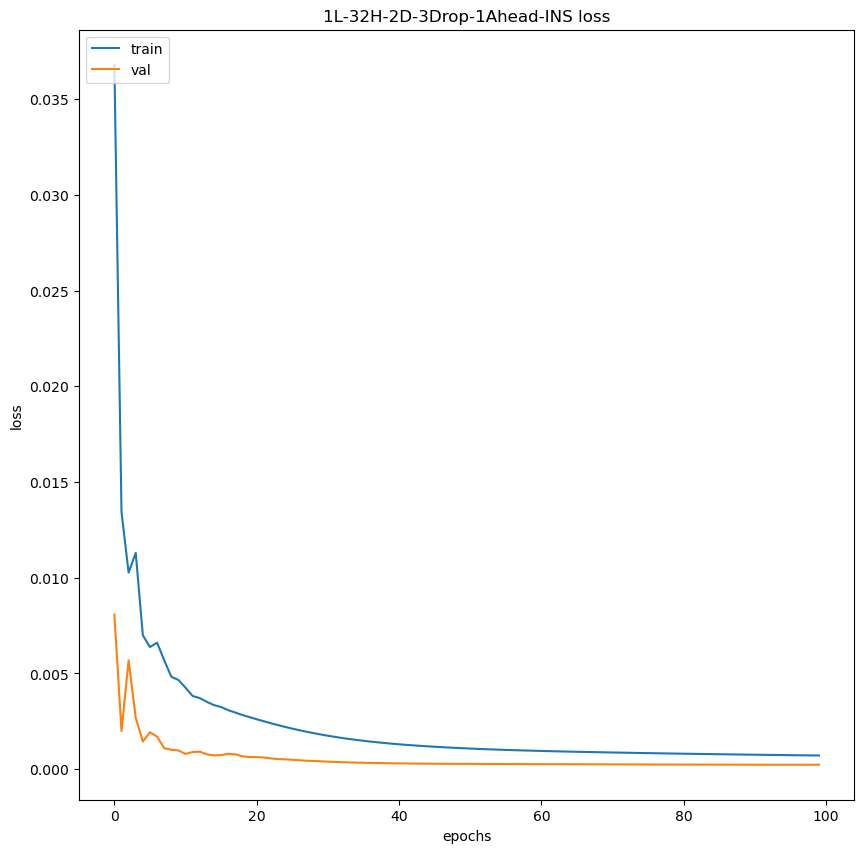

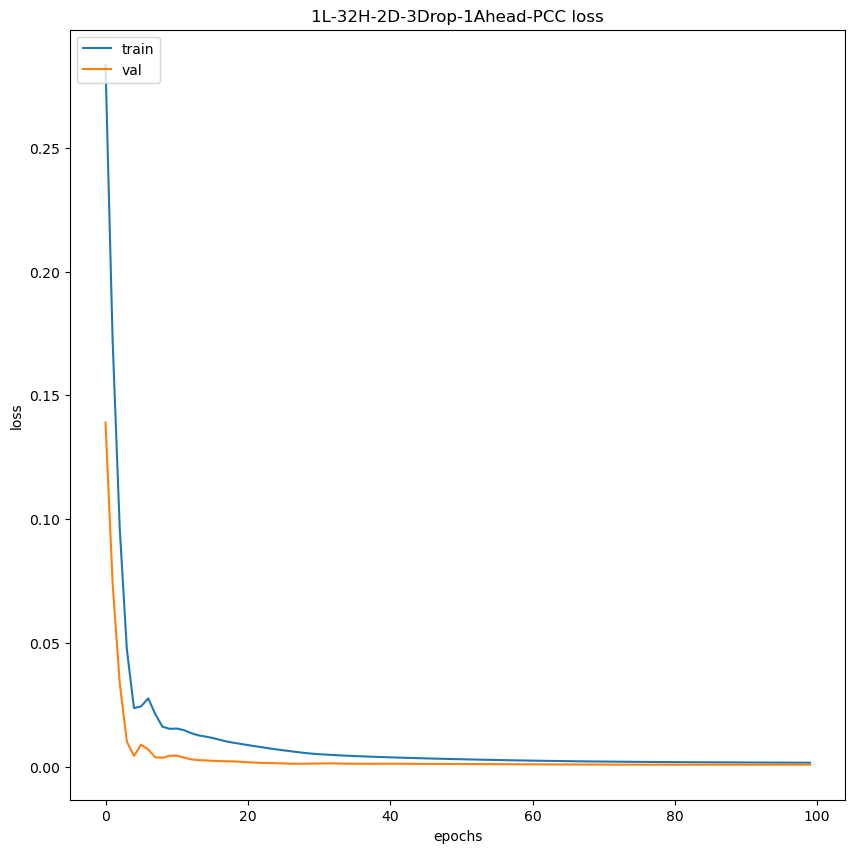

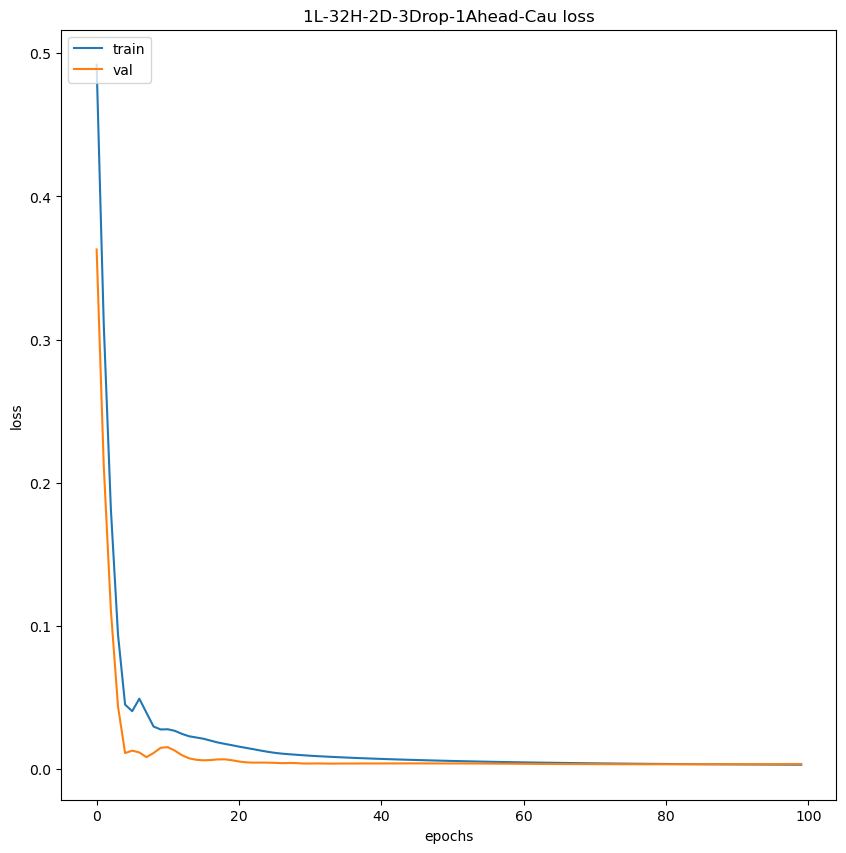

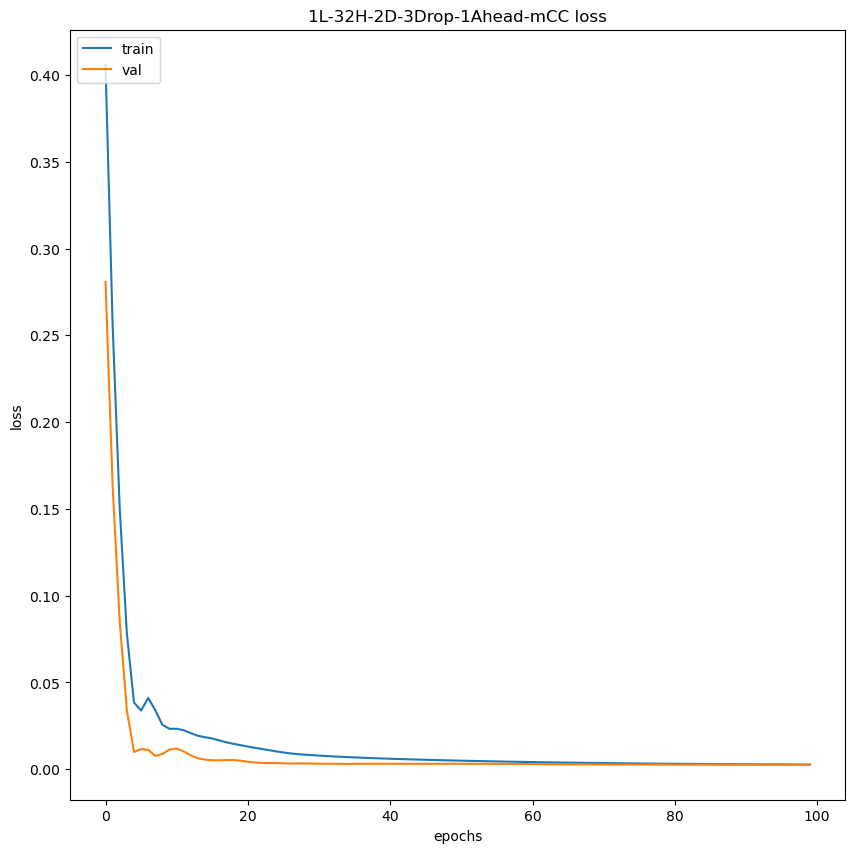

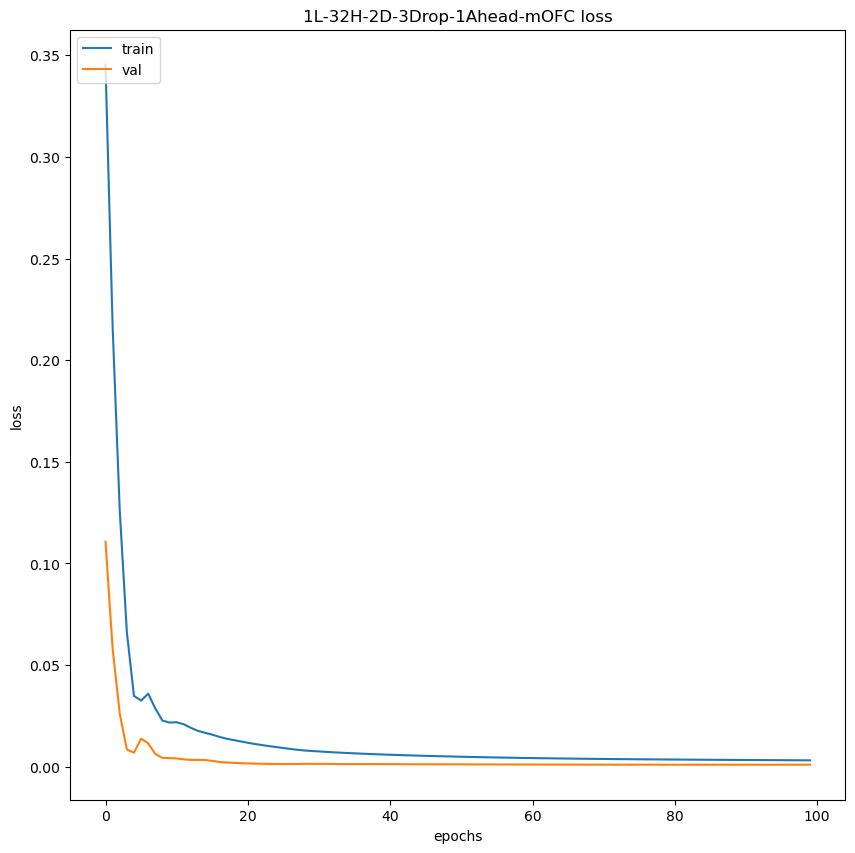

...

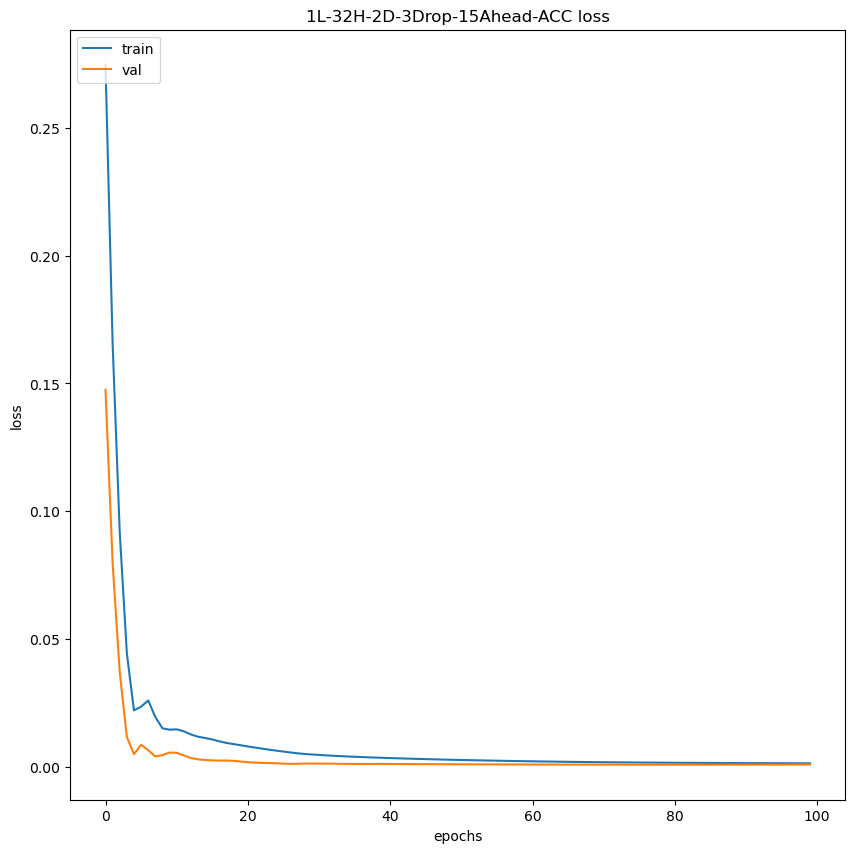

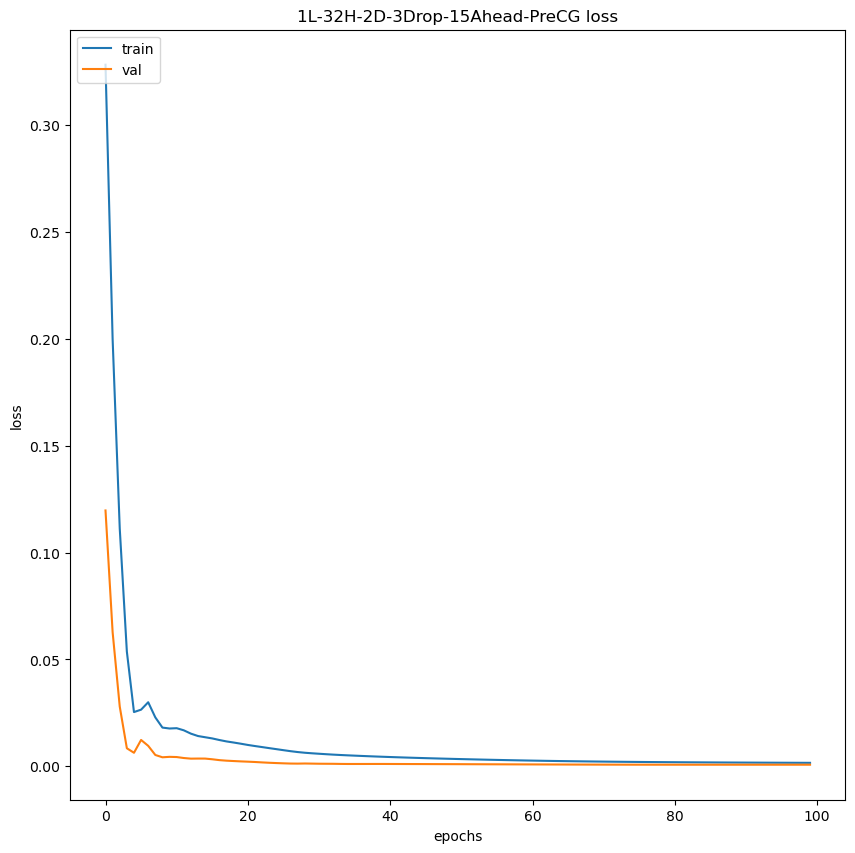

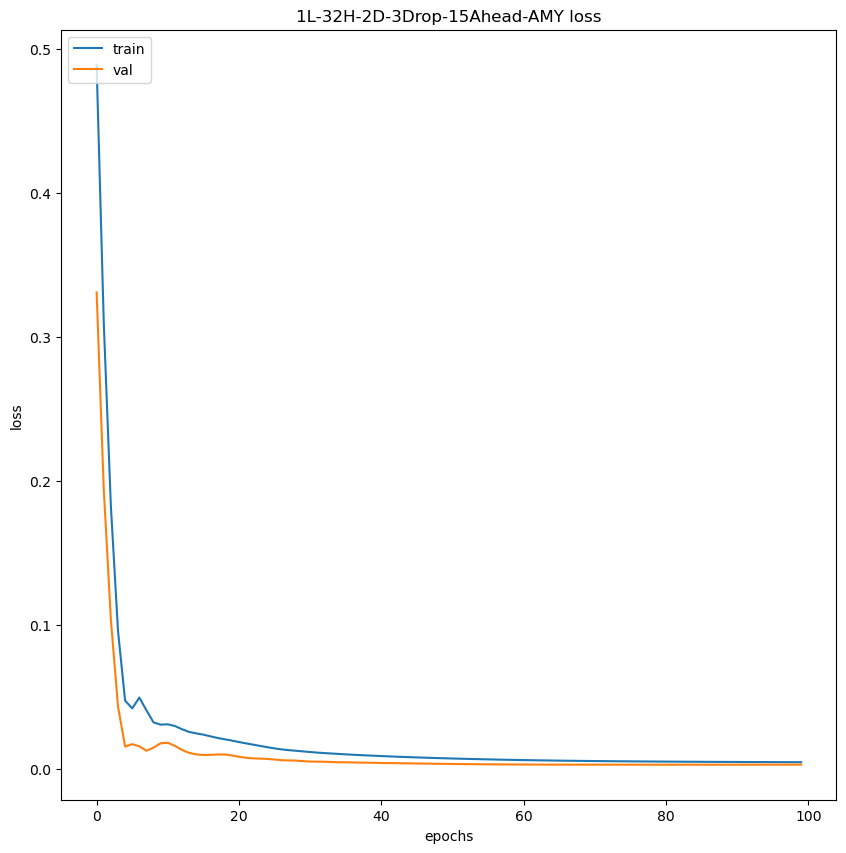

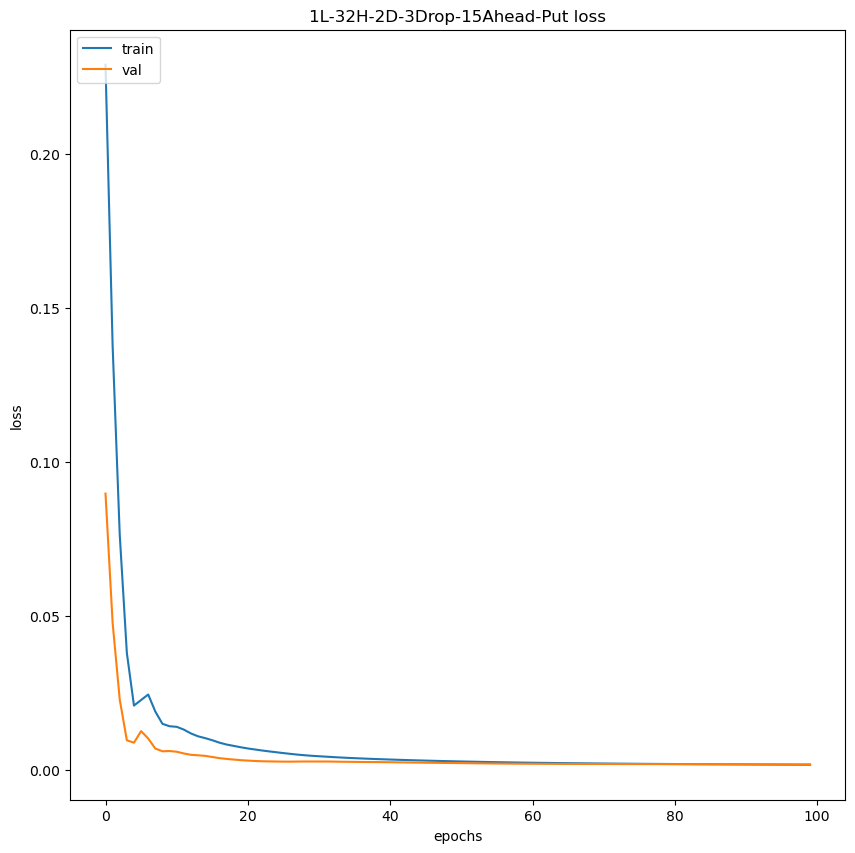

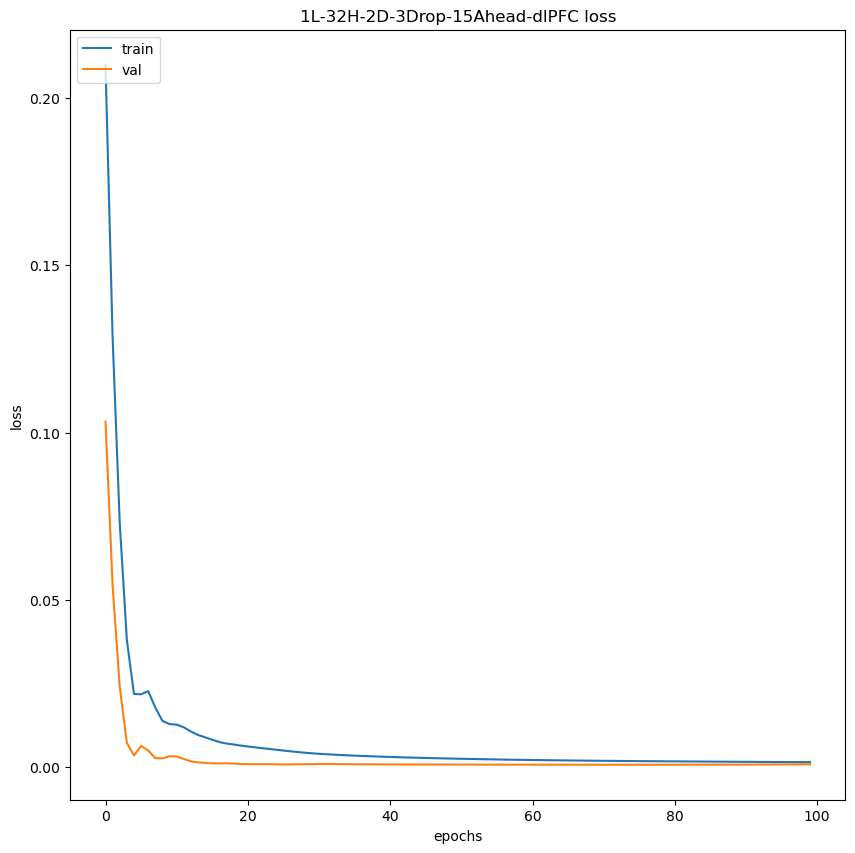

In [32]:
histories = list()
with tf.device('/device:GPU:0'):
    for LOOK_AHEAD in LOOK_AHEADS:
        history = list()
        for j in range(len(ROI_names)):
            hist = models[LOOK_AHEAD-1][j].fit(
                        train_data_generator[LOOK_AHEAD-1][j].generate(),
                        steps_per_epoch=train_data[i].shape[0]//TRAIN_BATCH_SIZE,
                        epochs=EPOCHS,
                        validation_data=test_data_generator[LOOK_AHEAD-1][j].generate(),
                        validation_steps=test_data[i].shape[0]//TEST_BATCH_SIZE,
                        callbacks=[model_checkpoint_callbacks[LOOK_AHEAD-1][j]]
                        )
            models[LOOK_AHEAD-1][j].save_weights(f"./Models/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[j]}/model_weights-{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-{LOOK_AHEAD}Ahead-{ROI_names[j]}")
            plot_train_test_loss(hist, f"{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-{LOOK_AHEAD}Ahead-{ROI_names[j]}", j)
            history.append(hist)
        histories.append(history)

In [33]:
for LOOK_AHEAD in LOOK_AHEADS:
    for i in range(len(ROI_names)):
        models[LOOK_AHEAD-1][i].load_weights(f"./Models/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[i]}/model_weights-{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-{LOOK_AHEAD}Ahead-{ROI_names[i]}")

In [34]:
preds = [[models[LOOK_AHEAD-1][i].predict(next(test_data_generator[LOOK_AHEAD-1][i].generate())[0]) for i in range(len(ROI_names))] for LOOK_AHEAD in LOOK_AHEADS]

2022-08-29 07:40:09.963577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:10.018775: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 1s/step


2022-08-29 07:40:10.900242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:10.960503: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 730ms/step


2022-08-29 07:40:11.627562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:11.672252: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 673ms/step


2022-08-29 07:40:12.315091: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:12.359032: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 638ms/step


2022-08-29 07:40:12.964293: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:13.007882: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 668ms/step


2022-08-29 07:40:13.650041: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:13.694284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 668ms/step


2022-08-29 07:40:14.340417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:14.384587: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 690ms/step


2022-08-29 07:40:15.044612: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:15.088895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:40:15.691571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:15.735518: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:40:16.328245: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:16.371800: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:16.974221: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:17.018665: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 635ms/step


2022-08-29 07:40:17.617540: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:17.661795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:40:18.256084: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:18.301901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:40:18.895822: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:18.939810: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:40:19.537110: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:19.581078: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:40:20.173549: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:20.217912: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 632ms/step


2022-08-29 07:40:20.817413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:20.861250: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 636ms/step


2022-08-29 07:40:21.473428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:21.518284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 629ms/step


2022-08-29 07:40:22.112913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:22.156607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:40:22.754023: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:22.797908: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:40:23.439961: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:23.484162: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 628ms/step


2022-08-29 07:40:24.079267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:24.123370: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:40:24.712421: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:24.756336: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:40:25.354817: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:25.399489: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:25.992089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:26.035956: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 639ms/step


2022-08-29 07:40:26.647099: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:26.690937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 610ms/step


2022-08-29 07:40:27.271806: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:27.318497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:40:27.900680: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:27.944485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:40:28.540508: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:28.584439: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 610ms/step


2022-08-29 07:40:29.166113: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:29.210440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:40:29.807100: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:29.851090: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:30.444306: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:30.487661: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:40:31.082012: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:31.126041: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 610ms/step


2022-08-29 07:40:31.708017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:31.752478: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:40:32.342793: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:32.387211: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:32.987024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:33.030867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:33.629125: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:33.673386: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:40:34.275157: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:34.319533: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:40:34.918944: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:34.962799: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:40:35.551733: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:35.595814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:40:36.210604: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:36.254375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:40:36.833545: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:36.877565: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:40:37.462394: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:37.506586: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:40:38.087268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:38.132214: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:38.729178: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:38.773286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:40:39.369140: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:39.412499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:40:40.005377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:40.049475: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:40:40.641413: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:40.685222: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 609ms/step


2022-08-29 07:40:41.266894: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:41.311115: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:41.908140: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:41.951905: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:42.549306: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:42.593136: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:40:43.177541: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:43.226779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:40:43.804202: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:43.848338: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:40:44.439862: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:44.483659: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:45.078754: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:45.122274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 609ms/step


2022-08-29 07:40:45.706123: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:45.750128: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 634ms/step


2022-08-29 07:40:46.356058: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:46.400186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:40:46.994760: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:47.041026: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:40:47.625641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:47.670508: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:40:48.260935: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:48.304889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:40:48.889889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:48.934116: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:40:49.513410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:49.557721: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:40:50.142171: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:50.186598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:40:50.776845: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:50.820793: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 610ms/step


2022-08-29 07:40:51.402726: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:51.447340: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:40:52.027758: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:52.071481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:40:52.657060: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:52.701262: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:40:53.292073: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:53.335675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:40:53.921284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:53.965411: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:40:54.562176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:54.606410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:40:55.202207: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:55.246677: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:40:55.833942: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:55.878099: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:40:56.470839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:56.514372: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:40:57.097257: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:57.141341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:40:57.736519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:57.780926: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:40:58.365130: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:58.409708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:40:58.990997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:59.034919: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:40:59.624453: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:40:59.668334: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:41:00.247428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:00.291165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:41:00.877537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:00.921561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:41:01.515538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:01.559780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:41:02.154958: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:02.198420: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:41:02.784708: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:02.828375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 603ms/step


2022-08-29 07:41:03.404910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:03.449208: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:41:04.043350: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:04.087010: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 609ms/step


2022-08-29 07:41:04.668711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:04.712698: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:41:05.306619: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:05.360571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:41:05.951281: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:05.995126: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:41:06.574862: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:06.619143: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:41:07.207503: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:07.251581: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:41:14.234766: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:14.299936: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 7s 7s/step


2022-08-29 07:41:15.000712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:15.044654: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:15.640312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:15.685173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 629ms/step


2022-08-29 07:41:16.283697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:16.327965: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 667ms/step


2022-08-29 07:41:16.973508: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:17.026538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 766ms/step


2022-08-29 07:41:17.813901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:17.866377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 817ms/step


2022-08-29 07:41:18.585915: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:18.686665: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 732ms/step


2022-08-29 07:41:19.339688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:19.384290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:41:19.977612: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:20.022121: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 636ms/step


2022-08-29 07:41:20.628630: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:20.672223: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 636ms/step


2022-08-29 07:41:21.284872: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:21.328552: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:21.918814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:21.962779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 643ms/step


2022-08-29 07:41:22.580700: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:22.625157: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 631ms/step


2022-08-29 07:41:23.226009: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:23.270990: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:41:23.854184: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:23.898006: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 645ms/step


2022-08-29 07:41:24.515057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:24.563001: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 645ms/step


2022-08-29 07:41:25.177063: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:25.233386: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:41:25.836517: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:25.880653: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 648ms/step


2022-08-29 07:41:26.505313: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:26.550177: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 646ms/step


2022-08-29 07:41:27.155419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:27.207641: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:27.794477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:27.846827: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:41:28.437178: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:28.481290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 649ms/step


2022-08-29 07:41:29.103360: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:29.148406: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:41:29.739899: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:29.795079: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:41:30.381056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:30.425040: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 634ms/step


2022-08-29 07:41:31.080153: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:31.124200: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:41:31.710842: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:31.754931: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:41:32.340431: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:32.390382: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:41:32.981907: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:33.030072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:41:33.625264: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:33.668647: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:41:34.251563: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:34.295430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:41:34.894513: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:34.939438: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:41:35.530412: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:35.578843: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 629ms/step


2022-08-29 07:41:36.179076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:36.223845: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:41:36.811146: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:36.856706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 628ms/step


2022-08-29 07:41:37.456195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:37.500555: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:41:38.088171: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:38.132706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 609ms/step


2022-08-29 07:41:38.716754: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:38.765653: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 634ms/step


2022-08-29 07:41:39.364644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:39.407852: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:41:40.012873: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:40.057160: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:41:40.638222: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:40.681977: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:41:41.266231: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:41.310994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:41:41.892414: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:41.936315: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:41:42.518922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:42.564186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:41:43.148043: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:43.191796: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:43.789858: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:43.834442: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 641ms/step


2022-08-29 07:41:44.444776: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:44.489249: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:41:45.078652: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:45.122581: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:45.716392: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:45.760526: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:41:46.344180: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:46.388405: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:41:46.977738: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:47.023818: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:41:47.606887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:47.651127: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:41:48.253585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:48.299991: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 629ms/step


2022-08-29 07:41:48.930576: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:48.975376: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 654ms/step


2022-08-29 07:41:49.566288: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:49.610439: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:41:50.193666: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:50.237856: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:41:50.832788: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:50.877237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:41:51.470834: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:51.515176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:41:52.111326: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:52.154977: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:41:52.742004: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:52.796921: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 645ms/step


2022-08-29 07:41:53.405407: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:53.457137: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:41:54.044872: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:54.088937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:41:54.684720: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:54.729366: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:55.321531: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:55.365933: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:41:55.953908: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:55.998258: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:41:56.590638: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:56.634584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:41:57.214248: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:57.258029: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:41:57.850928: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:57.895440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:41:58.488397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:58.532970: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:41:59.130260: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:59.174803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 631ms/step


2022-08-29 07:41:59.779318: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:41:59.825329: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:00.419518: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:00.464072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:01.060275: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:01.104832: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:42:01.698984: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:01.742845: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:42:02.328196: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:02.372440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:42:02.955646: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:02.999272: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:42:03.591064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:03.636199: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:42:04.233564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:04.277995: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 635ms/step


2022-08-29 07:42:04.918282: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:04.962805: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 648ms/step


2022-08-29 07:42:05.559995: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:05.604973: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:42:06.199548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:06.243850: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:06.829191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:06.873164: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:07.464960: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:07.509150: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:42:08.092630: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:08.136419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:08.731605: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:08.776826: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:42:09.372672: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:09.416761: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:42:10.007330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:10.051247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:10.645395: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:10.690019: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:42:11.288637: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:11.332671: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:42:11.916443: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:11.959917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:12.551104: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:12.598831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 642ms/step


2022-08-29 07:42:13.218707: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:13.262964: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:13.851161: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:13.895773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:42:14.480624: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:14.525712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:42:15.116354: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:15.162635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 630ms/step


2022-08-29 07:42:15.760488: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:15.804241: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:16.398454: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:16.443203: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:42:17.027254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:17.071994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:17.665548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:17.711096: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:42:18.302441: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:18.346849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:42:18.943101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:18.987089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:42:19.575976: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:19.620536: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:20.211695: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:20.255851: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:20.847661: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:20.891602: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:42:21.476996: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:21.521551: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:42:22.105957: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:22.150151: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:42:22.731156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:22.775989: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:42:23.369638: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:23.414499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:42:24.008262: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:24.054403: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:42:24.641165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:24.685372: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:42:25.282760: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:25.326714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:25.923146: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:25.967480: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:42:26.568049: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:26.612948: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:42:27.194268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:27.238543: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:27.832270: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:27.876548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:28.473510: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:28.518072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 609ms/step


2022-08-29 07:42:29.098827: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:29.143070: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:29.739520: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:29.788507: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:30.382679: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:30.429119: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 628ms/step


2022-08-29 07:42:31.025596: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:31.069465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:42:31.687485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:31.732335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:42:32.315203: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:32.365198: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 633ms/step


2022-08-29 07:42:32.971477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:33.015908: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 633ms/step


2022-08-29 07:42:33.614278: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:33.658570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:34.252535: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:34.297518: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:42:34.892463: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:34.936696: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:35.521202: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:35.565733: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 681ms/step


2022-08-29 07:42:36.218431: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:36.262699: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 611ms/step


2022-08-29 07:42:36.852016: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:36.896504: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 628ms/step


2022-08-29 07:42:37.491343: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:37.536356: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:42:38.121167: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:38.167809: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:42:38.758692: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:38.803064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:42:39.392276: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:39.436170: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:42:40.026993: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:40.071135: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:42:40.660864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:40.705284: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:41.301260: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:41.346235: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:42:41.943739: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:41.989063: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:42:42.580612: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:42.625098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:43.215149: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:43.259175: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:42:43.849938: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:43.894300: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:44.491903: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:44.536475: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:45.131065: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:45.175117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:42:45.764334: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:45.808432: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:46.398471: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:46.443241: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:42:47.028208: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:47.073213: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:42:47.660738: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:47.704991: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:42:48.299273: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:48.343469: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:42:48.937803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:48.984812: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:49.571242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:49.615792: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:42:50.209205: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:50.253877: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 616ms/step


2022-08-29 07:42:50.841830: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:50.885965: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:42:51.473076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:51.517232: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 620ms/step


2022-08-29 07:42:52.108140: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:52.151861: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:52.749034: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:52.793353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:42:53.382966: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:53.427711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 622ms/step


2022-08-29 07:42:54.021181: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:54.071042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:42:54.663712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:54.707997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:42:55.303098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:55.347492: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 618ms/step


2022-08-29 07:42:55.938048: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:55.982535: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 606ms/step


2022-08-29 07:42:56.559001: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:56.603211: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 610ms/step


2022-08-29 07:42:57.187179: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:57.231343: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:42:57.815686: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:57.859938: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:42:58.441976: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:58.488194: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 625ms/step


2022-08-29 07:42:59.082964: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:59.127291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:42:59.726175: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:42:59.771059: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:43:00.359841: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:00.403647: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:43:00.995254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:01.039022: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:43:01.619224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:01.663584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:43:02.258758: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:02.303226: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:43:02.893881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:02.938002: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:43:03.530804: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:03.576242: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


2022-08-29 07:43:04.172247: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:04.217279: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 619ms/step


2022-08-29 07:43:04.808206: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:04.858962: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 628ms/step


2022-08-29 07:43:05.451011: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:05.500268: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:43:06.091198: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:06.135165: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 613ms/step


2022-08-29 07:43:06.719946: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:06.763906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:43:07.344657: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:07.389307: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:43:07.984431: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:08.029874: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:43:08.614129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:08.659335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 621ms/step


2022-08-29 07:43:09.248301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:09.292386: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:43:09.879595: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:09.923910: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 608ms/step


2022-08-29 07:43:10.504062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:10.548505: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:43:11.143422: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:11.190261: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 623ms/step


2022-08-29 07:43:11.785449: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:11.830612: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 612ms/step


2022-08-29 07:43:12.412124: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:12.455898: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 627ms/step


2022-08-29 07:43:13.057335: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:13.101697: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:43:13.690831: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:13.734145: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 605ms/step


2022-08-29 07:43:14.312416: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:14.358200: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 615ms/step


2022-08-29 07:43:14.945286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:14.992885: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 626ms/step


2022-08-29 07:43:15.586447: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:15.630506: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 607ms/step


2022-08-29 07:43:16.210841: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:16.255696: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:43:16.842179: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:16.886805: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 617ms/step


2022-08-29 07:43:17.475108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:17.519297: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 610ms/step


2022-08-29 07:43:18.101567: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:18.145373: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 614ms/step


2022-08-29 07:43:18.732662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-08-29 07:43:18.781235: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 624ms/step


In [35]:
a_TRs = np.array([56, 67, 73, 81, 134, 142, 155, 167, 174, 180])
d_TRs = np.array([67, 72, 85, 89, 145, 154, 168, 174, 180, 188])
and_TRs = np.union1d(a_TRs, d_TRs)

def highlight_and(act, pred):
  min_y_list = list()
  max_y_list = list()
  for i in range(5):
    min_y_list.append(np.min(np.concatenate([act[a_TRs[2*i]:d_TRs[2*i+1]], pred[a_TRs[2*i]:d_TRs[2*i+1]]])))
    max_y_list.append(np.max(np.concatenate([act[a_TRs[2*i]:d_TRs[2*i+1]], pred[a_TRs[2*i]:d_TRs[2*i+1]]])))
    # plt.fill_betweenx(y=[min_y_list[i], max_y_list[i]], x1=a_TRs[2*i], x2=d_TRs[2*i+1], color='gray', alpha=0.1)
    plt.fill_betweenx(y=[min_y_list[i], max_y_list[i]], x1=a_TRs[2*i], x2=a_TRs[2*i+1], color='violet', alpha=0.4)
    plt.fill_betweenx(y=[min_y_list[i], max_y_list[i]], x1=d_TRs[2*i], x2=d_TRs[2*i+1], color='greenyellow', alpha=0.4)

In [ ]:
for LOOK_AHEAD in LOOK_AHEADS:
    for i in range(len(ROI_names)):
      
        actual_test_data_output = np.squeeze(test_data_unscaled[i])[:,LOOK_AHEAD:] 
        pred_test_data_output = scalers[i].inverse_transform(np.hstack([preds[LOOK_AHEAD-1][i][:,:,0], preds[LOOK_AHEAD-1][i][:,:LOOK_AHEAD,0]]))[:,:-LOOK_AHEAD]
        plt.figure(figsize=(24, 18))

        for j in range(NUM_TEST_SUBS-1):
  
            ax = plt.subplot(3, 3, j + 1)
            plt.plot(actual_test_data_output[j,:])
            plt.plot(pred_test_data_output[j,:])
            # highlight_and(actual_test_data_output[j,:], pred_test_data_output[j,:])
            plt.xticks(np.concatenate([np.array([0]), and_TRs - LOOK_AHEAD]), np.concatenate([np.array([LOOK_AHEAD]), and_TRs]))
            plt.ylabel("Average BOLD")
            plt.xlabel("TRs")
            plt.title(f"Avg BOLD Preds of {LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-{LOOK_AHEAD}Ahead for {j+1}th Test Sub's {ROI_names[i]}")
            plt.legend(['actual', 'pred'])
        plt.savefig(f"./Plots/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[i]}/{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-{LOOK_AHEAD}Ahead-Preds.png")

In [37]:
TR_ROI_corr_subs, AVG_TR_ROI_corr_subs = list(), list()
for LOOK_AHEAD in LOOK_AHEADS:
    print(f"***Each Test Subject's Correlation Coefficient between {LOOK_AHEAD} ahead predicted and actual average BOLD values for ROIs***")
    print()
    avg_r = list()
    ROI_corr_subs = list()
    for i in range(len(ROI_names)):
        actual_test_data_output = np.squeeze(test_data_unscaled[i])[:,LOOK_AHEAD:] 
        pred_test_data_output = scalers[i].inverse_transform(np.hstack([preds[LOOK_AHEAD-1][i][:,:,0], preds[LOOK_AHEAD-1][i][:,:LOOK_AHEAD,0]]))[:,:-LOOK_AHEAD]
        corr_subs = list()
        for j in range(NUM_TEST_SUBS):
            corr_subs.append(np.round(np.corrcoef(actual_test_data_output[j,:], pred_test_data_output[j,:])[0,1], 2))
            print(f"{ROI_names[i]} for {j+1}th sub: {corr_subs[j]}")
        ROI_corr_subs.append(corr_subs)
    TR_ROI_corr_subs.append(ROI_corr_subs)
    print()

    print(f"***Average across test subjects Correlation Coefficient between {LOOK_AHEAD} ahead predicted and actual average BOLD values for ROIs***")
    print()
    ROI_corr_subs = list()
    for i in range(len(ROI_names)):
        actual_test_data_output = np.squeeze(test_data_unscaled[i])[:,LOOK_AHEAD:] 
        pred_test_data_output = scalers[i].inverse_transform(np.hstack([preds[LOOK_AHEAD-1][i][:,:,0], preds[LOOK_AHEAD-1][i][:,:LOOK_AHEAD,0]]))[:,:-LOOK_AHEAD]
        sum_r = 0
        for j in range(NUM_TEST_SUBS):
            sum_r += np.corrcoef(actual_test_data_output[j,:], pred_test_data_output[j,:])[0,1]
        ROI_corr_subs.append(np.round(sum_r / NUM_TEST_SUBS, 2))
        print(f"{ROI_names[i]}: {ROI_corr_subs[i]}")
    AVG_TR_ROI_corr_subs.append(ROI_corr_subs)

***Each Test Subject's Correlation Coefficient between 1 ahead predicted and actual average BOLD values for ROIs***

INS for 1th sub: 0.24
INS for 2th sub: 0.59
INS for 3th sub: 0.05
INS for 4th sub: 0.09
INS for 5th sub: 0.25
INS for 6th sub: -0.17
INS for 7th sub: 0.41
INS for 8th sub: 0.82
INS for 9th sub: 0.59
INS for 10th sub: 0.44
PCC for 1th sub: 0.49
PCC for 2th sub: 0.13
PCC for 3th sub: 0.48
PCC for 4th sub: 0.3
PCC for 5th sub: 0.29
PCC for 6th sub: -0.15
PCC for 7th sub: 0.1
PCC for 8th sub: 0.13
PCC for 9th sub: 0.31
PCC for 10th sub: 0.02
Cau for 1th sub: -0.04
Cau for 2th sub: 0.34
Cau for 3th sub: 0.02
Cau for 4th sub: 0.09
Cau for 5th sub: 0.05
Cau for 6th sub: 0.31
Cau for 7th sub: 0.25
Cau for 8th sub: -0.07
Cau for 9th sub: 0.09
Cau for 10th sub: 0.14
mCC for 1th sub: 0.01
mCC for 2th sub: -0.04
mCC for 3th sub: 0.14
mCC for 4th sub: 0.11
mCC for 5th sub: 0.07
mCC for 6th sub: -0.02
mCC for 7th sub: -0.01
mCC for 8th sub: 0.2
mCC for 9th sub: 0.14
mCC for 10th sub: 

In [38]:
TR_ROI_corr_subs = np.transpose(np.array(TR_ROI_corr_subs), (1,0,2))
AVG_TR_ROI_corr_subs = np.array(AVG_TR_ROI_corr_subs).T
print(TR_ROI_corr_subs.shape, AVG_TR_ROI_corr_subs.shape)

(19, 15, 10) (19, 15)


In [ ]:
for i in range(len(ROI_names)):
    plt.figure(figsize=(24, 18))

    for j in range(NUM_TEST_SUBS-1):

        ax = plt.subplot(3, 3, j + 1)
        plt.plot(TR_ROI_corr_subs[i, :, j])
        plt.xticks(np.arange(1, 16))
        plt.ylabel("Correlation")
        plt.xlabel("Ahead TRs")
        plt.title(f"Avg BOLD Corr of {LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop for {j+1}th Test Sub's {ROI_names[i]}")
    plt.savefig(f"./Plots/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[i]}/{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-Upto-15Ahead-Corrs.png")

In [ ]:
for i in range(len(ROI_names)):
    plt.figure(figsize=(10, 10))
    plt.plot(AVG_TR_ROI_corr_subs[i])
    plt.xticks(np.arange(1, 16))
    plt.ylabel("Correlation")
    plt.xlabel("Ahead TRs")
    plt.title(f"Avg BOLD Corr of {LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop Across Test Subs")
    plt.savefig(f"./Plots/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[i]}/{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-Upto-15Ahead-Corrs-Avg-Across-Subs.png")

In [41]:
for LOOK_AHEAD in LOOK_AHEADS:
    print(f"***Model's Final MSE(Train) Loss between {LOOK_AHEAD} ahead predicted and actual average BOLD values for ROIs for the Train Subjects***")
    print()
    for i in range(len(ROI_names)):
        print(ROI_names[i]+":", np.round(histories[LOOK_AHEAD-1][i].history['loss'][-1], 5))
    print()
    print(f"***Model's Final MSE(Validation) Loss between {LOOK_AHEAD} ahead predicted and actual average BOLD values for ROIs for the Test Subjects***")
    print()
    for i in range(len(ROI_names)):
        print(ROI_names[i]+":", np.round(histories[LOOK_AHEAD-1][i].history['val_loss'][-1], 5))

***Model's Final MSE(Train) Loss between 1 ahead predicted and actual average BOLD values for ROIs for the Train Subjects***

INS: 0.00071
PCC: 0.00159
Cau: 0.00323
mCC: 0.00264
mOFC: 0.00311
l_OFC: 0.002
vlPFC: 0.00134
dmPFC: 0.00223
VC: 0.00201
mPFC: 0.00218
pSTS: 0.00161
TP: 0.00296
IPL: 0.00143
Nac: 0.00313
ACC: 0.00141
PreCG: 0.00149
AMY: 0.00373
Put: 0.00158
dlPFC: 0.00141

***Model's Final MSE(Validation) Loss between 1 ahead predicted and actual average BOLD values for ROIs for the Test Subjects***

INS: 0.00023
PCC: 0.0008
Cau: 0.00373
mCC: 0.00263
mOFC: 0.00097
l_OFC: 0.00105
vlPFC: 0.00129
dmPFC: 0.001
VC: 0.00113
mPFC: 0.002
pSTS: 0.0018
TP: 0.00163
IPL: 0.00086
Nac: 0.0038
ACC: 0.0009
PreCG: 0.00074
AMY: 0.00424
Put: 0.00171
dlPFC: 0.00085
***Model's Final MSE(Train) Loss between 2 ahead predicted and actual average BOLD values for ROIs for the Train Subjects***

INS: 0.00083
PCC: 0.00159
Cau: 0.0033
mCC: 0.0026
mOFC: 0.00324
l_OFC: 0.00198
vlPFC: 0.00152
dmPFC: 0.00227
VC

In [42]:
MSE_subs, AVG_MSE_subs = list(), list()
for LOOK_AHEAD in LOOK_AHEADS:
    print(f"***Model's Final MSE(Validation) Loss between {LOOK_AHEAD} ahead predicted and actual avg voxel BOLD values for ROIs for the Test Subjects***")
    print()
    ROI_MSE_subs, ROI_AVG_MSE_subs = list(), list()
    for i in range(len(ROI_names)):
        actual_test_data_output = np.squeeze(test_data_unscaled[i][:,LOOK_AHEAD:,:])
        pred_test_data_output = scalers[i].inverse_transform(np.hstack([preds[LOOK_AHEAD-1][i][:,:,0], preds[LOOK_AHEAD-1][i][:,:LOOK_AHEAD,0]]))[:,:-LOOK_AHEAD]
        ROI_MSE_subs.append(tf.keras.losses.mean_squared_error(actual_test_data_output, pred_test_data_output).numpy())
        print(ROI_names[i]+" for Each Validation Subject:", ROI_MSE_subs[i])
        ROI_AVG_MSE_subs.append(np.mean(tf.keras.metrics.mean_squared_error(actual_test_data_output, pred_test_data_output), axis=-1))
        print(ROI_names[i]+" :", ROI_AVG_MSE_subs[i])
    MSE_subs.append(ROI_MSE_subs)
    AVG_MSE_subs.append(ROI_AVG_MSE_subs)

***Model's Final MSE(Validation) Loss between 1 ahead predicted and actual avg voxel BOLD values for ROIs for the Test Subjects***

INS for Each Validation Subject: [2.9516659  0.799908   3.2156372  1.1280106  1.1624477  1.275948
 1.0663582  0.8569655  0.74130654 0.68675506]
INS : 1.3885002
PCC for Each Validation Subject: [7.2517414 1.7498733 8.423507  5.0975666 1.8836716 2.4788952 2.096491
 1.0510714 5.670858  1.3542923]
PCC : 3.7057967
Cau for Each Validation Subject: [24.464779   3.8291216 31.93632    4.365171  19.519112   5.0664988
  4.2683525 20.774073  49.725937  60.51299  ]
Cau : 22.446236
mCC for Each Validation Subject: [ 7.278691   1.8957207  6.4047966 14.16081   34.93213    2.0235448
  2.695787   3.9474103  8.571749   3.752842 ]
mCC : 8.566348
mOFC for Each Validation Subject: [8.980048  3.2796254 3.5362453 1.9420353 2.9814367 7.411803  2.5990515
 2.0841548 2.1036742 4.1048107]
mOFC : 3.902289
l_OFC for Each Validation Subject: [16.802307   4.691277  14.456796   3.1221163  

ACC for Each Validation Subject: [ 5.937524   2.0687933 24.319334   1.8776249  1.6366246  1.1661004
  2.8679607  1.0771828  3.278303   1.1612724]
ACC : 4.539072
PreCG for Each Validation Subject: [ 3.6733224   1.5747409   2.6735415   2.2837908   1.5489407   3.2659492
 10.307698    0.83898664  1.5043226   1.9755915 ]
PreCG : 2.9646883
AMY for Each Validation Subject: [ 7.030835   5.481219  95.441826   4.182704  28.656963   7.759739
  7.322541  15.452897   5.9372683 14.378631 ]
AMY : 19.164463
Put for Each Validation Subject: [ 3.093854  56.49812    5.3759613  0.9445991  1.3675123  1.0986643
  1.4666928  6.2081103  1.3840533  2.5311239]
Put : 7.996869
dlPFC for Each Validation Subject: [12.672821    1.884153    2.9315956   1.5447491   4.829992    1.4564549
  2.124382    1.7229462   1.2887686   0.93452126]
dlPFC : 3.1390386
***Model's Final MSE(Validation) Loss between 4 ahead predicted and actual avg voxel BOLD values for ROIs for the Test Subjects***

INS for Each Validation Subject: [7

AMY : 20.521952
Put for Each Validation Subject: [ 4.0082088 60.94116    6.05125    1.0396683  1.3295014  1.1524792
  1.6638703  6.7213206  1.3451788  3.2643726]
Put : 8.7517
dlPFC for Each Validation Subject: [11.731856   2.1334124  3.1794338  1.5550493  4.7767987  1.5791719
  2.210734   1.8423617  1.38389    0.7880352]
dlPFC : 3.1180744
***Model's Final MSE(Validation) Loss between 7 ahead predicted and actual avg voxel BOLD values for ROIs for the Test Subjects***

INS for Each Validation Subject: [8.347607  1.5130423 7.7228856 1.2899765 4.0554266 1.186251  1.3836524
 1.6006513 3.1265028 2.3621287]
INS : 3.2588127
PCC for Each Validation Subject: [6.348126  1.8438493 7.6958694 5.0562124 1.7593445 2.4435823 1.8312124
 1.0842824 4.771288  1.1205461]
PCC : 3.395431
Cau for Each Validation Subject: [25.946913   4.177254  34.390415   5.4727583 19.826134   4.7753835
  4.0593643 21.867031  55.900906  69.33641  ]
Cau : 24.575258
mCC for Each Validation Subject: [ 6.9443836  1.7584128  6.036

Put for Each Validation Subject: [ 3.5814352 60.72505    5.4864435  1.0107753  1.2990245  1.1554474
  1.6569158  6.419221   1.417799   2.9222867]
Put : 8.567441
dlPFC for Each Validation Subject: [16.771624   2.3499298  3.8981411  1.5802131  6.281318   2.1093705
  2.8681476  2.4378607  1.4975742  0.8411357]
dlPFC : 4.0635314
***Model's Final MSE(Validation) Loss between 10 ahead predicted and actual avg voxel BOLD values for ROIs for the Test Subjects***

INS for Each Validation Subject: [10.35905    1.7963552  8.819451   1.3784285  4.863301   1.2271101
  1.6699584  2.1173716  3.9357371  2.8820016]
INS : 3.9048762
PCC for Each Validation Subject: [6.8717422 2.1442783 7.8255434 5.7562356 2.1058376 2.4771807 1.8577372
 1.2670587 5.3948803 1.2890964]
PCC : 3.6989589
Cau for Each Validation Subject: [22.88773    3.8541675 31.40586    4.6234517 17.527739   4.558461
  4.1003194 18.871792  49.878414  60.73816  ]
Cau : 21.844608
mCC for Each Validation Subject: [ 6.784838   1.6546874  5.655498

AMY for Each Validation Subject: [10.267006   8.598151  48.5623     7.147792  21.944149   8.073567
 10.135893  13.3016615  7.291447  12.817578 ]
AMY : 14.813954
Put for Each Validation Subject: [ 3.4267824  65.719765    5.7680798   0.84456533  1.2946253   1.194726
  1.5028849   6.052867    1.338667    2.7849917 ]
Put : 8.992796
dlPFC for Each Validation Subject: [14.464469    1.9311525   3.6607943   1.8380327   5.74091     1.6261526
  2.4557042   2.2697368   1.5343349   0.78758246]
dlPFC : 3.6308873
***Model's Final MSE(Validation) Loss between 13 ahead predicted and actual avg voxel BOLD values for ROIs for the Test Subjects***

INS for Each Validation Subject: [14.646917   2.3559961 11.989004   1.861372   6.9267044  1.4361336
  2.2714493  3.3617249  5.9680595  4.524016 ]
INS : 5.534138
PCC for Each Validation Subject: [7.8136153 2.0623002 8.845497  5.036454  2.363464  2.2537007 2.269857
 1.3657393 6.132386  1.4971251]
PCC : 3.9640136
Cau for Each Validation Subject: [26.72274    4.06

Put for Each Validation Subject: [ 4.3518763 61.40857    7.01322    0.7847627  1.2409806  1.1203058
  1.4448936  7.306994   1.2243688  3.463689 ]
Put : 8.935966
dlPFC for Each Validation Subject: [12.630871    1.4685432   3.3771167   1.9305369   4.963772    1.3806545
  2.279473    1.9429173   1.4166102   0.68681943]
dlPFC : 3.2077312


In [43]:
MSE_subs = np.transpose(np.array(MSE_subs), (1, 0, 2))
AVG_MSE_subs = np.array(AVG_MSE_subs).T
print(MSE_subs.shape, AVG_MSE_subs.shape)

(19, 15, 10) (19, 15)


In [ ]:
for i in range(len(ROI_names)):
    plt.figure(figsize=(24, 18))

    for j in range(NUM_TEST_SUBS-1):

        ax = plt.subplot(3, 3, j + 1)
        plt.plot(MSE_subs[i, :, j])
        plt.xticks(np.arange(1, 16))
        plt.ylabel("MSE Loss")
        plt.xlabel("Ahead TRs")
        plt.title(f"Avg BOLD MSE Losses of {LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop for {j+1}th Test Sub's {ROI_names[i]}")
    plt.savefig(f"./Plots/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[i]}/{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-Upto-15Ahead-Losses.png")

In [ ]:
for i in range(len(ROI_names)):
    plt.figure(figsize=(10, 10))
    plt.plot(AVG_MSE_subs[i])
    plt.xticks(np.arange(1, 16))
    plt.ylabel("MSE Loss")
    plt.xlabel("Ahead TRs")
    plt.title(f"Avg BOLD MSE Losses of {LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop Across Test Subs")
    plt.savefig(f"./Plots/OLD/LSTM/AVG-BOLD-TEST-ENLARGED/{ROI_names[i]}/{LSTM_LAYERS}L-{HIDDEN_UNITS}H-{DENSE_LAYERS}D-{int(DROPOUT_PROB*10)}Drop-Upto-15Ahead-Losses-Avg-Across-Subs.png")